## KU Non-Thesis Master of Science in Data Science Project
### Foxie - Movie Recommendation System

<img src="images/cinema.jpg">

**Recommender System:** It is very specific kind of a machine learning system that predicts ratings or preferences
that a user might give to an item. So a recommender system is recommending things to people based on their past behavior and the similar behavior of others.

**Purpose:** Recommender systems are one of the most widely used data science applications today. They are used to anticipate a user's "rating" or "preference" for a certain item. Almost every major IT firm has used them in some capacity. It's used by Amazon to recommend products to customers, YouTube to determine which video to play next on autoplay, and Facebook to suggest pages to like and people to follow. Recommendation systems, particularly in streaming services, are a key element of proposing goods to its users. Recommendation algorithms are critical for streaming movie services like Netflix, Disney, Amazon etc. for helping its customers to discover new movies to watch and have better user-friendly website to stay in the competition among others.

**What is the Idea:** In this post, I will build a recommendation engine with the help of Python, from simple to content-based and collaborative filtering recommender systems. I will show you how to implement different movie recommendation approaches and evaluate them to see which one has the best performance.

### Types of Recommendation Systems:

* **Simple Recommenders:** offer generalized recommendations to every user, based on movie popularity and/or genre. The basic idea behind this system is that movies that are more popular and critically acclaimed will have a higher probability of being liked by the average audience. An example could be IMDB Top 250.    


* **Content-based Recommenders:** suggest similar items based on a particular item. This system uses item metadata, such as genre, director, description, actors, etc. for movies, to make these recommendations. The general idea behind these recommender systems is that if a person likes a particular item, he or she will also like an item that is similar to it. And to recommend that, it will make use of the user's past item metadata. A good example could be YouTube, where based on your history, it suggests you new videos that you could potentially watch.    


* **Collaborative Filtering Engines:** these systems are widely used, and they try to predict the rating or preference that a user would give an item-based on past ratings and preferences of other users. Collaborative filters do not require item metadata like its content-based counterparts.    


#### The following figure shows different kinds of recommender systems:

<img src="images/Types.webp">

**Author:** Can Mergen  
**KU-ID:** 0078490  
**Date Created:**  


### Importing Necessary Libraries

In [1]:
import re
import ast
from urllib import request
import circlify
import datetime
import nltk
import json
import copy
import gzip
import shutil
import requests
import io
import string
#import pyodbc
import sqlalchemy
import urllib
from keras.preprocessing import image
import tensorflow as tf
from multiprocessing.pool import ThreadPool
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
import random
import missingno as msno
import bar_chart_race as bcr
import operator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity
from scipy import stats
from ast import literal_eval
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from matplotlib.ticker import PercentFormatter
nltk.download('popular', quiet=True)
nltk.download('punkt') 
nltk.download('wordnet') 
import matplotlib.font_manager as mfm
emoji_font = mfm.FontProperties(fname="/System/Library/Fonts/Apple Color Emoji.ttc")

#pd.set_option ('display.max.rows', None)
#pd.set_option('display.max.columns', None)
#pd.set_option('display.width', None)
#pd.set_option ('display.max.colwidth', None)

#pd.reset_option("all")

!pip install selenium
!brew upgrade
!brew install --cask chromium
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException, ElementNotInteractableException
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
driver = webdriver.Chrome('chromedriver',chrome_options=chrome_options)

from bs4 import BeautifulSoup
import time
from selenium.webdriver import Chrome
from selenium.webdriver.chrome.options import Options
import json
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.firefox.options import Options
options = Options()
options.add_argument('--disable-blink-features=AutomationControlled')
               
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
plt.style.use('ggplot')

[nltk_data] Downloading package punkt to /Users/canmergen/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/canmergen/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Running `brew update --auto-update`...
==> Auto-updated Homebrew!
Updated 2 taps (homebrew/core and homebrew/cask).
==> New Formulae
c
==> New Casks
apifox                                   macforge


To re-install chromium, run:
  brew reinstall --cask chromium


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/canmergen/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
/var/folders/67/jq5rgp0x0pqgdgwhzdq4ypsc0000gn/T/ipykernel_66740/3642460244.py:67: DeprecationWarning:

use options instead of chrome_options



In [2]:
#Importing path
movies_path = "movies/"
title_path = "titles/"
imdb_path = "IMDB_dataset/"
images_path = "images/"

## Data Loading and Initial Cleanup 

**Main Movie Dataset Information:**

* **adult:** Indicates if the movie is X-Rated or Adult.       
* **belongs_to_collection:** A stringified dictionary that gives information on the movie series the particular film belongs to.      
* **budget:** The budget of the movie in dollars.     
* **genres:** A stringified list of dictionaries that list out all the genres associated with the movie.    
* **homepage:** The Official Homepage of the move.     
* **id:** The ID of the move.      
* **imdb_id:** The IMDB ID of the movie.      
* **original_language:** The language in which the movie was originally shot in.     
* **original_title:** The original title of the movie.      
* **overview:** A brief blurb of the movie.      
* **popularity:** The Popularity Score assigned by TMDB.      
* **poster_path:** The URL of the poster image.      
* **production_companies:** A stringified list of production companies involved with the making of the movie.     
* **production_countries:** A stringified list of countries where the movie was shot/produced in.      
* **release_date:** Theatrical Release Date of the movie.      
* **revenue:** The total revenue of the movie in dollars.      
* **runtime:** The runtime of the movie in minutes.        
* **spoken_languages:** A stringified list of spoken languages in the film.       
* **status:** The status of the movie (Released, To Be Released, Announced, etc.)       
* **tagline:** The tagline of the movie.      
* **title:** The Official Title of the movie.       
* **video:** Indicates if there is a video present of the movie with TMDB.       
* **vote_average:** The average rating of the movie.      
* **vote_count:** The number of votes by users, as counted by TMDB.      

**The main dataset comes from the movies folder which comes from:** https://www.kaggle.com/datasets/rounakbanik/the-movies-dataset   

* This dataset files contain metadata for all 45,000 movies listed in the Full MovieLens Dataset. The dataset consists of movies released on or before July 2017. 

**Also to add the Neftlix, Disney, Prime and Hulu platforms, I used first:** https://www.kaggle.com/datasets/shivamb/netflix-shows  

**To gather more films I used IMDB dataset from:** https://www.imdb.com/interfaces/

**From "movies" and "titles" folders:**

In [3]:
#Printing their lengths and checking if it is similar to other
link = pd.read_csv(movies_path + "links.csv")
s_link = pd.read_csv(movies_path + "links_small.csv")
print('\033[1m'+"Length of 'link':"+ '\033[0m',len(link))
print('\033[1m'+"Length of 's_link':"+ '\033[0m',len(s_link),"\n")

#The s_link contains some elements which are not in link dataset
#So, we need to combine two datasets into one
temp = link.append(s_link)
print('\033[1m'+"The Combination Temp Dataset:"+'\033[0m',"\n")
print(temp.head(5),"\n")
print('\033[1m'+"Full Combination of Two Datasets Length:"+'\033[0m',len(temp))

#Remove not unique rows from the dataset
Complete_Link = temp.drop_duplicates()
print('\033[1m'+"Removed Not-Unique Rows From Dataset Length:"+'\033[0m',len(Complete_Link),"\n")
print('\033[1m'+"The Complete_Link Dataset:"+'\033[0m',"\n")
print(Complete_Link.head(5),"\n")

Length of 'link': 45843
Length of 's_link': 9125 

The Combination Temp Dataset: 

   movieId  imdbId   tmdbId
0        1  114709    862.0
1        2  113497   8844.0
2        3  113228  15602.0
3        4  114885  31357.0
4        5  113041  11862.0 

Full Combination of Two Datasets Length: 54968
Removed Not-Unique Rows From Dataset Length: 45853 

The Complete_Link Dataset: 

   movieId  imdbId   tmdbId
0        1  114709    862.0
1        2  113497   8844.0
2        3  113228  15602.0
3        4  114885  31357.0
4        5  113041  11862.0 



In [4]:
#Checking if the datasets lost its rows or not
new_list = []

#Checking if all elements in s_link are in complete_link
a = s_link.apply(tuple, 1).isin(Complete_Link.apply(tuple,1))
for i in range(len(a)):
    if a[i] == False:
        new_list.append(False)

#Checking if all elements in link are in complete_link
b = link.apply(tuple, 1).isin(Complete_Link.apply(tuple,1))
for j in range(len(b)):
    if b[j] == False:
        new_list.append(False)
        
#new_list doesn't contain any item so the combining is done perfectly
print('\033[1m'+"The combination was successful if this is empty:"+'\033[0m',new_list) 

The combination was successful if this is empty: []


In [4]:
#Printing their lengths and checking if it is similar to other

rating = pd.read_csv(movies_path + "ratings.csv")
s_rating = pd.read_csv(movies_path + "ratings_small.csv")

print('\033[1m'+"Length of 'rating':"+ '\033[0m',len(rating))
print('\033[1m'+"Length of 's_rating':"+ '\033[0m',len(s_rating),"\n")

#The s_link contains some elements which are not in link dataset
#So, we need to combine two datasets into one

temp = rating.append(s_rating)
print('\033[1m'+"The Combination Temp Dataset:"+'\033[0m',"\n")
print(temp.head(5),"\n")
print('\033[1m'+"Full Combination of Two Datasets Length:"+'\033[0m',len(temp))

#Remove not unique rows from the dataset

Complete_Rating = temp.drop_duplicates()
print('\033[1m'+"Removed Not-Unique Rows From Dataset Length:"+'\033[0m',len(Complete_Rating),"\n")
print('\033[1m'+"The Complete_Rating Dataset:"+'\033[0m',"\n")
print(Complete_Rating.head(5),"\n")

Length of 'rating': 26024289
Length of 's_rating': 100004 

The Combination Temp Dataset: 

   userId  movieId  rating   timestamp
0       1      110     1.0  1425941529
1       1      147     4.5  1425942435
2       1      858     5.0  1425941523
3       1     1221     5.0  1425941546
4       1     1246     5.0  1425941556 

Full Combination of Two Datasets Length: 26124293
Removed Not-Unique Rows From Dataset Length: 26124293 

The Complete_Rating Dataset: 

   userId  movieId  rating   timestamp
0       1      110     1.0  1425941529
1       1      147     4.5  1425942435
2       1      858     5.0  1425941523
3       1     1221     5.0  1425941546
4       1     1246     5.0  1425941556 



In [6]:
#Checking if the datasets lost its rows or not
new_list = []

#Checking if all elements in s_link are in complete_link
a = s_rating.apply(tuple, 1).isin(Complete_Rating.apply(tuple,1))
for i in range(len(a)):
    if a[i] == False:
        new_list.append(False)

#Checking if all elements in link are in complete_link
b = rating.apply(tuple, 1).isin(Complete_Rating.apply(tuple,1))
for j in range(len(b)):
    if b[j] == False:
        new_list.append(False)
        
#new_list doesn't contain any item so the combining is done perfectly
print('\033[1m'+"The combination was successful if this is empty:"+'\033[0m',new_list) 

The combination was successful if this is empty: []


I added the two datasets together and created a better one. The combination of both rating and link are completed. So, I will upload the other documents from the movies folder now.

In [5]:
movie_metadata = pd.read_csv(movies_path+'movies_metadata.csv', low_memory=False)
Keywords = pd.read_csv(movies_path+"keywords.csv")
Credits = pd.read_csv(movies_path+"credits.csv")

movie_metadata.head(5)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [6]:
#Checking if the movies repeated or not
item_counts = movie_metadata["title"].nunique()

print('\033[1m'+"Length of Movies Dataset:"+'\033[0m',len(movie_metadata))
print('\033[1m'+"Length of Unique Movie Names Dataset:"+'\033[0m',item_counts,"\n")

#There may be an ambiguity in the dataset, we must check it before it is too late
check = movie_metadata[movie_metadata.duplicated(subset=["title"],keep='first')]

if len(movie_metadata) - 1 - item_counts == len(check): #Because movie_metadata's first column is the column names
    print('\033[1m'+"Checking Ambiguity:"+'\033[0m',"There is an ambiguity in the Movie titles") 
else:
    print('\033[1m'+"Checking Ambiguity:"+'\033[0m',"There isn't any ambiguity in the Movie titles")

Length of Movies Dataset: 45466
Length of Unique Movie Names Dataset: 42277 

Checking Ambiguity: There is an ambiguity in the Movie titles


In [7]:
#Checking the cause of this issue
print('\033[1m'+"Repeated Movie Names:"+'\033[0m',"\n")
print(movie_metadata["title"].value_counts(),"\n")

Repeated Movie Names: 

Cinderella              11
Hamlet                   9
Alice in Wonderland      9
Beauty and the Beast     8
Les Misérables           8
                        ..
Cluny Brown              1
Babies                   1
The Green Room           1
Captain Conan            1
Queerama                 1
Name: title, Length: 42277, dtype: int64 



In [8]:
#Checking one of these names (for ex: Cinderella)
movie_metadata[movie_metadata["title"] == "Cinderella"].head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
993,False,"{'id': 55419, 'name': 'Cinderella Collection',...",2900000,"[{'id': 10751, 'name': 'Family'}, {'id': 14, '...",http://movies.disney.com/cinderella-1950,11224,tt0042332,en,Cinderella,Cinderella has faith her dreams of a better li...,...,1950-03-04,263591415.0,74.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The greatest love story ever told.,Cinderella,False,6.8,1760.0
13076,False,NaN,0,"[{'id': 10770, 'name': 'TV Movie'}, {'id': 107...",NaN,42884,tt0128996,en,Cinderella,Updated version of the classic Rodgers and Ham...,...,1997-11-02,0.0,88.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Cinderella,False,6.1,28.0
23507,False,NaN,0,"[{'id': 14, 'name': 'Fantasy'}, {'id': 18, 'na...",NaN,92349,tt0003772,en,Cinderella,Based on Charles Perrault's fairy tale: Cinder...,...,1914-12-28,0.0,52.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Cinderella,False,5.4,7.0
23518,False,NaN,0,"[{'id': 16, 'name': 'Animation'}, {'id': 10751...",NaN,105875,tt0910852,en,Cinderella,"Cinderella, the beautiful and kind-hearted rag...",...,2002-08-06,0.0,48.0,"[{'iso_639_1': 'af', 'name': 'Afrikaans'}]",Released,The version children love!,Cinderella,False,6.0,2.0
28391,False,NaN,0,"[{'id': 10751, 'name': 'Family'}, {'id': 10770...",http://www.betafilm.com/en/product/do/detail.h...,261985,tt1781790,en,Cenerentola,Once upon a time in post-war Rome: 13-year old...,...,2011-10-30,0.0,180.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Cinderella,False,5.3,9.0


**Explanation:** Even though there was an ambiguity in the movie names, below dataset explains that these films created with the same name but in different years. If we do that process to other films, we see the same result for every one of them. **So, the ambiguity is no longer exist and we have a clear dataset.** 

In [9]:
# Adding titles column to the main metadata dataset
netflix = pd.read_csv(title_path+"netflix_titles.csv")
hulu = pd.read_csv(title_path+"hulu_titles.csv")
amazon_prime = pd.read_csv(title_path+"amazon_prime_titles.csv")
disney_plus = pd.read_csv(title_path+"disney_plus_titles.csv")

#Adding their platforms to their datasets
netflix["platform"] = "Netflix"
hulu["platform"] = "Hulu"
amazon_prime["platform"] = "Amazon Prime"
disney_plus["platform"] = "Disney Plus"

#Adding all title datasets together
temp1 = netflix.append(hulu)
temp2 = temp1.append(amazon_prime)
title_dataset = temp2.append(disney_plus)

#Selecting only movies from these datasets 
movie_title_dataset = title_dataset[title_dataset["type"] == "Movie"]
tv_title_dataset = title_dataset[title_dataset["type"] == "TV Show"]

#### Visual description of these platforms with eachother

In [10]:
movie_count = movie_title_dataset["platform"].value_counts()
print(movie_count)

Amazon Prime    7814
Netflix         6131
Hulu            1484
Disney Plus     1052
Name: platform, dtype: int64


In [11]:
tv_count = tv_title_dataset["platform"].value_counts()
print(tv_count)

Netflix         2676
Amazon Prime    1854
Hulu            1589
Disney Plus      398
Name: platform, dtype: int64


In [12]:
#Checking the movies and tv shows for each platform and compare them with pie charts
py.init_notebook_mode()

trace1 = go.Pie(
     values=[7814, 6131, 1484, 1052],
     labels=["Amazon Prime","Netflix","Hulu","Disney Plus"],
     domain=dict(x=[0, 0.5]),
     name="Movie",
     title ="Movie Platforms",
     titleposition= "top center",
     hoverinfo="label+percent+name",
)

trace2 = go.Pie(
     values=[1854,2676,1589,398],
     labels=["Amazon Prime","Netflix","Hulu","Disney Plus"],
     domain=dict(x=[0.5, 1.0]),
     name="TV Show",
     title ="TV Show Platforms",
     titleposition= "top center",
     hoverinfo="label+percent+name",
)

layout = go.Layout(title="Movie / TV Show Platforms Comparison")
data = [trace1, trace2]
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='simple-pie-subplot')

* **As you can see from the above graphs, Amazon Prime has higher "Movie" rate than other platforms whereas Netflix has more "TV Shows" rate than others. You can also compare their values by checking the indices on the right.**

In [13]:
movie_title_dataset.head(5)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,platform
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",Netflix
6,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ...",NaN,"September 24, 2021",2021,PG,91 min,Children & Family Movies,Equestria's divided. But a bright-eyed hero be...,Netflix
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...","United States, Ghana, Burkina Faso, United Kin...","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Netflix
9,s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, T...",United States,"September 24, 2021",2021,PG-13,104 min,"Comedies, Dramas",A woman adjusting to life after a loss contend...,Netflix
12,s13,Movie,Je Suis Karl,Christian Schwochow,"Luna Wedler, Jannis Niewöhner, Milan Peschel, ...","Germany, Czech Republic","September 23, 2021",2021,TV-MA,127 min,"Dramas, International Movies",After most of her family is murdered in a terr...,Netflix


In [14]:
watch_titles = movie_title_dataset[["title","release_year","platform"]]
watch_titles.head(5)

,title,release_year,platform
0,Dick Johnson Is Dead,2020,Netflix
6,My Little Pony: A New Generation,2021,Netflix
7,Sankofa,1993,Netflix
9,The Starling,2021,Netflix
12,Je Suis Karl,2021,Netflix


In [15]:
#Checking if the created data has duplicate rows except the platform 
#Because the same movie can be found in different platforms
duplicate = watch_titles[watch_titles.duplicated(["title","release_year"])]
print(duplicate["title"].value_counts().count())

304


There are 304 duplicate rows, which means we have same movies in different platforms. In order to solve this problem we have to eliminate these duplicated rows while concatenating platform names into single column.

In [16]:
duplicate = duplicate.groupby(["title","release_year"])["platform"].apply(', '.join).reset_index()
duplicate.head(5)

,title,release_year,platform
0,1 Night in San Diego,2020,Amazon Prime
1,10 Things I Hate About You,1999,Disney Plus
2,10.0 Earthquake,2014,Amazon Prime
3,12 Dates of Christmas,2011,Disney Plus
4,21,2008,"Hulu, Amazon Prime"


**As you can see even in the 5th row, there was a movie which was published in both platforms (Hulu and Amazon Prime).**  
* I will do the same operation on the watch_titles dataset too to see if the problem is solved or not.

In [17]:
watch_titles = watch_titles.groupby(["title","release_year"])["platform"].apply(', '.join).reset_index()
watch_titles.head(5)

,title,release_year,platform
0,"""Mixed Up""",2020,Amazon Prime
1,#Alive,2020,Netflix
2,#AnneFrank - Parallel Stories,2019,Netflix
3,#FriendButMarried,2018,Netflix
4,#FriendButMarried 2,2020,Netflix


In [18]:
watch_titles["platform"].unique()

array(['Amazon Prime', 'Netflix', 'Hulu', 'Hulu, Amazon Prime',
       'Amazon Prime, Disney Plus', 'Disney Plus',
       'Netflix, Hulu, Amazon Prime', 'Netflix, Amazon Prime',
       'Netflix, Hulu', 'Netflix, Disney Plus', 'Hulu, Disney Plus',
       'Netflix, Hulu, Disney Plus'], dtype=object)

I can't see if the problem is solved or not so I will try to check the duplicate dataset's title on this dataset to see what it display on platform column.

In [19]:
watch_titles[watch_titles["title"] == "21"]

,title,release_year,platform
200,21,2008,"Netflix, Hulu, Amazon Prime"


As you can see the issue has been solved. The title "21" has 3 platforms and all of them are listed. So, we can continue the further operations.

In [20]:
movies_poster = pd.read_csv("IMDB_dataset/movieposters.csv", encoding = "ISO-8859-1")
movies_poster.rename(columns = {'imdbId':'imdb_id','Genre':'movie_genre'}, inplace = True)
movies_poster.drop('Title', axis=1, inplace=True)
movies_poster.head(5)

,imdb_id,Imdb Link,IMDB Score,movie_genre,Poster
0,114709,http://www.imdb.com/title/tt114709,8.3,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...
1,113497,http://www.imdb.com/title/tt113497,6.9,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...
2,113228,http://www.imdb.com/title/tt113228,6.6,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...
3,114885,http://www.imdb.com/title/tt114885,5.7,Comedy|Drama|Romance,https://images-na.ssl-images-amazon.com/images...
4,113041,http://www.imdb.com/title/tt113041,5.9,Comedy|Family|Romance,https://images-na.ssl-images-amazon.com/images...


In [21]:
movies_poster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40108 entries, 0 to 40107
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   imdb_id      40108 non-null  int64  
 1   Imdb Link    40108 non-null  object 
 2   IMDB Score   40060 non-null  float64
 3   movie_genre  39963 non-null  object 
 4   Poster       39383 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 1.5+ MB


In [22]:
for i in range(len(movies_poster)):
    movies_poster["imdb_id"][i] = "tt0" + str(movies_poster["imdb_id"][i])

In [23]:
#Checking if they are the same
movies_poster["imdb_id"][0] == movie_metadata["imdb_id"][0]

True

In [24]:
movie_metadata_temp = movie_metadata.merge(movies_poster,on="imdb_id",how="left")
movie_metadata_temp.head(5)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,status,tagline,title,video,vote_average,vote_count,Imdb Link,IMDB Score,movie_genre,Poster
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,Released,NaN,Toy Story,False,7.7,5415.0,http://www.imdb.com/title/tt114709,8.3,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,http://www.imdb.com/title/tt113497,6.9,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,http://www.imdb.com/title/tt113228,6.6,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,http://www.imdb.com/title/tt114885,5.7,Comedy|Drama|Romance,https://images-na.ssl-images-amazon.com/images...
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,http://www.imdb.com/title/tt113041,5.9,Comedy|Family|Romance,https://images-na.ssl-images-amazon.com/images...


In [25]:
movie_metadata_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45880 entries, 0 to 45879
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45880 non-null  object 
 1   belongs_to_collection  4536 non-null   object 
 2   budget                 45880 non-null  object 
 3   genres                 45880 non-null  object 
 4   homepage               7926 non-null   object 
 5   id                     45880 non-null  object 
 6   imdb_id                45863 non-null  object 
 7   original_language      45869 non-null  object 
 8   original_title         45880 non-null  object 
 9   overview               44926 non-null  object 
 10  popularity             45875 non-null  object 
 11  poster_path            45494 non-null  object 
 12  production_companies   45877 non-null  object 
 13  production_countries   45877 non-null  object 
 14  release_date           45793 non-null  object 
 15  re

In [26]:
Movies = movie_metadata_temp.merge(watch_titles, on='title', how='left')
Movies = Movies[Movies['status'] == 'Released'] 
Movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45723 entries, 0 to 46176
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45723 non-null  object 
 1   belongs_to_collection  4526 non-null   object 
 2   budget                 45723 non-null  object 
 3   genres                 45723 non-null  object 
 4   homepage               7927 non-null   object 
 5   id                     45723 non-null  object 
 6   imdb_id                45708 non-null  object 
 7   original_language      45713 non-null  object 
 8   original_title         45723 non-null  object 
 9   overview               44803 non-null  object 
 10  popularity             45723 non-null  object 
 11  poster_path            45350 non-null  object 
 12  production_companies   45723 non-null  object 
 13  production_countries   45723 non-null  object 
 14  release_date           45645 non-null  object 
 15  re

In [27]:
#Since I categorized the dataset only the "Released" values of "status" column, I don't need this column anymore.
Movies = Movies.drop("status", axis=1)

In [28]:
#Before correcting the data I inplaced the nan values with other platforms.
Movies["platform"].fillna("Other Platforms", inplace = True)

In [29]:
#Movies['imdb_id'] = Movies['imdb_id'].str[3:]
Movies = Movies[Movies['imdb_id'].notna()]
Movies.head(5)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,title,video,vote_average,vote_count,Imdb Link,IMDB Score,movie_genre,Poster,release_year,platform
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,Toy Story,False,7.7,5415.0,http://www.imdb.com/title/tt114709,8.3,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...,1995.0,Disney Plus
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Jumanji,False,6.9,2413.0,http://www.imdb.com/title/tt113497,6.9,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Grumpier Old Men,False,6.5,92.0,http://www.imdb.com/title/tt113228,6.6,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Waiting to Exhale,False,6.1,34.0,http://www.imdb.com/title/tt114885,5.7,Comedy|Drama|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Father of the Bride Part II,False,5.7,173.0,http://www.imdb.com/title/tt113041,5.9,Comedy|Family|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms


In [30]:
Movies_recommender = Movies.copy()

In [31]:
link_rating =  Complete_Link.merge(Complete_Rating, on='movieId', how='left')
link_rating.rename(columns = {'imdbId':'imdb_id','tmdbId':'tmdb_id','userId':'user_id'}, inplace = True)

link_rating["imdb_id"] = link_rating["imdb_id"].astype(object)
link_rating = link_rating[link_rating['user_id'].notna()]
link_rating["user_id"] = link_rating["user_id"].astype(int)
link_rating.head()

,movieId,imdb_id,tmdb_id,user_id,rating,timestamp
0,1,114709,862.0,8,4.0,1.013444e+09
1,1,114709,862.0,9,4.5,1.073837e+09
2,1,114709,862.0,12,4.0,9.439122e+08
3,1,114709,862.0,20,4.0,1.368361e+09
4,1,114709,862.0,24,4.0,9.798699e+08


In [32]:
link_rating['imdb_id'] = "tt0" + link_rating['imdb_id'].astype(str)

In [33]:
link_rating.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26124293 entries, 0 to 26125020
Data columns (total 6 columns):
 #   Column     Dtype  
---  ------     -----  
 0   movieId    int64  
 1   imdb_id    object 
 2   tmdb_id    float64
 3   user_id    int64  
 4   rating     float64
 5   timestamp  float64
dtypes: float64(3), int64(2), object(1)
memory usage: 1.4+ GB


In [34]:
keyword_credit =  Keywords.merge(Credits, on='id', how='left')
print(len(keyword_credit))
keyword_credit.head()

46496


,id,keywords,cast,crew
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de..."
3,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de..."
4,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de..."


In [35]:
keyword_credit["id"] = keyword_credit["id"].astype(str)

In [36]:
keyword_credit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46496 entries, 0 to 46495
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        46496 non-null  object
 1   keywords  46496 non-null  object
 2   cast      46496 non-null  object
 3   crew      46496 non-null  object
dtypes: object(4)
memory usage: 1.8+ MB


In [37]:
Movies = Movies.merge(keyword_credit, on="id", how = "left")
print(len(Movies))
Movies.head(5)

46867


,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,vote_count,Imdb Link,IMDB Score,movie_genre,Poster,release_year,platform,keywords,cast,crew
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,5415.0,http://www.imdb.com/title/tt114709,8.3,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...,1995.0,Disney Plus,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de..."
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,2413.0,http://www.imdb.com/title/tt113497,6.9,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,92.0,http://www.imdb.com/title/tt113228,6.6,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de..."
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,34.0,http://www.imdb.com/title/tt114885,5.7,Comedy|Drama|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,173.0,http://www.imdb.com/title/tt113041,5.9,Comedy|Family|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de..."


In [376]:
Movies.shape

(44970, 29)

## Data Preprocessing and Feature Extraction

In this part I will look every column and do some calculations to see if that column is necessary or not. If it's not necessary for my research I will drop the column from the dataset. Also, I will solve the issues if there are NaN, not necessary or biased values in columns. So, I will try to go over every column one by one. 

In [38]:
Movies.set_index('id', inplace=True)

In [39]:
Movies.head(3)

,adult,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,vote_count,Imdb Link,IMDB Score,movie_genre,Poster,release_year,platform,keywords,cast,crew
id,,,,,,,,,,,,,,,,,,,,,
862,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,...,5415.0,http://www.imdb.com/title/tt114709,8.3,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...,1995.0,Disney Plus,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de..."
8844,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,...,2413.0,http://www.imdb.com/title/tt113497,6.9,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de..."
15602,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,...,92.0,http://www.imdb.com/title/tt113228,6.6,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de..."


In [40]:
Movies.columns

Index(['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'tagline', 'title', 'video', 'vote_average',
       'vote_count', 'Imdb Link', 'IMDB Score', 'movie_genre', 'Poster',
       'release_year', 'platform', 'keywords', 'cast', 'crew'],
      dtype='object')

<AxesSubplot:ylabel='id'>

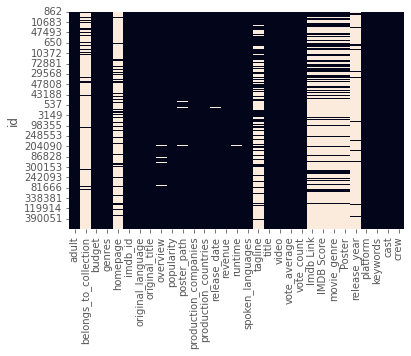

In [41]:
sns.heatmap(Movies.isnull(), cbar=False)

As it seems from the heatmap, adult-belongs to collection-tagline-release year columns have much more null values than other columns. I will try to focus on these columns.

**"adult" column:**

In [42]:
adult_percentage = Movies["adult"].value_counts(normalize=True) * 100
adult_count = Movies["adult"].value_counts()
print(adult_percentage,"\n")
print(adult_count)

False    99.98293
True      0.01707
Name: adult, dtype: float64 

False    46859
True         8
Name: adult, dtype: int64


There are exactly 8 adult movies in the dataset. This column doesn't effect my research because there is not enough adult movies data, it contains nearly 0.01723 % of my dataset. I will drop this column since it has no effect for future calculations.

In [43]:
Movies = Movies.drop("adult", axis=1)

**"belongs_to_collection" column:**

This column contains id, collection name, poster path and backdrop path all together as a dictionary. I only want this column to show the name of collections if any. Other than that, the other informations are still given in my dataset, they aren't needed to be in this column.

In [44]:
def turn_list(x):
    x = [item.replace(', ', '","') for item in x]
    x = [item.replace('[', '["') for item in x]
    x = [item.replace(']', '"]') for item in x]
    return x

In [45]:
type(Movies["belongs_to_collection"])

pandas.core.series.Series

In [46]:
Movies["belongs_to_collection"][0]

"{'id': 10194, 'name': 'Toy Story Collection', 'poster_path': '/7G9915LfUQ2lVfwMEEhDsn3kT4B.jpg', 'backdrop_path': '/9FBwqcd9IRruEDUrTdcaafOMKUq.jpg'}"

In [47]:
Movies["belongs_to_collection"] = '[' + Movies["belongs_to_collection"] + ']'

In [48]:
Movies['belongs_to_collection'] = Movies["belongs_to_collection"].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])

In [49]:
Movies['belongs_to_collection'] = Movies['belongs_to_collection'].apply(turn_list)
Movies['belongs_to_collection'] = Movies['belongs_to_collection'].tolist()
print(Movies["belongs_to_collection"][0],type(Movies['belongs_to_collection']))

['Toy Story Collection'] <class 'pandas.core.series.Series'>


In [50]:
Movies['belongs_to_collection'] = [''.join(map(str, l)) for l in Movies['belongs_to_collection']]

In [51]:
Movies['belongs_to_collection'].replace({"": np.nan}, inplace=True)

In [52]:
Movies['belongs_to_collection'].head(5)

id
862                Toy Story Collection
8844                                NaN
15602         Grumpy Old Men Collection
31357                               NaN
11862    Father of the Bride Collection
Name: belongs_to_collection, dtype: object

In [53]:
Movies['belongs_to_collection'].value_counts()

Pokémon Collection                            34
The Bowery Boys                               31
The Carry On Collection                       31
Totò Collection                               27
James Bond Collection                         26
                                              ..
Lady Snowblood Collection                      1
Superman (DC Universe Animated) Collection     1
The Dog Who Saved Christmas Collection         1
The Big Bottom Box                             1
Red Lotus Collection                           1
Name: belongs_to_collection, Length: 1689, dtype: int64

So, I achieved to only display the collection names if any and let other values seem empty.

**"budget"-"popularity" columns:**

In [54]:
Movies = Movies[~(Movies.budget.isin(['/ff9qCepilowshEtG2GYWwzt2bs4.jpg', 
                                      '/zV8bHuSL6WXoD6FWogP9j4x80bL.jpg',
                                      '/zaSf5OG7V8X8gqFvly88zDdRm46.jpg']))]
Movies = Movies.astype({'budget': int,'popularity': float})
Movies.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46867 entries, 862 to 461257
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   belongs_to_collection  4607 non-null   object 
 1   budget                 46867 non-null  int64  
 2   genres                 46867 non-null  object 
 3   homepage               8159 non-null   object 
 4   imdb_id                46867 non-null  object 
 5   original_language      46857 non-null  object 
 6   original_title         46867 non-null  object 
 7   overview               45909 non-null  object 
 8   popularity             46867 non-null  float64
 9   poster_path            46486 non-null  object 
 10  production_companies   46867 non-null  object 
 11  production_countries   46867 non-null  object 
 12  release_date           46792 non-null  object 
 13  revenue                46867 non-null  float64
 14  runtime                46611 non-null  float64
 15  spok

**"genres" column:**

This column is very similar to "belongs_to_collection" column. It contains not necessary and useless information (because it can also be found in other columns) as that. In order to make this column sense, I will only display the genres and drop other values.

In [55]:
regex = re.compile(r": '(.*?)'")
Movies['genres'] = Movies['genres'].apply(lambda x: ', '.join(regex.findall(x)))

In [56]:
Movies.head(3)

,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,...,vote_count,Imdb Link,IMDB Score,movie_genre,Poster,release_year,platform,keywords,cast,crew
id,,,,,,,,,,,,,,,,,,,,,
862,Toy Story Collection,30000000,"Animation, Comedy, Family",http://toystory.disney.com/toy-story,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,...,5415.0,http://www.imdb.com/title/tt114709,8.3,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...,1995.0,Disney Plus,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de..."
8844,NaN,65000000,"Adventure, Fantasy, Family",NaN,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,...,2413.0,http://www.imdb.com/title/tt113497,6.9,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de..."
15602,Grumpy Old Men Collection,0,"Romance, Comedy",NaN,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,...,92.0,http://www.imdb.com/title/tt113228,6.6,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de..."


In [57]:
print(Movies["genres"][0],type(Movies["genres"][0]))

Animation, Comedy, Family <class 'str'>


**"homepage" column:**

This column doesn't inclue any informational data. So only using if the homepage includes data or not would be sufficient for further evaluations.

In [58]:
Movies['homepage'] = Movies['homepage'].apply(lambda x: 0 if x == np.nan else 1)

**"original_title" column:**

In [59]:
Movies[Movies['original_title'] != Movies['title']][['title', 'original_title']].head()

,title,original_title
id,,
902,The City of Lost Children,La Cité des Enfants Perdus
37557,Shanghai Triad,摇啊摇，摇到外婆桥
78802,Wings of Courage,"Guillaumet, les ailes du courage"
11010,The Postman,Il postino
99040,The Confessional,Le confessionnal


In [60]:
original_title_only = Movies[Movies["original_title"] != Movies["title"]][["original_title"]].count().sum()
full_title_list = len(Movies)
different_titles = (original_title_only / full_title_list) * 100
print("The difference between titles are {:0.2f}%".format(different_titles))

The difference between titles are 25.19%


In [61]:
Movies = Movies.drop('original_title', axis=1)

Even though using this "original_title" column would make a difference and create different calculation opportunities, the dataset already have a language column. There wouldn't be any difference to keep or delete that column.

**"revenue" column:**

In [62]:
#To see how many revenues we can work with 
len(Movies) - len(Movies[Movies['revenue'] == 0])

7754

In [63]:
Movies['revenue'] = Movies['revenue'].replace(0, np.nan)

In the dataset, it visible that the majority of revenue is 0. This concludes that we don't have much information about tha revenues, but wecan still use this column to predict the rest of the movies. 

**"budget" column:**

The situation is same as the revenue column.

In [64]:
#To see how many budgets we can work with 
len(Movies) - len(Movies[Movies['budget'] == 0])

9286

In [65]:
Movies['budget'] = Movies['budget'].replace(0, np.nan)

**"profit" column:** (added)

In [66]:
Movies["profit"] = Movies["revenue"] / Movies["budget"]

In [67]:
Movies[Movies["profit"] != np.nan]["profit"].count()

5633

In [68]:
Movies.head(5)

,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,overview,popularity,poster_path,production_companies,...,Imdb Link,IMDB Score,movie_genre,Poster,release_year,platform,keywords,cast,crew,profit
id,,,,,,,,,,,,,,,,,,,,,
862,Toy Story Collection,30000000.0,"Animation, Comedy, Family",1,tt0114709,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]",...,http://www.imdb.com/title/tt114709,8.3,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...,1995.0,Disney Plus,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",12.451801
8844,NaN,65000000.0,"Adventure, Fantasy, Family",1,tt0113497,en,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...",...,http://www.imdb.com/title/tt113497,6.9,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",4.043035
15602,Grumpy Old Men Collection,NaN,"Romance, Comedy",1,tt0113228,en,A family wedding reignites the ancient feud be...,11.712900,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...",...,http://www.imdb.com/title/tt113228,6.6,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",NaN
31357,NaN,16000000.0,"Comedy, Drama, Romance",1,tt0114885,en,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,...,http://www.imdb.com/title/tt114885,5.7,Comedy|Drama|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",5.090760
11862,Father of the Bride Collection,NaN,Comedy,1,tt0113041,en,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...",...,http://www.imdb.com/title/tt113041,5.9,Comedy|Family|Romance,https://images-na.ssl-images-amazon.com/images...,NaN,Other Platforms,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",NaN


**"release_date" column:**

In [69]:
Movies['release_date'][0]

'1995-10-30'

In [70]:
Movies['year'] = pd.to_datetime(Movies['release_date']).dt.year
Movies['month'] = pd.to_datetime(Movies['release_date']).dt.month
Movies['day'] = pd.to_datetime(Movies['release_date']).dt.day
Movies.update(Movies[['year','month','day']].fillna(0))
Movies = Movies.astype({'year':'int','month':'int','day':'int'})

print(Movies['year'][0],Movies['month'][0],Movies['day'][0])

1995 10 30


In [71]:
Movies = Movies.drop('release_date', axis=1)

For the future evaluations, I dropped the release_date and create year,month and day seperately in the dataset.

**"poster_path" column:**

Even though, this dataset seems reliable, it contains missing data. The poster path url doesn't show up even I add the prefix to the beginning of the text, it contains missing data and I already implemented another poster path, so, I will drop this column from my dataset.

In [72]:
Movies.drop('poster_path', axis=1, inplace=True)

**"tagline" column:**

This column contains more nan values than information, but removing it directly would influence my content-based recommender system, because it contains relatable key elements. So, before dropping this row, I will merge it with the "overview" column and then drop it.

In [73]:
Movies['tagline'] = Movies['tagline'].fillna("")
Movies["overview"] = Movies["tagline"] + " " + Movies["overview"]
Movies["overview"] = Movies["overview"].fillna("")

In [74]:
Movies = Movies.drop("tagline", axis=1)

In [75]:
Movies = Movies.replace(r"^ +| +$", r"", regex=True)

**"release_year" column:**

This column indicates the released year of the film for given platform. Even if I know the release date, I will not be able to use this column because I don't have the time series data. The data would be valuable if the released that film influenced the profit for the given platform or not not for recommending movies.

In [76]:
temp_year = Movies[["release_year", "year"]]
temp_year["year"] = temp_year["year"].astype(float)
temp_year.head(5)

,release_year,year
id,,
862,1995.0,1995.0
8844,NaN,1995.0
15602,NaN,1995.0
31357,NaN,1995.0
11862,NaN,1995.0


In [77]:
release_year_difference = temp_year[(temp_year["release_year"] != np.nan) & (temp_year["year"] != temp_year["release_year"]) & (temp_year["release_year"].isnull() == False)]["release_year"].count()
print(release_year_difference)

2640


In [78]:
(temp_year["release_year"].isnull() == False).sum()

6328

In [79]:
total_value_diff = (release_year_difference / (temp_year["release_year"].isnull() == False).sum()) * 100
total_value_diff

41.719342604298355

In [80]:
Movies = Movies.drop("release_year", axis=1)

**"production_companies" column:**

In [81]:
Movies['production_companies'].isna().sum()

0

In [82]:
Movies['production_companies'] = Movies['production_companies'].apply(lambda x: ', '.join(regex.findall(x)))

In [83]:
Movies['production_companies']

id
862                                 Pixar Animation Studios
8844      TriStar Pictures, Teitler Film, Interscope Com...
15602                          Warner Bros., Lancaster Gate
31357                Twentieth Century Fox Film Corporation
11862            Sandollar Productions, Touchstone Pictures
                                ...                        
439050                                                     
111109                                          Sine Olivia
67758                               American World Pictures
227506                                            Yermoliev
461257                                                     
Name: production_companies, Length: 46867, dtype: object

In [84]:
print(Movies["production_companies"][0],type(Movies["production_companies"][0]))

Pixar Animation Studios <class 'str'>


**"production_countries" column:**

In [85]:
Movies['production_countries'] = Movies['production_countries'].apply(lambda x: ', '.join(regex.findall(x)))

In [86]:
print(Movies["production_countries"][0],type(Movies["production_countries"][0]))

US, United States of America <class 'str'>


**"spoken_languages" column:**

In [87]:
Movies['spoken_languages'] = Movies['spoken_languages'].apply(lambda x: ', '.join(regex.findall(x)))

In [88]:
print(Movies["spoken_languages"][0],type(Movies["spoken_languages"][0]))

en, English <class 'str'>


**"runtime" column:**

In [89]:
Movies['runtime'] = pd.to_timedelta(Movies['runtime'], unit='m')

In [90]:
Movies['runtime']

id
862      0 days 01:21:00
8844     0 days 01:44:00
15602    0 days 01:41:00
31357    0 days 02:07:00
11862    0 days 01:46:00
               ...      
439050   0 days 01:30:00
111109   0 days 06:00:00
67758    0 days 01:30:00
227506   0 days 01:27:00
461257   0 days 01:15:00
Name: runtime, Length: 46867, dtype: timedelta64[ns]

**"keywords" column:**

In [91]:
Movies["keywords"] = Movies["keywords"].fillna("[]").apply(literal_eval).apply(lambda x: [i["name"] for i in x] if isinstance(x, list) else [])

In [92]:
Movies["keywords"] = Movies["keywords"].apply(turn_list)
Movies["keywords"] = Movies["keywords"].tolist()

In [93]:
print(Movies["keywords"][0],type(Movies["keywords"][0]))

['jealousy', 'toy', 'boy', 'friendship', 'friends', 'rivalry', 'boy next door', 'new toy', 'toy comes to life'] <class 'list'>


In [94]:
Movies["keywords"] = [', '.join(map(str, l)) for l in Movies["keywords"]]

In [95]:
Movies["keywords"].replace({"": np.nan}, inplace=True)

In [96]:
Movies["keywords"]

id
862       jealousy, toy, boy, friendship, friends, rival...
8844      board game, disappearance, based on children's...
15602     fishing, best friend, duringcreditsstinger, ol...
31357     based on novel, interracial relationship, sing...
11862     baby, midlife crisis, confidence, aging, daugh...
                                ...                        
439050                                          tragic love
111109                                  artist, play, pinoy
67758                                                   NaN
227506                                                  NaN
461257                                                  NaN
Name: keywords, Length: 46867, dtype: object

**"cast" column:**

In [97]:
Movies["cast"] = Movies["cast"].fillna("[]").apply(literal_eval).apply(lambda x: [i["name"] for i in x] if isinstance(x, list) else [])

In [98]:
Movies["cast"] = Movies["cast"].apply(turn_list)
Movies["cast"] = Movies["cast"].tolist()

In [99]:
print(Movies["cast"][0],type(Movies["cast"][0]))

['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim Varney', 'Wallace Shawn', 'John Ratzenberger', 'Annie Potts', 'John Morris', 'Erik von Detten', 'Laurie Metcalf', 'R. Lee Ermey', 'Sarah Freeman', 'Penn Jillette'] <class 'list'>


In [100]:
Movies["cast"] = [', '.join(map(str, l)) for l in Movies["cast"]]

In [101]:
Movies["cast"].replace({"": np.nan}, inplace=True)

In [102]:
Movies["cast"]

id
862       Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...
8844      Robin Williams, Jonathan Hyde, Kirsten Dunst, ...
15602     Walter Matthau, Jack Lemmon, Ann-Margret, Soph...
31357     Whitney Houston, Angela Bassett, Loretta Devin...
11862     Steve Martin, Diane Keaton, Martin Short, Kimb...
                                ...                        
439050            Leila Hatami, Kourosh Tahami, Elham Korda
111109    Angel Aquino, Perry Dizon, Hazel Orencio, Joel...
67758     Erika Eleniak, Adam Baldwin, Julie du Page, Ja...
227506    Iwan Mosschuchin, Nathalie Lissenko, Pavel Pav...
461257                                                  NaN
Name: cast, Length: 46867, dtype: object

**"crew" column:**

In [103]:
def director_selection(a):
    temp_list = []
    for i in ast.literal_eval(a):
        if i["job"] == "Director":
            temp_list.append(i["name"])
            break
    return temp_list

In [105]:
Movies["crew"] = Movies["crew"].fillna("[]")
Movies["crew"] = Movies["crew"].apply(director_selection)

In [106]:
Movies.rename(columns = {"crew":"director"}, inplace = True)

In [107]:
print(Movies["director"][0],type(Movies["director"][0]))

['John Lasseter'] <class 'list'>


In [108]:
Movies["director"] = [', '.join(map(str, l)) for l in Movies["director"]]

In [109]:
Movies["director"].replace({"": np.nan}, inplace=True)

In [110]:
Movies["director"]

id
862          John Lasseter
8844          Joe Johnston
15602        Howard Deutch
31357      Forest Whitaker
11862        Charles Shyer
                ...       
439050    Hamid Nematollah
111109            Lav Diaz
67758       Mark L. Lester
227506    Yakov Protazanov
461257       Daisy Asquith
Name: director, Length: 46867, dtype: object

In [111]:
Movies.columns

Index(['belongs_to_collection', 'budget', 'genres', 'homepage', 'imdb_id',
       'original_language', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'title', 'video', 'vote_average', 'vote_count', 'Imdb Link',
       'IMDB Score', 'movie_genre', 'Poster', 'platform', 'keywords', 'cast',
       'director', 'profit', 'year', 'month', 'day'],
      dtype='object')

In [112]:
#I checked every column variable from down below and corrected above
Movies["day"][0]

30

In [113]:
max_year = Movies.loc[Movies["year"].idxmax()]["year"]
max_year

2017

In [114]:
different_imdb_id = Movies['imdb_id'].duplicated(keep=False)
Movies.loc[different_imdb_id, ['imdb_id','title', 'overview']].sort_values('imdb_id').head(10)

,imdb_id,title,overview
id,,,
114108,tt0000230,Cinderella,A fairy godmother magically turns Cinderella's...
114108,tt0000230,Cinderella,A fairy godmother magically turns Cinderella's...
92349,tt0003772,Cinderella,Based on Charles Perrault's fairy tale: Cinder...
92349,tt0003772,Cinderella,Based on Charles Perrault's fairy tale: Cinder...
54242,tt0009369,Mickey,"Mickey, an orphan who has been brought up in a..."
54242,tt0009369,Mickey,"Mickey, an orphan who has been brought up in a..."
53766,tt0011865,Why Change Your Wife?,Robert and Beth Bordon are married but share l...
53766,tt0011865,Why Change Your Wife?,Robert and Beth Bordon are married but share l...
130275,tt0012465,Miss Lulu Bett,Lois Wilson (as Lulu) is the spinsterish membe...


In [115]:
Movies.dropna(subset=['imdb_id'], inplace=True)
Movies.drop_duplicates('imdb_id', inplace=True)

As you can see the max year in the dataset is 2017. After these years there aren't any movies listed.

In [116]:
Movies.describe()

,budget,homepage,popularity,revenue,runtime,vote_average,vote_count,IMDB Score,profit,year,month,day
count,8.853000e+03,44970.0,44970.000000,7.385000e+03,44721,44970.000000,44970.000000,13790.000000,5.371000e+03,44970.000000,44970.000000,44970.000000
mean,2.167196e+07,1.0,2.939439,6.896865e+07,0 days 01:34:16.586838398,5.624172,110.962130,6.353561,5.576258e+03,1988.496197,6.453147,14.198910
std,3.436123e+07,0.0,6.025544,1.466090e+08,0 days 00:38:21.456810035,1.915336,493.860887,1.155759,2.170583e+05,84.759956,3.632253,9.287415
min,1.000000e+00,1.0,0.000000,1.000000e+00,0 days 00:00:00,0.000000,0.000000,1.200000,5.217391e-07,0.000000,0.000000,0.000000
25%,2.000000e+06,1.0,0.391021,2.405420e+06,0 days 01:25:00,5.000000,3.000000,5.700000,7.883507e-01,1978.000000,3.000000,6.000000
50%,8.200000e+06,1.0,1.135689,1.687267e+07,0 days 01:35:00,6.000000,10.000000,6.500000,2.058750e+00,2001.000000,7.000000,14.000000
75%,2.500000e+07,1.0,3.730199,6.764269e+07,0 days 01:47:00,6.800000,35.000000,7.200000,4.242222e+00,2010.000000,10.000000,22.000000
max,3.800000e+08,1.0,547.488298,2.787965e+09,0 days 20:56:00,10.000000,14075.000000,9.500000,1.239638e+07,2017.000000,12.000000,31.000000


<AxesSubplot:>

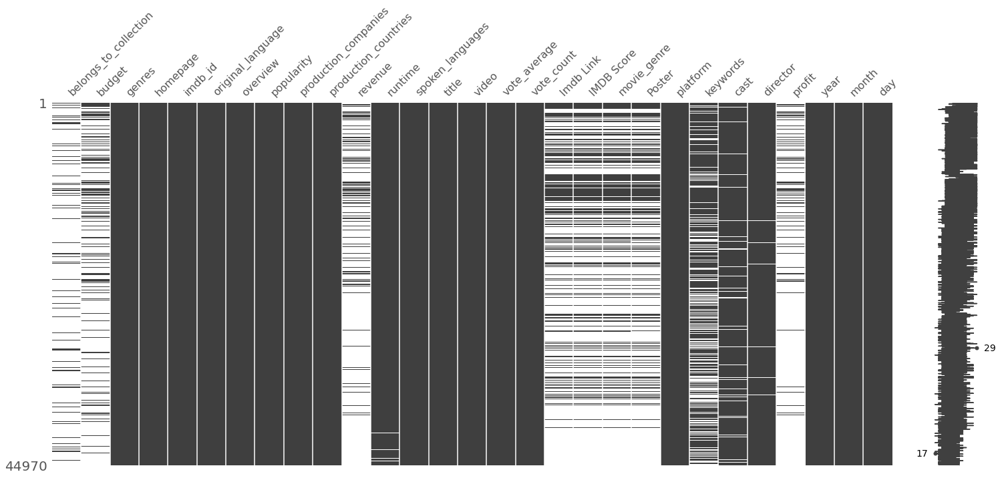

In [117]:
msno.matrix(Movies)

In [118]:
Movies.head(5)

,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,overview,popularity,production_companies,production_countries,...,movie_genre,Poster,platform,keywords,cast,director,profit,year,month,day
id,,,,,,,,,,,,,,,,,,,,,
862,Toy Story Collection,30000000.0,"Animation, Comedy, Family",1,tt0114709,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,Pixar Animation Studios,"US, United States of America",...,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...,Disney Plus,"jealousy, toy, boy, friendship, friends, rival...","Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",John Lasseter,12.451801,1995,10,30
8844,NaN,65000000.0,"Adventure, Fantasy, Family",1,tt0113497,en,Roll the dice and unleash the excitement! When...,17.015539,"TriStar Pictures, Teitler Film, Interscope Com...","US, United States of America",...,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"board game, disappearance, based on children's...","Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",Joe Johnston,4.043035,1995,12,15
15602,Grumpy Old Men Collection,NaN,"Romance, Comedy",1,tt0113228,en,Still Yelling. Still Fighting. Still Ready for...,11.712900,"Warner Bros., Lancaster Gate","US, United States of America",...,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"fishing, best friend, duringcreditsstinger, ol...","Walter Matthau, Jack Lemmon, Ann-Margret, Soph...",Howard Deutch,NaN,1995,12,22
31357,NaN,16000000.0,"Comedy, Drama, Romance",1,tt0114885,en,Friends are the people who let you be yourself...,3.859495,Twentieth Century Fox Film Corporation,"US, United States of America",...,Comedy|Drama|Romance,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"based on novel, interracial relationship, sing...","Whitney Houston, Angela Bassett, Loretta Devin...",Forest Whitaker,5.090760,1995,12,22
11862,Father of the Bride Collection,NaN,Comedy,1,tt0113041,en,Just When His World Is Back To Normal... He's ...,8.387519,"Sandollar Productions, Touchstone Pictures","US, United States of America",...,Comedy|Family|Romance,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"baby, midlife crisis, confidence, aging, daugh...","Steve Martin, Diane Keaton, Martin Short, Kimb...",Charles Shyer,NaN,1995,2,10


**From "IMDB_dataset" folder:**

In [119]:
Movies_full = Movies.merge(link_rating, on='imdb_id', how = 'right')

len(Movies_full)

26124293

In [120]:
akas_df = pd.read_csv(imdb_path +"title.akas.tsv", sep="\t", na_values=["\\N"], low_memory=False)
akas_df = akas_df[akas_df['isOriginalTitle'] == 1.0]
akas_df = akas_df[["titleId","ordering","title"]]
akas_df.head(5)

,titleId,ordering,title
4,tt0000001,5,Carmencita
5,tt0000002,1,Le clown et ses chiens
14,tt0000003,4,Pauvre Pierrot
17,tt0000004,1,Un bon bock
30,tt0000005,8,Blacksmith Scene


In [121]:
basics_df = pd.read_csv(imdb_path +"title.basics.tsv", sep="\t", na_values=["\\N"], low_memory=False)
print(basics_df["originalTitle"].isnull().sum())
basics_df.head(5)

185


,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,1894.0,NaN,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892.0,NaN,5,"Animation,Short"
2,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0,1892.0,NaN,4,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,1892.0,NaN,NaN,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893.0,NaN,1,"Comedy,Short"


In [122]:
#Since there are null values in the "originalTitle", I will gather the film names from "primaryTitle"
basics_df.originalTitle.fillna(basics_df.primaryTitle, inplace=True)
print(basics_df.info(),"\n")
print(basics_df["originalTitle"].isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6321302 entries, 0 to 6321301
Data columns (total 9 columns):
 #   Column          Dtype  
---  ------          -----  
 0   tconst          object 
 1   titleType       object 
 2   primaryTitle    object 
 3   originalTitle   object 
 4   isAdult         int64  
 5   startYear       float64
 6   endYear         float64
 7   runtimeMinutes  object 
 8   genres          object 
dtypes: float64(2), int64(1), object(6)
memory usage: 434.0+ MB
None 

10


In [123]:
basics_df[basics_df["originalTitle"].isnull()]

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
1421127,tt10790040,tvEpisode,NaN,NaN,0,2019.0,NaN,NaN,NaN
1450215,tt10840292,tvEpisode,NaN,NaN,0,NaN,NaN,NaN,NaN
1479986,tt10891902,tvEpisode,NaN,NaN,0,2020.0,NaN,NaN,NaN
2522427,tt1971246,tvEpisode,NaN,NaN,0,2011.0,NaN,NaN,Biography
2615019,tt2067043,tvEpisode,NaN,NaN,0,1965.0,NaN,NaN,Music
3781552,tt4404732,tvEpisode,NaN,NaN,0,2015.0,NaN,NaN,Comedy
4391034,tt5773048,tvEpisode,NaN,NaN,0,2015.0,NaN,NaN,Talk-Show
5638489,tt8473688,tvEpisode,NaN,NaN,0,NaN,NaN,NaN,Drama
5670258,tt8541336,tvEpisode,NaN,NaN,0,2018.0,NaN,NaN,"Reality-TV,Romance"
6277173,tt9824302,tvEpisode,NaN,NaN,0,2016.0,NaN,NaN,Documentary


There are still 10 "NaN"/unknown titles in the dataset, but the information dropped from 185 to 10, so it is a progress. Since, I can't find the name of these (because they are not added, there isn't any name,cast etc. informations even while searching manually on the Internet),so I will drop these rows from the dataset to have a clear and unbiased dataset.

In [124]:
basics_df = basics_df.dropna(subset=["originalTitle"])
print(basics_df.info(),"\n")
basics_df = basics_df[["tconst", "titleType","startYear", "runtimeMinutes"]]
basics_df = basics_df.rename(columns={"tconst": "titleId"})
basics_df.head(5)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6321292 entries, 0 to 6321301
Data columns (total 9 columns):
 #   Column          Dtype  
---  ------          -----  
 0   tconst          object 
 1   titleType       object 
 2   primaryTitle    object 
 3   originalTitle   object 
 4   isAdult         int64  
 5   startYear       float64
 6   endYear         float64
 7   runtimeMinutes  object 
 8   genres          object 
dtypes: float64(2), int64(1), object(6)
memory usage: 482.3+ MB
None 



,titleId,titleType,startYear,runtimeMinutes
0,tt0000001,short,1894.0,1
1,tt0000002,short,1892.0,5
2,tt0000003,short,1892.0,4
3,tt0000004,short,1892.0,NaN
4,tt0000005,short,1893.0,1


In [125]:
ratings_df = pd.read_csv(imdb_path +"title.ratings.tsv", sep="\t", na_values=["\\N"], low_memory=False)
ratings_df = ratings_df.rename(columns={'tconst': 'titleId'})
ratings_df.head(5)

,titleId,averageRating,numVotes
0,tt0000001,5.6,1550
1,tt0000002,6.1,186
2,tt0000003,6.5,1207
3,tt0000004,6.2,113
4,tt0000005,6.1,1934


In [126]:
akas_ratings_df = akas_df.merge(ratings_df, on="titleId",how = "inner")
print(akas_ratings_df.shape)
imdb_all_df = akas_ratings_df.merge(basics_df, on="titleId",how = "inner")
print(imdb_all_df.shape)
imdb_all_df = imdb_all_df.rename(columns={"startYear": "year","averageRating":"vote_average","numVotes":"vote_count"})
imdb_all_df.head(5)

(252726, 5)
(252726, 8)


,titleId,ordering,title,vote_average,vote_count,titleType,year,runtimeMinutes
0,tt0000001,5,Carmencita,5.6,1550,short,1894.0,1
1,tt0000002,1,Le clown et ses chiens,6.1,186,short,1892.0,5
2,tt0000003,4,Pauvre Pierrot,6.5,1207,short,1892.0,4
3,tt0000004,1,Un bon bock,6.2,113,short,1892.0,NaN
4,tt0000005,8,Blacksmith Scene,6.1,1934,short,1893.0,1


In [127]:
imdb_all_df["titleType"].value_counts()

movie           146513
short            29195
tvSeries         24316
tvMovie          19571
video            12781
tvEpisode         6769
tvMiniSeries      4445
videoGame         4399
tvSpecial         3091
tvShort           1646
Name: titleType, dtype: int64

In [128]:
imdb_all_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 252726 entries, 0 to 252725
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   titleId         252726 non-null  object 
 1   ordering        252726 non-null  int64  
 2   title           252726 non-null  object 
 3   vote_average    252726 non-null  float64
 4   vote_count      252726 non-null  int64  
 5   titleType       252726 non-null  object 
 6   year            252710 non-null  float64
 7   runtimeMinutes  222372 non-null  object 
dtypes: float64(2), int64(2), object(4)
memory usage: 17.4+ MB


## Exploratory Data Analysis (EDA)

### Wordcloud - Repetition of Words

#### Title and Overview Analysis

Word clouds are visual representations of large collections of words. They can be used to see trends and relationships in a data set, or to get a snapshot of a particular topic. Typically, text size and color are used in Word Cloud to display word frequency. The design is attention-grabbing at first sight.

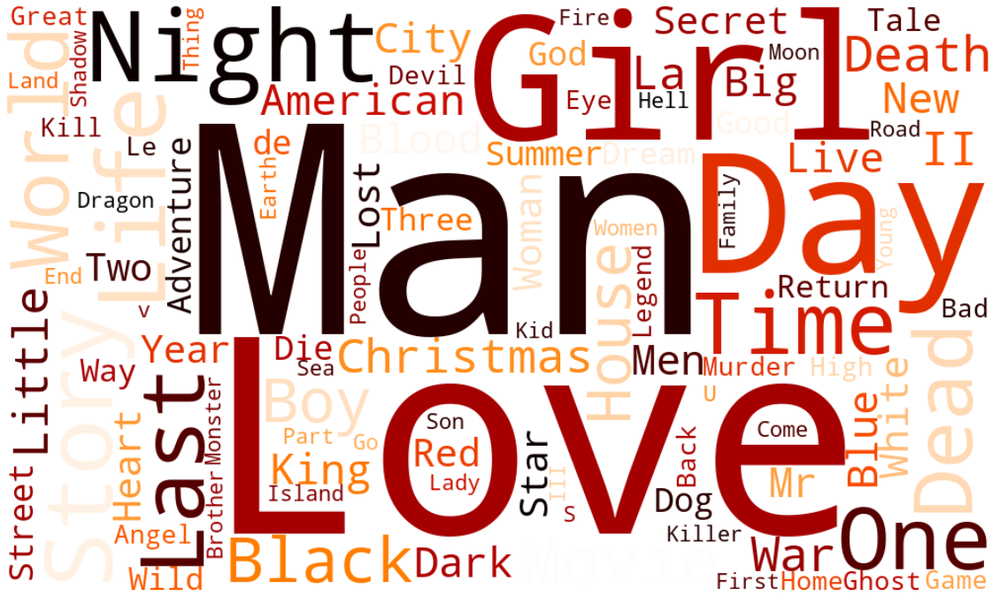

In [129]:
#Workcloud based on Title
title_wordcloud = WordCloud(width=1000, height=600, max_words=100,
               random_state=1,background_color = 'white',
               stopwords = STOPWORDS,
               contour_width = 1,
               collocations=False,
               contour_color = 'black', 
               colormap='gist_heat').generate(' '.join(Movies['title']))
plt.figure(figsize=(20,16))
plt.imshow(title_wordcloud,interpolation="bilinear")
plt.axis('off')
plt.show()

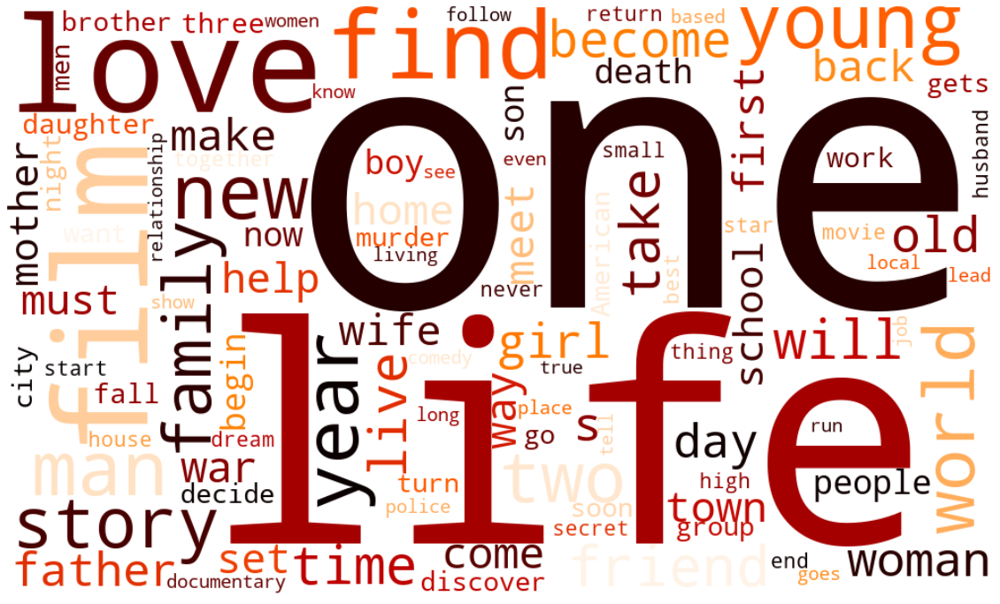

In [130]:
#Workcloud based on Overview
overview_wordcloud = WordCloud(width=1000, height=600, max_words=100,
               random_state=1,background_color = 'white',
               stopwords = STOPWORDS,
               contour_width = 1,
               collocations=False,
               contour_color = 'black', 
               colormap='gist_heat').generate(' '.join(Movies['overview']))
plt.figure(figsize=(20,16))
plt.imshow(overview_wordcloud,interpolation="bilinear")
plt.axis('off')
plt.show()

Even though using WordCloud can give a more interesting visual, there are some cons too. For better visualization, I will use Grouping bubbles with a Circle packing.

In [134]:
def turn_elim_dict(x):
    stop_words = set(stopwords.words("english") + ["&","|","-"," "])
    text_temp = ' '.join(x)
    text = text_temp.split(" ")
    set_words_full = list(set(text))
    set_words = [i for i in set_words_full if i.lower() not in stop_words]
    count_words = [text.count(i) for i in set_words]
    df_bubble = pd.DataFrame(zip(set_words, count_words), columns=['words','count'])
    df_bubble.sort_values('count', ascending=False, inplace=True)
    df_bubble.reset_index(drop=True, inplace=True)
    return df_bubble
#text_dictionary = {x:text.count(x) for x in text}

In [135]:
def get_colordict(palette,number,start):
    pal = list(sns.color_palette(palette=palette, n_colors=number).as_hex())
    color_d = dict(enumerate(pal, start=start))
    return color_d

In [136]:
df_bubble_title = turn_elim_dict(Movies["title"])
df_bubble_title.head()

,words,count
0,Man,636
1,Love,624
2,Story,386
3,Night,380
4,Life,369


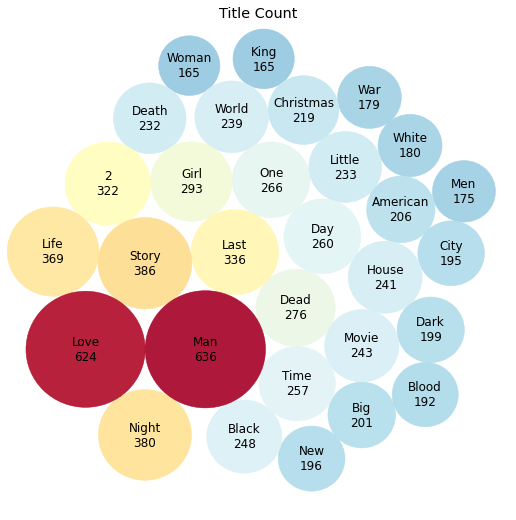

In [137]:
circles = circlify.circlify(df_bubble_title['count'][0:30].tolist(), 
                            show_enclosure=False, 
                            target_enclosure=circlify.Circle(x=0, y=0)
                           )
n = df_bubble_title['count'][0:30].max()
color_dict = get_colordict('RdYlBu_r',n ,1)
fig, ax = plt.subplots(figsize=(9,9), facecolor='white')
ax.axis('off')
lim = max(max(abs(circle.x)+circle.r, abs(circle.y)+circle.r,) for circle in circles)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# list of labels
labels = list(df_bubble_title['words'][0:30])
counts = list(df_bubble_title['count'][0:30])
labels.reverse()
counts.reverse()

# print circles
for circle, label, count in zip(circles, labels, counts):
    x, y, r = circle
    ax.add_patch(plt.Circle((x, y), r, alpha=0.9, color = color_dict.get(count)))
    plt.annotate(label +'\n'+ str(count), (x,y), size=12, va='center', ha='center')
plt.title("Title Count")
plt.xticks([])
plt.yticks([])
plt.show()

In [138]:
df_bubble_overview = turn_elim_dict(Movies["overview"])
df_bubble_overview.head()

,words,count
0,one,6316
1,young,5965
2,life,5285
3,film,4825
4,story,4417


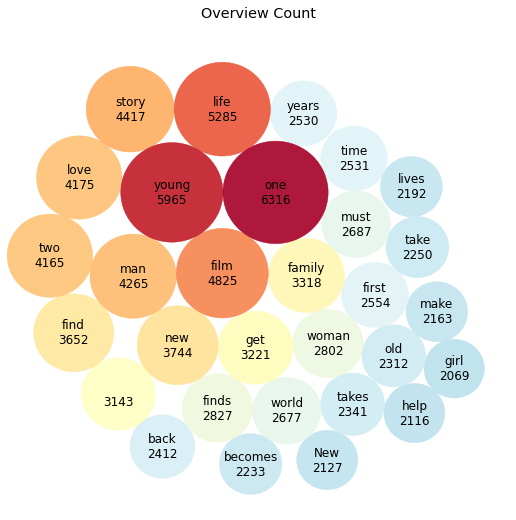

In [139]:
circles = circlify.circlify(df_bubble_overview['count'][0:30].tolist(), 
                            show_enclosure=False, 
                            target_enclosure=circlify.Circle(x=0, y=0)
                           )
n = df_bubble_overview['count'][0:30].max()
color_dict = get_colordict('RdYlBu_r',n ,1)
fig, ax = plt.subplots(figsize=(9,9), facecolor='white')
ax.axis('off')
lim = max(max(abs(circle.x)+circle.r, abs(circle.y)+circle.r,) for circle in circles)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# list of labels
labels = list(df_bubble_overview['words'][0:30])
counts = list(df_bubble_overview['count'][0:30])
labels.reverse()
counts.reverse()

# print circles
for circle, label, count in zip(circles, labels, counts):
    x, y, r = circle
    ax.add_patch(plt.Circle((x, y), r, alpha=0.9, color = color_dict.get(count)))
    plt.annotate(label +'\n'+ str(count), (x,y), size=12, va='center', ha='center')
plt.title("Overview Count")
plt.xticks([])
plt.yticks([])
plt.show()

As it seems, it gave much more clear information about title and overview repetitive values. For title column, "Love","Man" and "Story" comes in order and for overview column, "one", "young" and "life" come one after another. In general it seems that romantic movies have more importance in our dataset, but it is still so early to tell directly. To have a nearly perfect information about that I will use the "genre" column too after I create a simple recommender.

Also, even though this chart gives more information and better visualization about the titles, it takes much more time to compile and even larger datasets than mine can take more time.

#### Movies General Collection Profit Analysis

This below analysis only made by the total revenue, budget and accordingly profit based. It doesn't display the all reveues for the given company from the given collection, it only shows the most profitted movies and if it belongs to any collection. Further explanation will be also given.

In [131]:
Movies_revenue_notnull = Movies[Movies["revenue"].notnull()]
Movies_collection_revenue_not_null = Movies_revenue_notnull[Movies_revenue_notnull["belongs_to_collection"].notnull()]

In [132]:
movie_revenue_title_pivot = Movies_collection_revenue_not_null.pivot_table(index="title", values="revenue", aggfunc={"revenue": ["mean", "sum", "count"]}).reset_index()

In [133]:
movie_revenue_title_pivot.sort_values("sum", ascending=False).head(10)

,title,count,mean,sum
120,Avatar,1,2.787965e+09,2.787965e+09
1021,Star Wars: The Force Awakens,1,2.068224e+09,2.068224e+09
1087,The Avengers,1,1.519558e+09,1.519558e+09
599,Jurassic World,1,1.513529e+09,1.513529e+09
432,Furious 7,1,1.506249e+09,1.506249e+09
121,Avengers: Age of Ultron,1,1.405404e+09,1.405404e+09
485,Harry Potter and the Deathly Hallows: Part 2,1,1.342000e+09,1.342000e+09
428,Frozen,1,1.274219e+09,1.274219e+09
1148,The Fate of the Furious,1,1.238765e+09,1.238765e+09
568,Iron Man 3,1,1.215440e+09,1.215440e+09


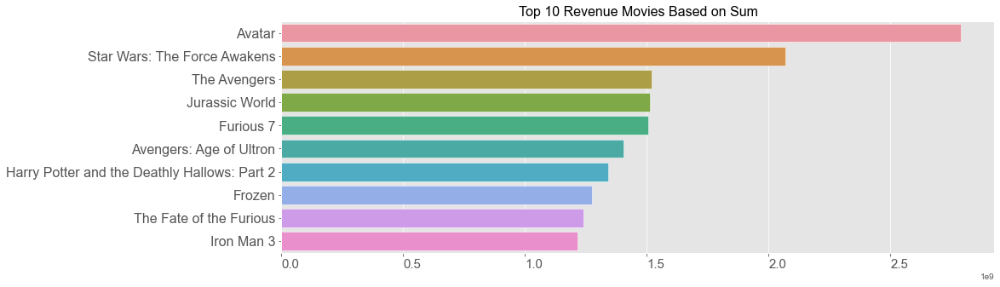

In [134]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style('dark')
sns.barplot(data=movie_revenue_title_pivot.sort_values("sum", ascending=False).head(10),
            x="sum", y=movie_revenue_title_pivot.sort_values("sum", ascending=False).head(10).title);
plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
plt.ylabel("") 
plt.xlabel("")
plt.title("Top 10 Revenue Movies Based on Sum", fontsize=16)
plt.show()

Most profits are shown above and the most profitted collection based movie is "Avatar". However, in total profit it can be different because as we all know Avatar has only 1 movie in the collection whereas Star Wars have more than that. For better understanding of the situation I will give an example. For example, if a lemonade company "A" produce each lemonade for 1 dollar and sell it for 3 dollars, the total profit of the company "A" is 2 dollars per lemonade, but if another company "B" produce it for 1 dollar and sell it 2 dollars but have more firms in different locations than the first one, it can gather more profit. This example is given to let viewers understand why I will also evaluate the collection of movies and check their profit sums too. 

In [135]:
movie_revenue_collection_pivot = Movies_collection_revenue_not_null.pivot_table(index="belongs_to_collection", values="revenue", aggfunc={"revenue": ["mean", "sum", "count"]}).reset_index()

In [136]:
movie_revenue_collection_pivot.sort_values("sum", ascending=False).head(10)

,belongs_to_collection,count,mean,sum
260,Harry Potter Collection,8,9.634209e+08,7.707367e+09
504,Star Wars Collection,8,9.293118e+08,7.434495e+09
303,James Bond Collection,26,2.733450e+08,7.106970e+09
574,The Fast and the Furious Collection,8,6.406373e+08,5.125099e+09
412,Pirates of the Caribbean Collection,5,9.043154e+08,4.521577e+09
691,Transformers Collection,5,8.732202e+08,4.366101e+09
166,Despicable Me Collection,4,9.227676e+08,3.691070e+09
666,The Twilight Collection,5,6.684215e+08,3.342107e+09
291,Ice Age Collection,5,6.433417e+08,3.216709e+09
313,Jurassic Park Collection,4,7.578710e+08,3.031484e+09


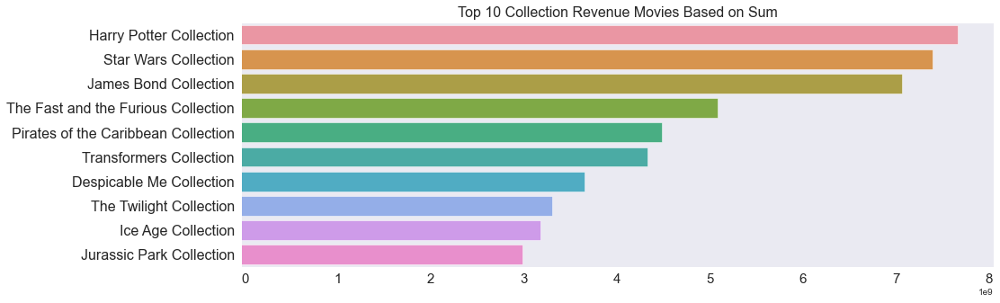

In [137]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style('dark')
sns.barplot(data=movie_revenue_collection_pivot.sort_values("sum", ascending=False).head(10),
            x="sum", y=movie_revenue_collection_pivot.sort_values("sum", ascending=False).head(10).belongs_to_collection);
plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
plt.ylabel("") 
plt.xlabel("")
plt.title("Top 10 Collection Revenue Movies Based on Sum", fontsize=16)
plt.show()

In [138]:
movie_revenue_collection_pivot.sort_values("mean", ascending=False).head(10)

,belongs_to_collection,count,mean,sum
61,Avatar Collection,1,2.787965e+09,2.787965e+09
545,The Avengers Collection,2,1.462481e+09,2.924962e+09
232,Frozen Collection,1,1.274219e+09,1.274219e+09
219,Finding Nemo Collection,2,9.844532e+08,1.968906e+09
590,The Hobbit Collection,3,9.785078e+08,2.935523e+09
614,The Lord of the Rings Collection,3,9.721816e+08,2.916545e+09
260,Harry Potter Collection,8,9.634209e+08,7.707367e+09
504,Star Wars Collection,8,9.293118e+08,7.434495e+09
166,Despicable Me Collection,4,9.227676e+08,3.691070e+09
412,Pirates of the Caribbean Collection,5,9.043154e+08,4.521577e+09


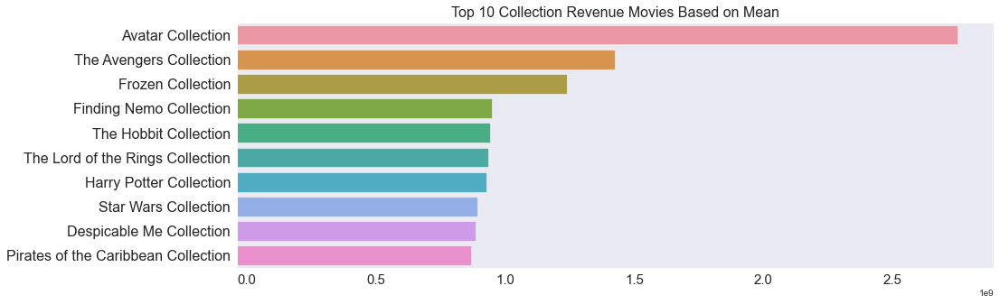

In [139]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style('dark')
sns.barplot(data=movie_revenue_collection_pivot.sort_values("mean", ascending=False).head(10),
            x="mean", y=movie_revenue_collection_pivot.sort_values("mean", ascending=False).head(10).belongs_to_collection);
plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
plt.ylabel("") 
plt.xlabel("")
plt.title("Top 10 Collection Revenue Movies Based on Mean", fontsize=16)
plt.show()

As it explanined before, even though Avatar had the most gross in collection movies, in the total collection  movies Avatar doesn't even shown in here. "Avatar" gained 2,787,965,000 total revenue where "Harry Potter and the Deathly Hallows: Part 2" gained 1,342,000,000. However, Harry Potter collection gained 7,707,367,000 total revenue with all the films included which is 3 times higher than "Avatar. Also, people can say that if a movie gained this much, why they didn't continue with that film collection and continued less profitable films. The answer can be shown as:

**production companies perspective:**

In [140]:
s = Movies.apply(lambda x: pd.Series(x['production_companies']),axis=1).stack().reset_index(level=1, drop=True)
s.name = 'companies'

In [141]:
com_df = Movies.drop('production_companies', axis=1).join(s)

In [142]:
com_sum = pd.DataFrame(com_df.groupby('companies')['revenue'].sum().sort_values(ascending=False))
com_sum.columns = ['Total']
com_mean = pd.DataFrame(com_df.groupby('companies')['revenue'].mean().sort_values(ascending=False))
com_mean.columns = ['Average']
com_count = pd.DataFrame(com_df.groupby('companies')['revenue'].count().sort_values(ascending=False))
com_count.columns = ['Number']

com_pivot = pd.concat((com_sum, com_mean, com_count), axis=1)

In [143]:
com_pivot.sort_values('Total', ascending=False).head(10)

,Total,Average,Number
companies,,,
Paramount Pictures,7.440475e+09,6.049167e+07,123
"Walt Disney Pictures, Pixar Animation Studios",7.092295e+09,5.910246e+08,12
DreamWorks Animation,5.678788e+09,4.732323e+08,12
"Walt Disney Pictures, Walt Disney Animation Studios",4.855566e+09,5.395073e+08,9
"Blue Sky Studios, Twentieth Century Fox Animation",4.593632e+09,5.104036e+08,9
Marvel Studios,4.187450e+09,4.187450e+08,10
"Warner Bros., Heyday Films",4.168478e+09,1.042119e+09,4
Universal Pictures,3.840043e+09,4.363686e+07,88
Columbia Pictures,3.540419e+09,6.680036e+07,53


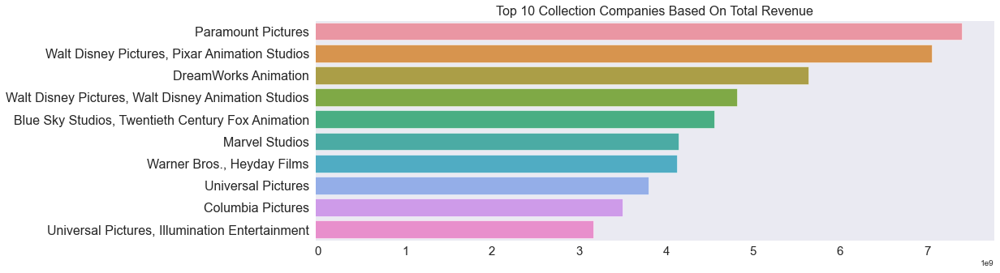

In [144]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style('dark')
sns.barplot(data=com_pivot.sort_values('Total', ascending=False).head(10),
            x="Total", y=com_pivot.sort_values('Total', ascending=False).head(10).index);
plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
plt.ylabel("") 
plt.xlabel("")
plt.title("Top 10 Collection Companies Based On Total Revenue", fontsize=16)
plt.show()

**platform perspective:**

In [145]:
s_p = Movies.apply(lambda x: pd.Series(x['platform']),axis=1).stack().reset_index(level=1, drop=True)
s_p.name = 'platform'

In [146]:
plat_df = Movies.drop('platform', axis=1).join(s_p)

In [147]:
plat_sum = pd.DataFrame(com_df.groupby('platform')['revenue'].sum().sort_values(ascending=False))
plat_sum.columns = ['Total']
plat_mean = pd.DataFrame(com_df.groupby('platform')['revenue'].mean().sort_values(ascending=False))
plat_mean.columns = ['Average']
plat_count = pd.DataFrame(com_df.groupby('platform')['revenue'].count().sort_values(ascending=False))
plat_count.columns = ['Number']

plat_pivot = pd.concat((plat_sum, plat_mean, plat_count), axis=1)

In [148]:
plat_pivot.loc['Netflix'] = plat_pivot.loc['Netflix'].add(plat_pivot.loc["Netflix, Hulu"])
plat_pivot.loc['Netflix'] = plat_pivot.loc['Netflix'].add(plat_pivot.loc["Netflix, Amazon Prime"])
plat_pivot.loc['Netflix'] = plat_pivot.loc['Netflix'].add(plat_pivot.loc["Netflix, Disney Plus"])

plat_pivot.loc['Disney Plus'] = plat_pivot.loc['Disney Plus'].add(plat_pivot.loc["Amazon Prime, Disney Plus"])
plat_pivot.loc['Disney Plus'] = plat_pivot.loc['Disney Plus'].add(plat_pivot.loc["Netflix, Disney Plus"])

plat_pivot.loc['Hulu'] = plat_pivot.loc['Hulu'].add(plat_pivot.loc["Netflix, Hulu"])
plat_pivot.loc['Hulu'] = plat_pivot.loc['Hulu'].add(plat_pivot.loc["Hulu, Amazon Prime"])

plat_pivot.loc['Amazon Prime'] = plat_pivot.loc['Amazon Prime'].add(plat_pivot.loc["Netflix, Amazon Prime"])
plat_pivot.loc['Amazon Prime'] = plat_pivot.loc['Amazon Prime'].add(plat_pivot.loc["Hulu, Amazon Prime"])
plat_pivot.loc['Amazon Prime'] = plat_pivot.loc['Amazon Prime'].add(plat_pivot.loc["Amazon Prime, Disney Plus"])

In [149]:
plat_pivot = plat_pivot["Netflix":"Amazon Prime"]
plat_pivot.sort_values('Total', ascending=False).head(10)
plat_pivot

,Total,Average,Number
platform,,,
Netflix,9.442815e+10,5.736076e+08,983
Disney Plus,5.756306e+10,5.123912e+08,249
Hulu,3.111576e+10,2.919067e+08,302
Amazon Prime,2.476869e+10,2.324944e+08,531


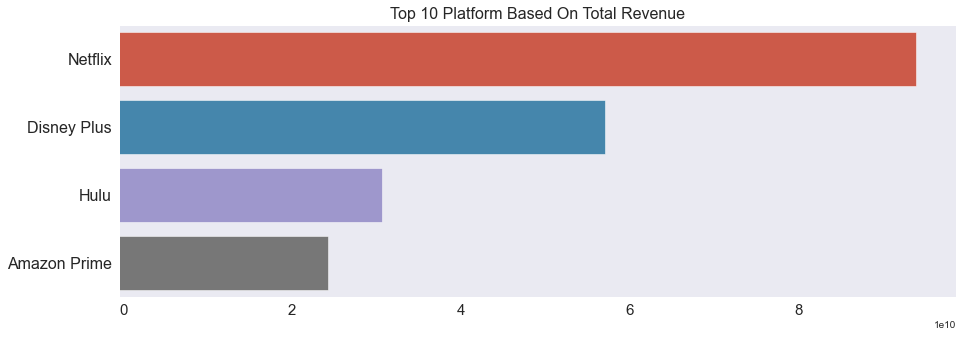

In [150]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style('dark')
sns.barplot(data=plat_pivot.sort_values('Total', ascending=False).head(10),
            x="Total", y=plat_pivot.sort_values('Total', ascending=False).head(10).index);
plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
plt.ylabel("") 
plt.xlabel("")
plt.title("Top 10 Platform Based On Total Revenue", fontsize=16)
plt.show()

The total revenue gathered from these movies only, Netflix has the most revenue gathered films inside the platform.

**ratings difference:**

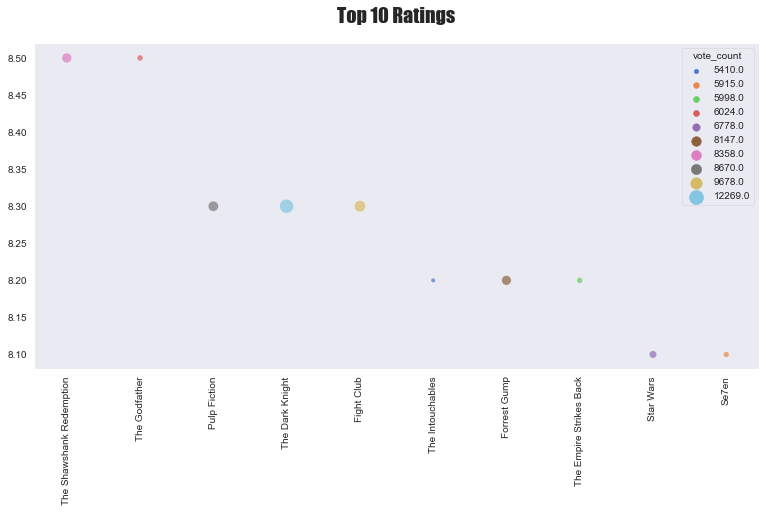

In [151]:
#Top 10 Ratings
ratings_top10 = Movies.loc[(Movies.vote_count)>5000, ['title', 'vote_average','vote_count']].sort_values('vote_average', ascending=False).head(10)

plt.figure(figsize=(13,6))
sns.scatterplot(data=ratings_top10, x = "title", y = "vote_average", hue = "vote_count", 
                size = "vote_count", sizes=(20, 200), legend="full",
                alpha=.7, palette='muted')

sns.set(font_scale = 1.3)
plt.xticks(rotation = 90)
plt.ylabel('', fontsize=20, fontfamily='fantasy');
plt.title('Top 10 Ratings', fontsize=20 , pad=20, fontfamily='fantasy')
plt.xlabel('')
plt.show()

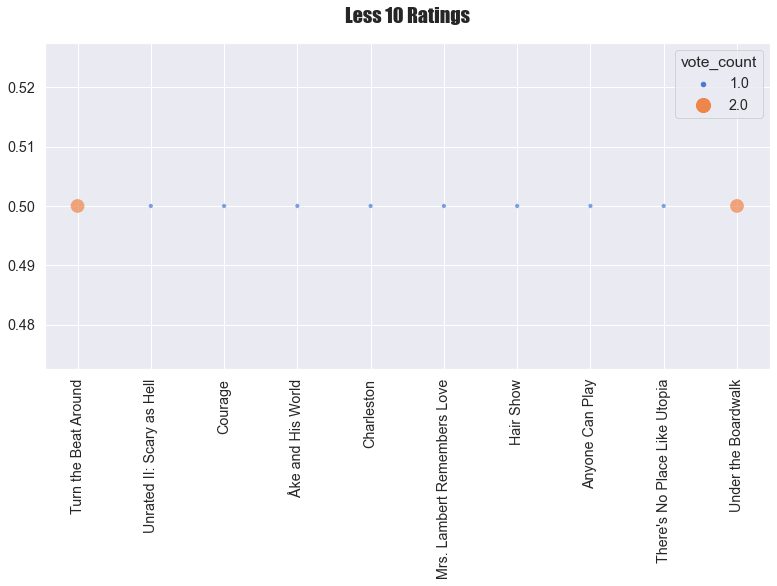

In [152]:
#Less 10 Ratings
ratings_top10 = Movies.loc[(Movies["vote_count"] != np.nan) & (Movies["vote_count"] != 0) & (Movies["vote_average"] != 0), ['title', 'vote_average','vote_count']].sort_values('vote_average', ascending=False).tail(10)

plt.figure(figsize=(13,6))
sns.scatterplot(data=ratings_top10, x = "title", y = "vote_average", hue = "vote_count", 
                size = "vote_count", sizes=(20, 200), legend="full",
                alpha=.7, palette='muted')

sns.set(font_scale = 1.3)
plt.xticks(rotation = 90)
plt.ylabel('', fontsize=20, fontfamily='fantasy');
plt.title('Less 10 Ratings', fontsize=20 , pad=20, fontfamily='fantasy')
plt.xlabel('')
plt.show()

**production company difference:**

In [153]:
avatar_movie = Movies_collection_revenue_not_null[Movies_collection_revenue_not_null["title"] == "Avatar"]
avatar_movie["production_companies"].sum()

'Ingenious Film Partners, Twentieth Century Fox Film Corporation, Dune Entertainment, Lightstorm Entertainment'

In [154]:
harry_potter_movie = Movies_collection_revenue_not_null[Movies_collection_revenue_not_null["title"] == "Harry Potter and the Deathly Hallows: Part 2"]
harry_potter_movie["production_companies"].sum()

'Warner Bros., Heyday Films'

In [155]:
star_wars_movie = Movies_collection_revenue_not_null[Movies_collection_revenue_not_null["title"] == "Star Wars: The Force Awakens"]
star_wars_movie["production_companies"].sum()

'Lucasfilm, Truenorth Productions, Bad Robot'

For this example, we can say that the Avatar would be a better pick to continue the serie, but in this dataset and among other datasets as well, there is no clear money transitions between production companies, their external profits(Figure collections, Collector Bundles even McDonald's kids menus aren't included).So, we can only say that this is the profit which is gained but we can't say why they didn't continue Avatar while continuing other films.

In [156]:
movie_revenue_collection_pivot.sort_values("count", ascending=False).head(10)

,belongs_to_collection,count,mean,sum
303,James Bond Collection,26,2.733450e+08,7.106970e+09
228,Friday the 13th Collection,12,3.874155e+07,4.648985e+08
418,Pokémon Collection,9,6.687400e+07,6.018660e+08
19,A Nightmare on Elm Street Collection,8,4.544894e+07,3.635916e+08
504,Star Wars Collection,8,9.293118e+08,7.434495e+09
260,Harry Potter Collection,8,9.634209e+08,7.707367e+09
254,Halloween Collection,8,3.089601e+07,2.471681e+08
635,The Pink Panther (Original) Collection,8,2.055978e+07,1.644782e+08
574,The Fast and the Furious Collection,8,6.406373e+08,5.125099e+09
419,Police Academy Collection,7,4.352046e+07,3.046432e+08


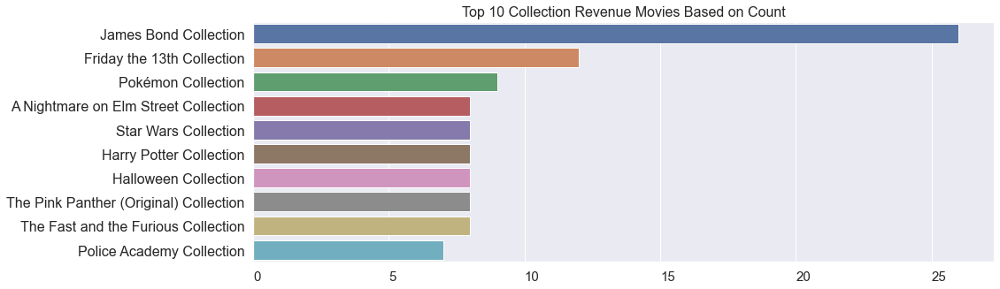

In [157]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style('dark')
sns.barplot(data=movie_revenue_collection_pivot.sort_values("count", ascending=False).head(10),
            x="count", y=movie_revenue_collection_pivot.sort_values("count", ascending=False).head(10).belongs_to_collection);
plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
plt.ylabel("") 
plt.xlabel("")
plt.title("Top 10 Collection Revenue Movies Based on Count", fontsize=16)
plt.show()

This can also give a proper definition to the problem. Between films, the Pokemon collection wasn't even shown among others but we know that their total revenue is 118.5 billion dollars whereas Harry Potter is 7.7 billion dollars. This is the difference between continuing a serie and the total profit.

**Top 10 Last Revenue Movies:**

In [158]:
m_profit = Movies_revenue_notnull[Movies_revenue_notnull["profit"].notnull()]

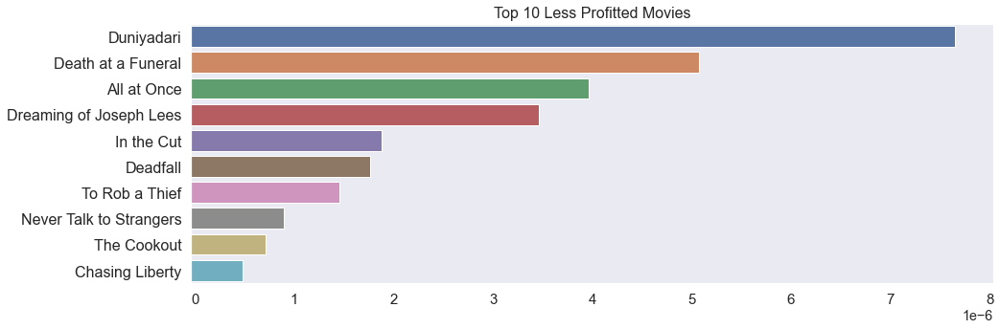

In [159]:
fig, ax = plt.subplots(figsize=(15,5))
sns.set_style('dark')
sns.barplot(data=m_profit.sort_values("profit", ascending=False).tail(10),
            x="profit", y=m_profit.sort_values("profit", ascending=False).tail(10).title);
plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
plt.ylabel("") 
plt.xlabel("")
plt.title("Top 10 Less Profitted Movies", fontsize=16)
plt.show()

The less profitable movie in this dataset is Chasing Liberty, followed by The Cookout.

**language column:**

In [160]:
Movies['original_language'].drop_duplicates().shape[0]

90

In [161]:
language_dataframe = pd.DataFrame(Movies['original_language'].value_counts())
language_dataframe['language'] = language_dataframe.index
language_dataframe.columns = ['number', 'language']
language_dataframe = language_dataframe.head(20)

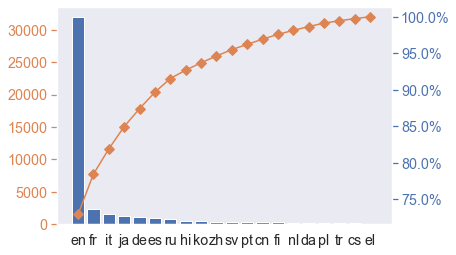

In [162]:
language_dataframe = language_dataframe.sort_values(by='number',ascending=False)
language_dataframe["cumpercentage"] = language_dataframe["number"].cumsum()/language_dataframe["number"].sum()*100


fig, ax = plt.subplots()
ax.bar(language_dataframe.index, language_dataframe["number"], color="C0")
ax2 = ax.twinx()
ax2.plot(language_dataframe.index, language_dataframe["cumpercentage"], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C1")
ax2.tick_params(axis="y", colors="C0")
plt.show()

As it can be seen from the graph, english usage on films is far more beyond than any other. For further Analysis, I will drop the english language and visualize again.

In [163]:
language_dataframe = language_dataframe.iloc[1: , :]

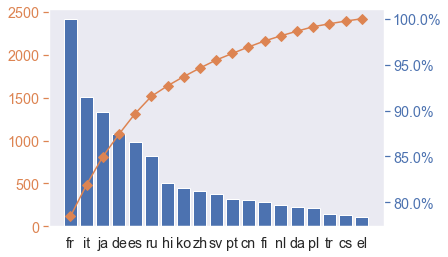

In [164]:
fig, ax = plt.subplots()
ax.bar(language_dataframe.index, language_dataframe["number"], color="C0")
ax2 = ax.twinx()
ax2.plot(language_dataframe.index, language_dataframe["cumpercentage"], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C1")
ax2.tick_params(axis="y", colors="C0")
plt.show()

**genres and director columns:**

In [165]:
cond1 = Movies[(Movies["genres"] != "") & (Movies["genres"] != np.nan)]
cond2 = cond1[(cond1["director"] != "") & (cond1["director"] != np.nan)]
print(cond2.columns)
dir_genres = cond2[['title', 'director','genres']]
director_genre = dir_genres.join(dir_genres.genres.str.get_dummies(sep=', '))

Index(['belongs_to_collection', 'budget', 'genres', 'homepage', 'imdb_id',
       'original_language', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'title', 'video', 'vote_average', 'vote_count', 'Imdb Link',
       'IMDB Score', 'movie_genre', 'Poster', 'platform', 'keywords', 'cast',
       'director', 'profit', 'year', 'month', 'day'],
      dtype='object')


In [166]:
director_unique_list = []
for i in range(len(director_genre)):
    if director_genre["director"][i] in director_unique_list:
        continue
    else:
        director_unique_list.append(director_genre["director"][i])

In [167]:
director_genre_totals = director_genre.groupby('director').sum()

In [168]:
director_genre_totals['total']= director_genre_totals.iloc[:, :-1].sum(axis=1)
director_genre_totals_sorted = director_genre_totals.sort_values('total',ascending = False).head(20)

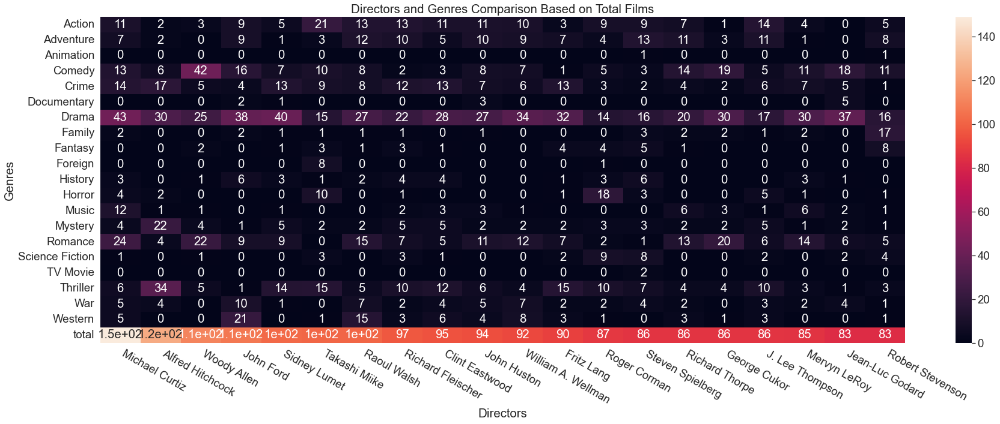

In [169]:
plt.figure(figsize=(30,10))
sns.set(font_scale=1.7)
sns.heatmap(director_genre_totals_sorted.T, annot=True)

plt.title('Directors and Genres Comparison Based on Total Films')
plt.xlabel('Directors')
plt.ylabel('Genres')
plt.xticks(rotation=-30, ha='left');

**genres and year columns:**

In [170]:
cond3 = cond2[(cond2["year"] != np.nan) & (cond2["year"] != "")][['year', 'director','genres']]
genre_year_d  = cond3.reset_index(drop=True).set_index("year").sort_index().genres.str.get_dummies(sep=', ')
cond4 = genre_year_d.groupby(by='year').sum()
cond4_cols = cond4.columns.tolist()
cond4["year"] = cond4.index
cond4 = cond4.reset_index(drop=True)
cond4.loc[:, cond4_cols] = cond4.loc[:, cond4_cols].cumsum()
cond4.index = cond4["year"]
cond4 = cond4.drop("year", axis=1)
cond4 = cond4.iloc[1: , :]
cond4

,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,Foreign,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
year,,,,,,,,,,,,,,,,,,,,
1874,1,1,1,1,2,12,6,2,0,1,0,1,0,2,1,3,0,1,0,0
1878,1,1,1,1,2,13,6,2,0,1,0,1,0,2,1,3,0,1,0,0
1883,1,1,1,1,2,14,6,2,0,1,0,1,0,2,1,3,0,1,0,0
1887,1,1,1,1,2,15,6,2,0,1,0,1,0,2,1,3,0,1,0,0
1888,1,1,1,1,2,17,6,2,0,1,0,1,0,2,1,3,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013,5796,3083,1659,11386,3860,3019,17683,2424,2039,1582,1205,3982,1407,2165,6016,2612,584,6450,1187,997
2014,6030,3206,1731,11923,4002,3331,18464,2533,2112,1585,1264,4187,1465,2249,6237,2736,626,6798,1227,1011
2015,6254,3326,1811,12435,4130,3620,19215,2640,2200,1585,1327,4420,1528,2357,6430,2873,692,7162,1268,1024


In [171]:
bcr.bar_chart_race(cond4, period_fmt="{x:.0f}", fixed_order=False, n_bars=5,
                   interpolate_period=False, period_length=2000,
                  steps_per_period=20,title='Top 5 Popular Genres Yearly') 

RangeIndex(start=0, stop=1, step=1)


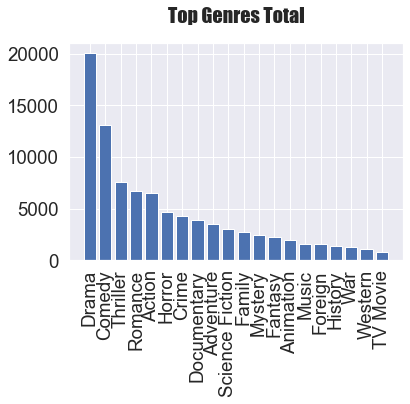

In [172]:
cond5 = cond4[cond4.index == 2017].reset_index()
cond5 = cond5.drop("year", axis=1)
cond5_transposed = cond5.T #groupby(['labels']).max()
print(cond5_transposed.columns)
cond6 = cond5_transposed[0].to_dict()
sorted_d = dict(sorted(cond6.items(), key=operator.itemgetter(1),reverse=True))

plt.bar(range(len(sorted_d)), list(sorted_d.values()), align='center')
plt.xticks(range(len(sorted_d)), list(sorted_d.keys()),rotation = 90)
plt.ylabel('', fontsize=20, fontfamily='fantasy');
plt.title('Top Genres Total', fontsize=20 , pad=20, fontfamily='fantasy')
plt.xlabel('')
plt.show()

### Sentiment Analysis

I gathered the data and with this method and it can overrite it as many times as I want if I just change the "imdb_id" for the wanted film.

In [173]:
Movies.columns

Index(['belongs_to_collection', 'budget', 'genres', 'homepage', 'imdb_id',
       'original_language', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'title', 'video', 'vote_average', 'vote_count', 'Imdb Link',
       'IMDB Score', 'movie_genre', 'Poster', 'platform', 'keywords', 'cast',
       'director', 'profit', 'year', 'month', 'day'],
      dtype='object')

In [174]:
#This is the function to gather imdb_id for selected movie
def select_imdb_id():

    sentiment_film_data = Movies[["title","imdb_id","year","director"]]

    count_title = Movies.title.value_counts().to_dict()
    count_director = Movies.director.value_counts().to_dict()
    count_year = Movies.year.value_counts().to_dict()

    a = str(input("Please enter the film you want to make sentiment analysis on: "))
    if a in sentiment_film_data["title"].values:
        if count_title[a] == 1:
            x = sentiment_film_data[sentiment_film_data["title"] == a]
            x_imdb_id = str(x["imdb_id"][0])
            return(x_imdb_id)
        elif count_title[a] != 1:
            print("There are more than one movie with the same title.")
            b = str(input("Please enter the director name: "))
            c = int(input("Please enter the year: "))
            x = sentiment_film_data[(sentiment_film_data["title"] == a) & (sentiment_film_data["director"] == b) & (sentiment_film_data["year"] == c)]
            x_imdb_id = str(x["imdb_id"][0])
            return(x_imdb_id)
    else:
        return("There isn't any movie based on your selections.")

In [175]:
def sentiment_dataset(x):
    
    url = "https://m.imdb.com/title/"+ x +"/reviews"
    driver = webdriver.Chrome(ChromeDriverManager().install())
    driver.get(url)
    button = driver.find_element(By.CLASS_NAME,"ipl-load-more")

    while True:
        try:
            list_of_spoilers = driver.find_elements(By.XPATH,"//div[@class='ipl-expander spoiler-warning']")
            for i in list_of_spoilers:
                i.click()
            button.click()
            button = driver.find_element(By.CLASS_NAME,"ipl-load-more")
        except ElementNotInteractableException:
            break

    print("All reviews loaded from the provided URL")
    
    df = pd.DataFrame(columns=["rating","title","text","sentiment"])
    list_of_reviews = driver.find_elements(By.CLASS_NAME,"ipl-content-list__item")

    for review in list_of_reviews:
        try:
            ratingele = review.find_element(By.CLASS_NAME,"rating-other-user-rating")
            rating = int(ratingele.find_element(By.TAG_NAME,"span").text)
        except NoSuchElementException:
            continue
  
        if 8>rating>4:
            continue
  
        title = review.find_element(By.CLASS_NAME,"title").text
        text = review.find_element(By.CLASS_NAME,"text").text

        if len(text.split())>100:
            continue
        
        df = df.append({
          "rating":rating,
          "title":title,
          "text":text,
          "sentiment":0 if rating<=4 else 1
      },ignore_index=True)

    df.to_csv("data.csv",index=False,sep="\t")
    print("Reviews dataset for the film is created")
    driver.close()

In [ ]:
sentiment_dataset(select_imdb_id())

In [176]:
sentiment_data = pd.read_csv("data.csv",sep="\t")
sentiment_data['id'] = range(1, len(sentiment_data) + 1)
convert_dict = {'text': str,
                'title': str,
                'rating': int,
                'sentiment': int,
                'id': int
                }
 
sentiment_data = sentiment_data.astype(convert_dict)
sentiment_data

,rating,title,text,sentiment,id
0,10,One of the Best Animated Films Ever!,Toy Story is a sheer delight to view on the sc...,1,1
1,10,Witty Sweet Fun For All Ages. Forever Changed ...,This is as close to perfection as any animated...,1,2
2,10,Best animated movies ever made,Toy Story is one of my favourite animated film...,1,3
3,8,Toy Story,A wonderfully sculpted piece of filmmaking. It...,1,4
4,10,The best film for small children....,My toddler has been watching this film for abo...,1,5
...,...,...,...,...,...
246,10,toy story,I loved this movie woody was my favorite! I ha...,1,247
247,9,Best Film,This is the coolest movie ever! It's like watc...,1,248
248,10,Cant wait to see Roy Story 4,This movies serials are my life. I love all of...,1,249
249,10,Impressive,Never get bored of this interesting movie! I h...,1,250


### Quick Sentiment Analysis EDA

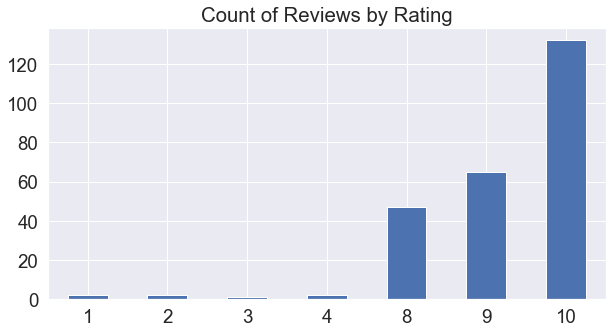

In [177]:
ax = sentiment_data['rating'].value_counts().sort_index() 
ax.plot(kind='bar',
          title='Count of Reviews by Rating',
          figsize=(10, 5))
plt.xticks(rotation = 0)
plt.show()

In [178]:
counts = sentiment_data.set_index('sentiment')['text'].str.split().explode().groupby(level=0).apply(pd.value_counts)
counts

sentiment               
0          the              18
           and              10
           a                10
           And               7
           is                7
                            ..
1          cinemas           1
           back!             1
           knew              1
           revolutionary     1
           thinking,         1
Name: text, Length: 2950, dtype: int64

In [179]:
sentiment_data

,rating,title,text,sentiment,id
0,10,One of the Best Animated Films Ever!,Toy Story is a sheer delight to view on the sc...,1,1
1,10,Witty Sweet Fun For All Ages. Forever Changed ...,This is as close to perfection as any animated...,1,2
2,10,Best animated movies ever made,Toy Story is one of my favourite animated film...,1,3
3,8,Toy Story,A wonderfully sculpted piece of filmmaking. It...,1,4
4,10,The best film for small children....,My toddler has been watching this film for abo...,1,5
...,...,...,...,...,...
246,10,toy story,I loved this movie woody was my favorite! I ha...,1,247
247,9,Best Film,This is the coolest movie ever! It's like watc...,1,248
248,10,Cant wait to see Roy Story 4,This movies serials are my life. I love all of...,1,249
249,10,Impressive,Never get bored of this interesting movie! I h...,1,250


### VADER Sentiment Analysis

In [180]:
sia = SentimentIntensityAnalyzer()

In [181]:
# Run the polarity score on the entire dataset
vader_res = {}
for i, row in tqdm(sentiment_data.iterrows(), total=len(sentiment_data)):
    text = row['text']
    myid = row['id']
    vader_res[myid] = sia.polarity_scores(text)

  0%|          | 0/251 [00:00<?, ?it/s]

In [182]:
vaders = pd.DataFrame(vader_res).T
vaders

,neg,neu,pos,compound
1,0.000,0.665,0.335,0.9869
2,0.051,0.702,0.247,0.9756
3,0.000,0.779,0.221,0.8309
4,0.000,0.688,0.312,0.9764
5,0.000,0.790,0.210,0.9602
...,...,...,...,...
247,0.000,0.748,0.252,0.8290
248,0.000,0.829,0.171,0.4738
249,0.000,0.769,0.231,0.6369
250,0.000,0.591,0.409,0.7649


In [183]:
vaders = vaders.reset_index().rename(columns={'index': 'id'})

In [184]:
vaders = vaders.merge(sentiment_data, how='left', on ="id")

In [185]:
vaders

,id,neg,neu,pos,compound,rating,title,text,sentiment
0,1,0.000,0.665,0.335,0.9869,10,One of the Best Animated Films Ever!,Toy Story is a sheer delight to view on the sc...,1
1,2,0.051,0.702,0.247,0.9756,10,Witty Sweet Fun For All Ages. Forever Changed ...,This is as close to perfection as any animated...,1
2,3,0.000,0.779,0.221,0.8309,10,Best animated movies ever made,Toy Story is one of my favourite animated film...,1
3,4,0.000,0.688,0.312,0.9764,8,Toy Story,A wonderfully sculpted piece of filmmaking. It...,1
4,5,0.000,0.790,0.210,0.9602,10,The best film for small children....,My toddler has been watching this film for abo...,1
...,...,...,...,...,...,...,...,...,...
246,247,0.000,0.748,0.252,0.8290,10,toy story,I loved this movie woody was my favorite! I ha...,1
247,248,0.000,0.829,0.171,0.4738,9,Best Film,This is the coolest movie ever! It's like watc...,1
248,249,0.000,0.769,0.231,0.6369,10,Cant wait to see Roy Story 4,This movies serials are my life. I love all of...,1
249,250,0.000,0.591,0.409,0.7649,10,Impressive,Never get bored of this interesting movie! I h...,1


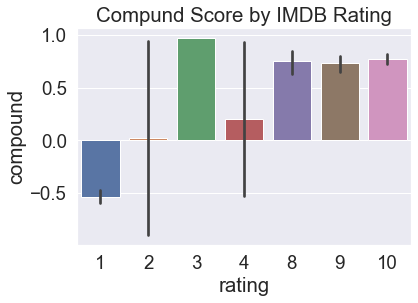

In [186]:
ax = sns.barplot(data=vaders, x='rating', y='compound')
ax.set_title('Compund Score by IMDB Rating')
plt.show()

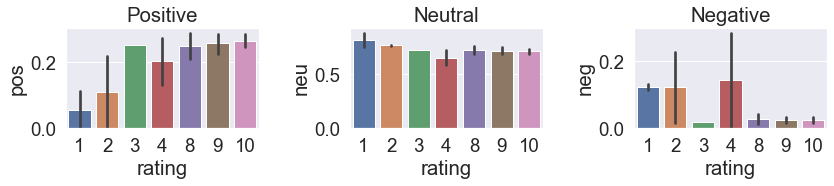

In [187]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=vaders, x='rating', y='pos', ax=axs[0])
sns.barplot(data=vaders, x='rating', y='neu', ax=axs[1])
sns.barplot(data=vaders, x='rating', y='neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

### Roberta Sentiment Analysis

In [188]:
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

In [189]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

In [190]:
example = sentiment_data['text'][50]
print(example)
print(sia.polarity_scores(example))

This Movie is the King of my Childhood of Pixar! Even the Characters are WAY Cooler then the "Ice Age" Characters.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


In [191]:
text

"In our childhood we love to play with toys but it's different, oppositely toys loves us... that's great idea! different thinking, good story"

In [192]:
encoded_text = tokenizer(example, return_tensors='pt')
output = model(**encoded_text)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_neg' : scores[0],
    'roberta_neu' : scores[1],
    'roberta_pos' : scores[2]
}
print(scores_dict)

{'roberta_neg': 0.002555938, 'roberta_neu': 0.032552924, 'roberta_pos': 0.96489125}


In [193]:
def polarity_scores_roberta(example):
    encoded_text = tokenizer(example, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg' : scores[0],
        'roberta_neu' : scores[1],
        'roberta_pos' : scores[2]
    }
    return scores_dict

In [194]:
res = {}
for i, row in tqdm(sentiment_data.iterrows(), total=len(sentiment_data)):
    try:
        text = row['text']
        myid = row['id']
        vader_result = sia.polarity_scores(text)
        vader_result_rename = {}
        for key, value in vader_result.items():
            vader_result_rename[f"vader_{key}"] = value
        roberta_result = polarity_scores_roberta(text)
        both = {**vader_result_rename, **roberta_result}
        res[myid] = both
    except RuntimeError:
        print(f'Broke for id {myid}')

  0%|          | 0/251 [00:00<?, ?it/s]

In [195]:
results_df = pd.DataFrame(res).T
results_df = results_df.reset_index().rename(columns={'index': 'id'})
results_df

,id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos
0,1,0.000,0.665,0.335,0.9869,0.001204,0.007923,0.990873
1,2,0.051,0.702,0.247,0.9756,0.002026,0.024444,0.973530
2,3,0.000,0.779,0.221,0.8309,0.001426,0.007492,0.991082
3,4,0.000,0.688,0.312,0.9764,0.001272,0.016648,0.982079
4,5,0.000,0.790,0.210,0.9602,0.003309,0.028049,0.968642
...,...,...,...,...,...,...,...,...
246,247,0.000,0.748,0.252,0.8290,0.001513,0.006368,0.992119
247,248,0.000,0.829,0.171,0.4738,0.001606,0.006293,0.992101
248,249,0.000,0.769,0.231,0.6369,0.001754,0.008727,0.989519
249,250,0.000,0.591,0.409,0.7649,0.011049,0.040303,0.948648


In [196]:
results_df = results_df.merge(sentiment_data, how='left', on ="id")

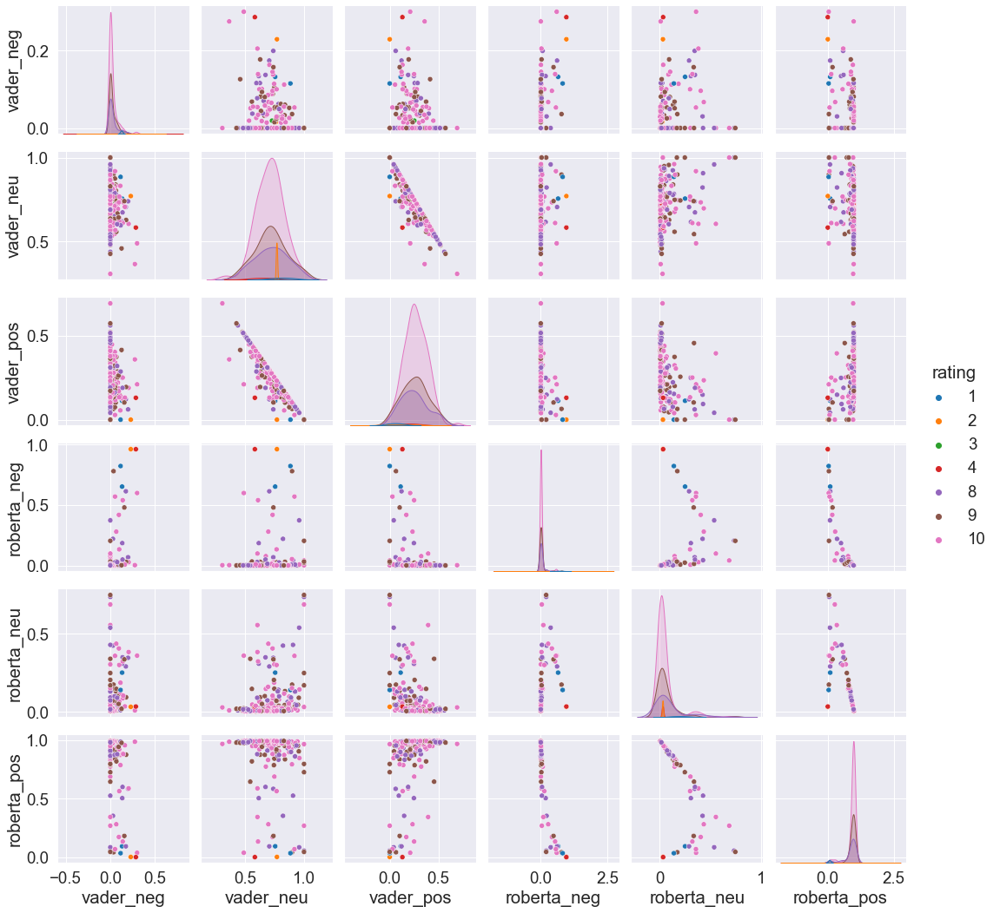

In [197]:
sns.pairplot(data=results_df,
             vars=['vader_neg', 'vader_neu', 'vader_pos',
                  'roberta_neg', 'roberta_neu', 'roberta_pos'],
            hue='rating',
            palette='tab10')
plt.show()

**Result of Sentiment Analysis Techniques and Their Comparison**

##### False Positive Ratings According to Sentiments

In [198]:
results_df_rosetta_fp = results_df[results_df['rating'] == 1]
results_df_rosetta_fp = results_df_rosetta_fp.sort_values('roberta_pos', ascending=False)
if results_df_rosetta_fp["roberta_pos"].iat[0] > results_df_rosetta_fp["roberta_neg"].iat[0]:
    print("Roberta thinks that this phrase is Positive!\n")
    print(results_df_rosetta_fp.sort_values('roberta_pos', ascending=False)['text'].values[0])
else:
    print("Roberta also thinks that it's Negative, but this is the most Positive rating it gives on Rating 1!\n")
    print(results_df_rosetta_fp.sort_values('roberta_pos', ascending=False)['text'].values[0])

Roberta also thinks that it's Negative, but this is the most Positive rating it gives on Rating 1!

I found this amusing for about no minutes whatsoever.

The movie has "franchise" written all over it. Are we ready for the dolls? The Burger King cups? Heck, yes, obviously - let's reduce all imagination to cheap commodities, sell our children on an open market and let business ethics only apply.

The "story" is soporific, the dialog cliché, the characters banal, the message simpering wimpy crap only suited for a sado-masochist on a hangover.

Gaudy bit of CGI fluff pretending to be a "children's classic" - only in the dreams of the cynical and the dead.


In [199]:
results_df_vader_fp = results_df[results_df['rating'] == 1]
results_df_vader_fp = results_df_vader_fp.sort_values('roberta_pos', ascending=False)
if results_df_vader_fp["vader_pos"].iat[0] > results_df_vader_fp["vader_neg"].iat[0]:
    print("Vader thinks that this phrase is Positive!\n")
    print(results_df_vader_fp.sort_values('vader_pos', ascending=False)['text'].values[0])
else:
    print("Vader also thinks that it's Negative, but this is the most Positive rating it gives on Rating 1!\n")
    print(results_df_vader_fp.sort_values('vader_pos', ascending=False)['text'].values[0])

Vader also thinks that it's Negative, but this is the most Positive rating it gives on Rating 1!

I found this amusing for about no minutes whatsoever.

The movie has "franchise" written all over it. Are we ready for the dolls? The Burger King cups? Heck, yes, obviously - let's reduce all imagination to cheap commodities, sell our children on an open market and let business ethics only apply.

The "story" is soporific, the dialog cliché, the characters banal, the message simpering wimpy crap only suited for a sado-masochist on a hangover.

Gaudy bit of CGI fluff pretending to be a "children's classic" - only in the dreams of the cynical and the dead.


##### False Negative Ratings According to Sentiments

In [200]:
results_df_rosetta_tn = results_df[results_df['rating'] == 10]
results_df_rosetta_tn = results_df_rosetta_tn.sort_values('roberta_neg', ascending=False)
results_df_rosetta_tn["roberta_neg"].iat[0] > results_df_rosetta_tn["roberta_pos"].iat[0]

if results_df_rosetta_tn["roberta_neg"].iat[0] > results_df_rosetta_tn["roberta_pos"].iat[0]:
    print("Roberta thinks that this phrase is Negative on Rating 10!\n")
    print(results_df_rosetta_tn.sort_values('roberta_neg', ascending=False)['text'].values[0])
else:
    print("Roberta says it's Positive, but this is the most Negative rating it gives on Rating 10!\n")
    print(results_df_rosetta_fp.sort_values('roberta_neg', ascending=False)['text'].values[0])

Roberta thinks that this phrase is Negative on Rating 10!

If you didn't hate buzz lightyear you're not a true fan


In [201]:
results_df_vader_tn = results_df[results_df['rating'] == 10]
results_df_vader_tn = results_df_vader_tn.sort_values('vader_neg', ascending=False)
results_df_vader_tn["vader_neg"].iat[0] > results_df_vader_tn["vader_pos"].iat[0]

if results_df_vader_tn["vader_neg"].iat[0] > results_df_vader_tn["vader_pos"].iat[0]:
    print("Vader thinks that this phrase is Negative on Rating 10!\n")
    print(results_df_vader_tn.sort_values('vader_neg', ascending=False)['text'].values[0])
else:
    print("Vader says it's Positive, but this is the most Negative rating it gives on Rating 10!\n")
    print(results_df_vader_fp.sort_values('vader_neg', ascending=False)['text'].values[0])

Vader thinks that this phrase is Negative on Rating 10!

If you didn't hate buzz lightyear you're not a true fan


### Hugging Face Sentiment Analysis 

In [202]:
#Hugging Face Sentiment Analysis Creation
def hugging_face_df():
    from transformers import pipeline
    sentiment_data = pd.read_csv("data.csv",sep="\t")
    hugging_df = sentiment_data[["rating","text","sentiment"]]
    hugging_df["Score_🤗"] = np.nan
    hugging_df["Sentiment_🤗"] = np.nan
    sent_pipeline = pipeline("sentiment-analysis")
    
    for i in range(len(hugging_df)):
        a = sent_pipeline(hugging_df["text"][i])
        hugging_df["Score_🤗"][i] = a[0]["score"]
        hugging_df["Sentiment_🤗"][i] = a[0]["label"]
        
    hugging_df['Sentiment_🤗'] = hugging_df['Sentiment_🤗'].replace(['POSITIVE'],1)
    hugging_df['Sentiment_🤗'] = hugging_df['Sentiment_🤗'].replace(['NEGATIVE'],0)
    
    return hugging_df

In [203]:
hugging_df = hugging_face_df()
hugging_df

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


,rating,text,sentiment,Score_🤗,Sentiment_🤗
0,10,Toy Story is a sheer delight to view on the sc...,1,0.999882,1
1,10,This is as close to perfection as any animated...,1,0.999729,1
2,10,Toy Story is one of my favourite animated film...,1,0.999809,1
3,8,A wonderfully sculpted piece of filmmaking. It...,1,0.999889,1
4,10,My toddler has been watching this film for abo...,1,0.999656,1
...,...,...,...,...,...
246,10,I loved this movie woody was my favorite! I ha...,1,0.999762,1
247,9,This is the coolest movie ever! It's like watc...,1,0.999823,1
248,10,This movies serials are my life. I love all of...,1,0.999810,1
249,10,Never get bored of this interesting movie! I h...,1,0.999712,1


In [204]:
#Hugging Face Sentiment Analysis Comparison
def hugging_sentiment():
    hugging_df = hugging_face_df()
    same_sentiment = hugging_df[hugging_df["sentiment"] == hugging_df["Sentiment_🤗"]].value_counts().sum()
    diff_sentiment = hugging_df[hugging_df["sentiment"] != hugging_df["Sentiment_🤗"]].value_counts().sum()
    temp = "In total, there are {} different sentiment analysis records. The sentiment analysis is {:0.2f}% same with rating.Sentiment=1 is: {} and Sentiment=0 is: {}".format(diff_sentiment,(same_sentiment/len(hugging_df) *100),hugging_df[hugging_df["Sentiment_🤗"] == 1]["Sentiment_🤗"].count(),hugging_df[hugging_df["Sentiment_🤗"] == 0]["Sentiment_🤗"].count())
    return(temp)

In [205]:
hugging_sentiment = hugging_sentiment()
hugging_sentiment

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


'In total, there are 16 different sentiment analysis records. The sentiment analysis is 93.63% same with rating.Sentiment=1 is: 236 and Sentiment=0 is: 15'

In [206]:
#Hugging Face Sentiment Analysis Visualization
def hugging_visual():
    hugging_df = hugging_face_df()
    fig, axs = plt.subplots(1, 2, figsize=(12, 3))
    sns.barplot(data=hugging_df, x='rating', y='Score_🤗', ax=axs[0])
    sns.barplot(data=hugging_df, x='sentiment', y='Sentiment_🤗', ax=axs[1])

    axs[0].set_title('Rating Comparison')
    axs[0].set_xlabel("Rating")
    axs[0].set_ylabel("Hugging Rating")

    axs[1].set_title('Sentiment Comparison')
    axs[1].set_xlabel("Sentiment")
    axs[1].set_ylabel("Hugging Sentiment")

    plt.tight_layout()
    plt.show()

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


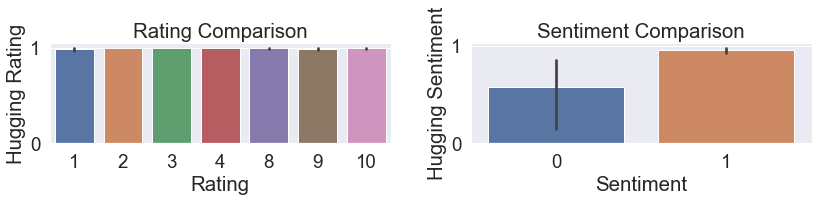

In [207]:
hugging_visual = hugging_visual()
hugging_visual

##### False Positive and False Negative Hugging Face Ratings According to Sentiments

In [208]:
def hugging_fp_fn():
    hugging_df = hugging_face_df()
    diff_hf = hugging_df[hugging_df["sentiment"] != hugging_df["Sentiment_🤗"]]
    one_to_four = diff_hf[diff_hf["rating"] < 5].sort_values(by='Score_🤗', ascending=False)
    eight_to_ten = diff_hf[diff_hf["rating"] > 5].sort_values(by='Score_🤗', ascending=False)
    
    for index,row in one_to_four.iterrows():
        a = "When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Positive! "+"The False Positive Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
    for index,row in eight_to_ten.iterrows():
        b = ". When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Negative! "+". The False Negative Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
    c = str(a)+str(b)
    c_rep = c.replace("\n", "")
    return(c_rep)
        

In [209]:
hugging_fp_fn = hugging_fp_fn()
hugging_fp_fn

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


"When rating is equal to 1 the Hugging Face sentimented it as Positive! The False Positive Text: This film fills me with more rage than the burning of Atlanta. I can't believe this was a movie that was actually made.Although, Buzz Lightyear can take me to infinity and beyond. The Guess Score is 0.9630057215690613 with value 1. When rating is equal to 10 the Hugging Face sentimented it as Negative! . The False Negative Text: I Thought that toy story Will win for best original song, but I forgot that in this category colors of the wind (Pocahontas) won The Guess Score is 0.8042114973068237 with value 0"

##### True Positive and True Negative Hugging Face Ratings According to Sentiments

In [210]:
def hugging_tp_tn():
    hugging_df = hugging_face_df()
    diff_hf = hugging_df[hugging_df["sentiment"] == hugging_df["Sentiment_🤗"]]
    one_to_four = diff_hf[diff_hf["rating"] < 5].sort_values(by='Score_🤗', ascending=False)
    eight_to_ten = diff_hf[diff_hf["rating"] > 5].sort_values(by='Score_🤗', ascending=False)
    
    for index,row in one_to_four.iterrows():
        a = "When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Negative! "+"The False Positive Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
    for index,row in eight_to_ten.iterrows():
        b = ". When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Positive! "+". The False Negative Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
    c = a+b
    c_rep = c.replace("\n", "")
    return(c_rep)
        

In [211]:
hugging_tp_tn = hugging_tp_tn()
hugging_tp_tn

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


'When rating is equal to 1 the Hugging Face sentimented it as Negative! The False Positive Text: I found this amusing for about no minutes whatsoever.The movie has "franchise" written all over it. Are we ready for the dolls? The Burger King cups? Heck, yes, obviously - let\'s reduce all imagination to cheap commodities, sell our children on an open market and let business ethics only apply.The "story" is soporific, the dialog cliché, the characters banal, the message simpering wimpy crap only suited for a sado-masochist on a hangover.Gaudy bit of CGI fluff pretending to be a "children\'s classic" - only in the dreams of the cynical and the dead. The Guess Score is 0.9990481734275818 with value 0. When rating is equal to 9 the Hugging Face sentimented it as Positive! . The False Negative Text: This movie will never get old! \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\ The Guess Score is

## 1- Simple Recommenders (Popularity Based)

It offers generalized recommendations to every user, based on movie popularity and/or genre with the global popularity. The basic idea behind this system is that movies that are more popular and critically acclaimed will have a higher probability of being liked by the average audience. An example could be "Top 250 Movies to Watch". In this section, I will build a simplified clone of IMDB Top 250 Movies using metadata dataset and create a simple recommender. For this section I will use the IMDB's rating formula.

#### The formula is:

<img src="images/IMDB_formula.jpg" alt="alt_text" width="240" height="240">






v is the number of votes for the movie      
m is the minimum votes required to be listed in the chart       
R is the average rating of the movie      
C is the mean vote across the whole report     

### a) Top 250 Films Based On IMDB's Weighted Rating Formula:

In [212]:
def top_250_simple_recommender(x,y):
    
    c = x["vote_average"].mean()
    m = x["vote_count"].quantile(y)
    
    top_250_movies = x.copy().loc[x["vote_count"] >= m]
    top_250_movies_pop = top_250_movies.copy().loc[x["vote_count"] >= c]
    
    def weighted_rating(x, m=m, C=c):
        v = x["vote_count"]
        R = x["vote_average"]
        # Calculation based on the IMDB formula
        return (v/(v+m) * R) + (m/(m+v) * C)

    top_250_movies_pop['score'] = top_250_movies.apply(weighted_rating, axis=1)
    top_250_movies_pop = top_250_movies_pop.sort_values('score', ascending=False)
    
    #Print the top 250 movies
    sorted_top_250_movies = top_250_movies_pop[['title', 'vote_count', 'vote_average', 'score']]
    
    return sorted_top_250_movies

##### From "IMDB_dataset" folder:

In [213]:
imdb_all = imdb_all_df[imdb_all_df["titleType"] == ("movie" or "tvMovie")]
imdb_top_250_simple_recommender = top_250_simple_recommender(imdb_all,0.998295).head(10)
imdb_top_250_simple_recommender_list = imdb_top_250_simple_recommender["title"].tolist()
imdb_top_250_simple_recommender

,title,vote_count,vote_average,score
59936,The Shawshank Redemption,2159745,9.3,8.784839
134224,The Dark Knight,2134602,9.0,8.528808
37052,The Godfather,1482225,9.2,8.523044
59756,Pulp Fiction,1695159,8.9,8.350533
165274,Inception,1892958,8.8,8.315638
75568,The Lord of the Rings: The Return of the King,1533632,8.9,8.305037
67654,Fight Club,1725444,8.8,8.277769
59077,Forrest Gump,1662609,8.8,8.261992
62370,The Lord of the Rings: The Fellowship of the Ring,1548920,8.8,8.230881
39155,The Godfather: Part II,1032110,9.0,8.170366


##### From "movies" and "titles" folders:

In [214]:
top_250_simple_recommenders = top_250_simple_recommender(Movies,0.99445).head(10)
top_250_simple_recommenders

,title,vote_count,vote_average,score
id,,,,
155,The Dark Knight,12269.0,8.3,7.742851
278,The Shawshank Redemption,8358.0,8.5,7.699050
27205,Inception,14075.0,8.1,7.638305
550,Fight Club,9678.0,8.3,7.630984
680,Pulp Fiction,8670.0,8.3,7.574298
157336,Interstellar,11187.0,8.1,7.545796
238,The Godfather,6024.0,8.5,7.496959
13,Forrest Gump,8147.0,8.2,7.469294
122,The Lord of the Rings: The Return of the King,8226.0,8.1,7.402507


It is very similar to the IMDB's top 10 movies; so, we can clearly say that the Simple Recommendation Based On Popularity worked pretty well. Also, the dataset gathered from both IMDB and metadata work very similarly with few ordering differences, so, we can say that the simple recommendation worked quite well.

**So, a question for this recommender can be this:** If we can do the same process to all the data and select the most recommended and liked movies or tv shows, wouldn't it be enough for us to to recommend it to everyone ? Why we need other recommenders ? 

- The main reason for that is every people are different than others. They may not like the same genre, same type of movies or even their cultural differences can effect the results and create a biased dataset. To use a more accurate dataset and recommendation engine, the simple recommender stay in the lowest recommender category based on this issue. Even for this metadata and IMDB example, the voting differences and number of votes changed the direction of the system and even the more popular movies maybe not showed in this system. Also, the data changes from one to another so it is not possible to clearly say that these are the best movies of all time that everybody will like or love for sure. Contrary, the system shows that there are differences from one to another.

For further explanation, I will list both of their top 250 datasets and compare the MovieLens Top 250 with respect to the most well-known IMDB Top 250.

In [215]:
temp_movies = top_250_simple_recommender(Movies,0.99445)
movies_top250 = temp_movies["title"].tolist()

temp_IMDB = top_250_simple_recommender(imdb_all,0.998295)
imdb_top250 = temp_IMDB["title"].tolist()

In [216]:
movies_top250[:10]

['The Dark Knight',
 'The Shawshank Redemption',
 'Inception',
 'Fight Club',
 'Pulp Fiction',
 'Interstellar',
 'The Godfather',
 'Forrest Gump',
 'The Lord of the Rings: The Return of the King',
 'The Lord of the Rings: The Fellowship of the Ring']

In [217]:
imdb_top250[:10]

['The Shawshank Redemption',
 'The Dark Knight',
 'The Godfather',
 'Pulp Fiction',
 'Inception',
 'The Lord of the Rings: The Return of the King',
 'Fight Club',
 'Forrest Gump',
 'The Lord of the Rings: The Fellowship of the Ring',
 'The Godfather: Part II']

In [218]:
difference_list = []
count = 0
for i in range(len(imdb_top250)):
    if imdb_top250[i] not in movies_top250:
        difference_list.append(imdb_top250[i])
        count += 1
print("There are {} different movies listed in IMDB but not in Metadata dataset.\nThe overall film included in IMDB from Metadata is: {:0.2f}%"
      .format(count,(len(movies_top250)-count)*100/len(movies_top250)))

There are 83 different movies listed in IMDB but not in Metadata dataset.
The overall film included in IMDB from Metadata is: 66.80%


* To sum up, the difference comes from the datetime added and number of votes from same or different users based on their preferences with their usage of the platform. In general, the more data shows more greater results so the most accurate simple movie recommender would come from the IMDB dataset, but to show how the system can be different I also used the metadata to display the difference between the datasets. For any other platform dataset it may not be even close to eachother or would be exactly the same, we can't know that for sure before testing it.

### b) Top Genre Films Based On IMDB's Weighted Rating Formula:

In [219]:
def genre_based_dataset(genre):
    Movies_temp = Movies.copy()
    Movies_temp = Movies_temp[['title','genres',"vote_count","vote_average"]]
    Movies_temp_genre = Movies_temp.join(Movies_temp.genres.str.get_dummies(sep=', '))
    Movies_temp_genre = Movies_temp_genre[Movies_temp_genre[genre] == 1]
    return Movies_temp_genre

In [220]:
genre_based_recommender = top_250_simple_recommender((genre_based_dataset("Comedy")),0.95)
genre_based_recommender

,title,vote_count,vote_average,score
id,,,,
13,Forrest Gump,8147.0,8.2,8.054453
77338,The Intouchables,5410.0,8.2,7.987140
637,Life Is Beautiful,3643.0,8.3,7.984291
105,Back to the Future,6239.0,8.0,7.828352
120467,The Grand Budapest Hotel,4644.0,8.0,7.775212
...,...,...,...,...
17610,Year One,538.0,4.6,5.144065
329833,Zoolander 2,814.0,4.7,5.092052
4258,Scary Movie 5,813.0,4.6,5.030804


In [221]:
genre_based_recommender = top_250_simple_recommender((genre_based_dataset("Romance")),0.95).head(10)
genre_based_recommender

,title,vote_count,vote_average,score
id,,,,
13,Forrest Gump,8147.0,8.2,8.079342
19404,Dilwale Dulhania Le Jayenge,661.0,9.1,7.797738
313369,La La Land,4745.0,7.9,7.725221
152601,Her,4215.0,7.9,7.705295
372058,Your Name.,1030.0,8.5,7.703838
38,Eternal Sunshine of the Spotless Mind,3758.0,7.9,7.684069
194,Amélie,3403.0,7.8,7.575401
266856,The Theory of Everything,3403.0,7.8,7.575401
11036,The Notebook,3163.0,7.7,7.472479


### c) Couple Genre Films Based On IMDB's Weighted Rating Formula:

In [222]:
def couple_genre_simple_recommender(x,y):
    movies_1 = genre_based_dataset(x)
    movies_2 = genre_based_dataset(y)
    couple_movies = pd.merge(movies_1, movies_2, left_index=True, right_index=True)
    couple_movies = couple_movies[['title_x', 'genres_x', 'vote_count_x', 'vote_average_x']]
    couple_movies.columns = couple_movies.columns.str.replace('_x','')
    return couple_movies

In [223]:
couple_movies = couple_genre_simple_recommender("Comedy","Romance")

In [224]:
couple_recommend = top_250_simple_recommender(couple_movies,0.95)
couple_recommend.head(10)

,title,vote_count,vote_average,score
id,,,,
13,Forrest Gump,8147.0,8.2,8.057669
313369,La La Land,4745.0,7.9,7.693963
19404,Dilwale Dulhania Le Jayenge,661.0,9.1,7.652405
194,Amélie,3403.0,7.8,7.535938
334533,Captain Fantastic,1569.0,7.9,7.377717
200727,"Love, Rosie",1660.0,7.7,7.246029
812,Aladdin,3495.0,7.4,7.192099
83666,Moonrise Kingdom,1701.0,7.6,7.177209
239,Some Like It Hot,835.0,8.0,7.153140


## 2- Content Based Recommenders

It offers recommendations based on products with similar qualities are suggested based on the items' traits and information. For instance, a recommender can examine a film's genre and director to suggest other films with related qualities.

#### The formula is:

<img src="images/cosine_similarity.jpg" alt="alt_text" width="480" height="480">


In [225]:
content_movies = Movies.copy()
content_movies = content_movies.reset_index()
content_movies.head(5)

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,overview,popularity,production_companies,...,movie_genre,Poster,platform,keywords,cast,director,profit,year,month,day
0,862,Toy Story Collection,30000000.0,"Animation, Comedy, Family",1,tt0114709,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,Pixar Animation Studios,...,Animation|Adventure|Comedy,https://images-na.ssl-images-amazon.com/images...,Disney Plus,"jealousy, toy, boy, friendship, friends, rival...","Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...",John Lasseter,12.451801,1995,10,30
1,8844,NaN,65000000.0,"Adventure, Fantasy, Family",1,tt0113497,en,Roll the dice and unleash the excitement! When...,17.015539,"TriStar Pictures, Teitler Film, Interscope Com...",...,Action|Adventure|Family,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"board game, disappearance, based on children's...","Robin Williams, Jonathan Hyde, Kirsten Dunst, ...",Joe Johnston,4.043035,1995,12,15
2,15602,Grumpy Old Men Collection,NaN,"Romance, Comedy",1,tt0113228,en,Still Yelling. Still Fighting. Still Ready for...,11.712900,"Warner Bros., Lancaster Gate",...,Comedy|Romance,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"fishing, best friend, duringcreditsstinger, ol...","Walter Matthau, Jack Lemmon, Ann-Margret, Soph...",Howard Deutch,NaN,1995,12,22
3,31357,NaN,16000000.0,"Comedy, Drama, Romance",1,tt0114885,en,Friends are the people who let you be yourself...,3.859495,Twentieth Century Fox Film Corporation,...,Comedy|Drama|Romance,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"based on novel, interracial relationship, sing...","Whitney Houston, Angela Bassett, Loretta Devin...",Forest Whitaker,5.090760,1995,12,22
4,11862,Father of the Bride Collection,NaN,Comedy,1,tt0113041,en,Just When His World Is Back To Normal... He's ...,8.387519,"Sandollar Productions, Touchstone Pictures",...,Comedy|Family|Romance,https://images-na.ssl-images-amazon.com/images...,Other Platforms,"baby, midlife crisis, confidence, aging, daugh...","Steve Martin, Diane Keaton, Martin Short, Kimb...",Charles Shyer,NaN,1995,2,10


In [226]:
type(content_movies["director"])

pandas.core.series.Series

In [227]:
content_movies["cast_renew"] = np.nan
content_movies["keywords_renew"] = np.nan
content_movies["genres_renew"] = np.nan
content_movies["director_renew"] = np.nan

for i in range(len(content_movies)):
    content_movies["cast_renew"][i] = str(content_movies["cast"][i]).lower().split(",")
    for j in range(len(content_movies["cast_renew"][i])):
        content_movies["cast_renew"][i][j] = content_movies["cast_renew"][i][j].replace(" ","")
for i in range(len(content_movies)):
    content_movies["keywords_renew"][i] = str(content_movies["keywords"][i]).lower().split(",")
    for j in range(len(content_movies["keywords_renew"][i])):
        content_movies["keywords_renew"][i][j] = content_movies["keywords_renew"][i][j].replace(" ","")
for i in range(len(content_movies)):
    content_movies["genres_renew"][i] = str(content_movies["genres"][i]).lower().split(",")
    for j in range(len(content_movies["genres_renew"][i])):
        content_movies["genres_renew"][i][j] = content_movies["genres_renew"][i][j].replace(" ","")
for i in range(len(content_movies)):
    content_movies["director_renew"][i] = str(content_movies["director"][i]).lower().split(",")
    for j in range(len(content_movies["director_renew"][i])):
        content_movies["director_renew"][i][j] = content_movies["director_renew"][i][j].replace(" ","")

In [228]:
content_movies.drop(['cast', 'keywords','genres','director'], axis = 1, inplace = True)

In [229]:
dictio = {'cast_renew': 'cast',
          'keywords_renew': 'keywords',
          'genres_renew': 'genres',
          'director_renew': 'director'}
 
# call rename () method
content_movies.rename(columns=dictio,inplace=True)

In [230]:
content_movies["title"][0]

'Toy Story'

In [231]:
content_movies['cast'] = [','.join(map(str, l)) for l in content_movies['cast']]
content_movies['keywords'] = [','.join(map(str, l)) for l in content_movies['keywords']]
content_movies['genres'] = [','.join(map(str, l)) for l in content_movies['genres']]
content_movies['director'] = [','.join(map(str, l)) for l in content_movies['director']]

In [232]:
content_movies['soup'] = np.nan
for i in range(len(content_movies)):
    content_movies['soup'][i] = content_movies['cast'][i] + ',' + content_movies['keywords'][i] + ','+ content_movies['genres'][i] + ','+ content_movies['director'][i]
print(content_movies["soup"],type(content_movies["soup"][0]))

0        tomhanks,timallen,donrickles,jimvarney,wallace...
1        robinwilliams,jonathanhyde,kirstendunst,bradle...
2        waltermatthau,jacklemmon,ann-margret,sophialor...
3        whitneyhouston,angelabassett,lorettadevine,lel...
4        stevemartin,dianekeaton,martinshort,kimberlywi...
                               ...                        
44965    leilahatami,kouroshtahami,elhamkorda,tragiclov...
44966    angelaquino,perrydizon,hazelorencio,joeltorre,...
44967    erikaeleniak,adambaldwin,juliedupage,jamesrema...
44968    iwanmosschuchin,nathalielissenko,pavelpavlov,a...
44969                                nan,nan,,daisyasquith
Name: soup, Length: 44970, dtype: object <class 'str'>


In [233]:
for i in range(len(content_movies)):
    content_movies["soup"][i] = content_movies["soup"][i].replace(","," ")
for i in range(len(content_movies)):
    content_movies["genres"][i] = content_movies["genres"][i].replace(","," ")

In [234]:
content_movies_soup = content_movies[["title","soup","year","vote_average","genres"]]
content_movies_soup

,title,soup,year,vote_average,genres
0,Toy Story,tomhanks timallen donrickles jimvarney wallace...,1995,7.7,animation comedy family
1,Jumanji,robinwilliams jonathanhyde kirstendunst bradle...,1995,6.9,adventure fantasy family
2,Grumpier Old Men,waltermatthau jacklemmon ann-margret sophialor...,1995,6.5,romance comedy
3,Waiting to Exhale,whitneyhouston angelabassett lorettadevine lel...,1995,6.1,comedy drama romance
4,Father of the Bride Part II,stevemartin dianekeaton martinshort kimberlywi...,1995,5.7,comedy
...,...,...,...,...,...
44965,Subdue,leilahatami kouroshtahami elhamkorda tragiclov...,0,4.0,drama family
44966,Century of Birthing,angelaquino perrydizon hazelorencio joeltorre ...,2011,9.0,drama
44967,Betrayal,erikaeleniak adambaldwin juliedupage jamesrema...,2003,3.8,action drama thriller
44968,Satan Triumphant,iwanmosschuchin nathalielissenko pavelpavlov a...,1917,0.0,


In [235]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(content_movies_soup['soup'])
cosine_sim = cosine_similarity(count_matrix, count_matrix)

In [236]:
content_movies_soup = content_movies_soup.reset_index()
indices = pd.Series(content_movies_soup.index, index=content_movies_soup['title'])

In [237]:
def get_recommendations(title, cosine_sim = cosine_sim):
    idx = indices[title]  
    sim_scores = list(enumerate(cosine_sim[idx])) 
    #print(sim_scores)
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True) 
    #print(sim_scores)
    sim_scores = sim_scores[1:11] 
    #print(sim_scores)
    movie_indices = [i[0] for i in sim_scores] 

    movies = content_movies_soup.iloc[movie_indices][['title', 'year', 'vote_average','soup']] 
    returned = movies.sort_values('vote_average', ascending = False)["title"]
    return returned

In [238]:
get_recommendations('Toy Story')

15267                         Toy Story 3
2982                          Toy Story 2
21767                Toy Story of Terror!
3294                    Creature Comforts
27182                               Anina
24332                   Hawaiian Vacation
25603          Toy Story That Time Forgot
24334                           Small Fry
15482    The Bugs Bunny/Road Runner Movie
14581               Ernest Goes to School
Name: title, dtype: object

In [239]:
content_based_recommendation = get_recommendations('Avatar')
content_based_recommendation

27555                                       Pan
43446                               Justin Time
9604                         Aliens of the Deep
18761                               Icarus XB 1
37965                       Karas: The Prophecy
13080                                 Dinotopia
30492        Journey to the Center of the Earth
8818                            Barbarian Queen
17394                             Almighty Thor
14532    Playmobil: The Secret of Pirate Island
Name: title, dtype: object

## 3- Collaborative Filtering Recommenders

This method makes advantage of historical user activity to anticipate products that users may be interested in. It takes into account the movies a user has already viewed, the numerical ratings provided to those materials, and previously viewed movies by people who are similar to them.



In [240]:
newdf = link_rating.drop_duplicates(subset = ['imdb_id', 'user_id'], keep = 'last').reset_index(drop = True)

In [241]:
final_dataset = newdf.pivot(index='imdb_id',columns='user_id',values='rating')
final_dataset.head(10)

user_id,1,2,3,4,5,6,7,8,9,10,...,270887,270888,270889,270890,270891,270892,270893,270894,270895,270896
imdb_id,,,,,,,,,,,,,,,,,,,,,
tt01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt01000095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt0100014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt0100024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt0100029,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt0100031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt0100033,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tt0100046,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [242]:
final_dataset.fillna(0,inplace=True)
final_dataset.head(10)

user_id,1,2,3,4,5,6,7,8,9,10,...,270887,270888,270889,270890,270891,270892,270893,270894,270895,270896
imdb_id,,,,,,,,,,,,,,,,,,,,,
tt01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt01000095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100024,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100029,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100031,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100033,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [243]:
no_user_voted = link_rating.groupby('imdb_id')['rating'].agg('count')
no_movies_voted = link_rating.groupby('user_id')['rating'].agg('count')

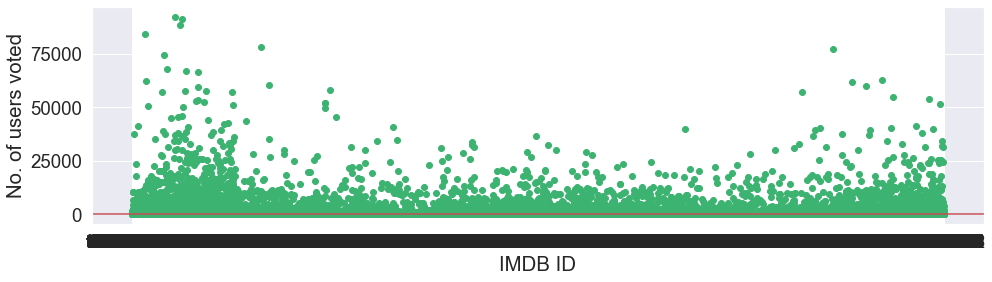

In [244]:
fig,ax = plt.subplots(1,1,figsize=(16,4))
# ratings['rating'].plot(kind='hist')
plt.scatter(no_user_voted.index,no_user_voted,color='mediumseagreen')
plt.axhline(y=10,color='r')
plt.xlabel('IMDB ID')
plt.ylabel('No. of users voted')
plt.show()

In [245]:
final_dataset = final_dataset.loc[no_user_voted[no_user_voted > 10].index,:]

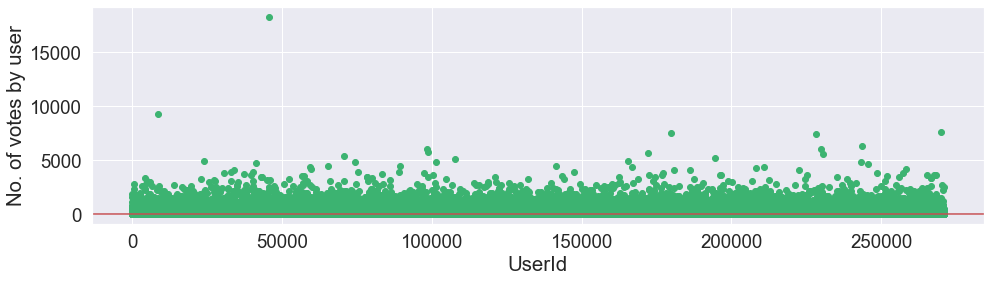

In [246]:
fig,ax = plt.subplots(1,1,figsize=(16,4))
plt.scatter(no_movies_voted.index,no_movies_voted,color='mediumseagreen')
plt.axhline(y=50,color='r')
plt.xlabel('UserId')
plt.ylabel('No. of votes by user')
plt.show()

In [247]:
final_dataset=final_dataset.loc[:,no_movies_voted[no_movies_voted > 50].index]
final_dataset

user_id,2,3,4,5,7,8,9,10,11,12,...,270871,270872,270877,270879,270885,270887,270892,270893,270894,270896
imdb_id,,,,,,,,,,,,,,,,,,,,,
tt010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt01000095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100024,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100029,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt0100046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt099939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt099951,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tt099969,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [248]:
from scipy.sparse import csr_matrix
csr_data = csr_matrix(final_dataset.values)
final_dataset.reset_index(inplace=True)

In [385]:
from sklearn.neighbors import NearestNeighbors
knn = NearestNeighbors(metric='cosine', algorithm='brute', n_neighbors=5, n_jobs=-1)
knn.fit(csr_data)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1)

In [386]:
def collaborative_movie_recommendation(movie_name):
    movies_to_recommend = 20
    movie_list = Movies[Movies['title'].str.contains(movie_name)]  
    movie_idx = movie_list.iloc[0]['imdb_id']
    if movie_idx in final_dataset['imdb_id'].values:
        movie_idx = final_dataset[final_dataset['imdb_id'] == movie_idx].index[0]
        distances , indices = knn.kneighbors(csr_data[movie_idx],n_neighbors=movies_to_recommend+1)  
        rec_movie_indices = sorted(list(zip(indices.squeeze().tolist(),distances.squeeze().tolist())),key=lambda x: x[1])[:0:-1]
        recommend_frame = []
        for val in rec_movie_indices:
            movie_idx = final_dataset.iloc[val[0]]['imdb_id']
            idx = Movies[Movies['imdb_id'] == movie_idx].index
            recommend_frame.append({'Title':Movies.iloc[idx]['title'].values,'Distance':val[1]})
        df = pd.DataFrame(recommend_frame)
        df = df[df.Title != "[]"]
        df.reset_index(drop=True, inplace=True)
        for i in range(len(df)):
            df["Title"][i] = df["Title"][i][0]
        return df
    else:
        return "No movies found. Please check your input"

In [387]:
collaborative_movie_recommendation('Toy Story')

,Title,Distance
0,The Silence of the Lambs,0.440542
1,Target,0.437455
2,Beyond Bedlam,0.436964
3,My Family,0.433925
4,Hellraiser: Bloodline,0.430615
5,The Aristocats,0.426718
6,Chain Reaction,0.425028
7,True Crime,0.422973
8,New Jersey Drive,0.420655
9,The Pallbearer,0.417048


**Surprise Library Based Collaborative Filtering:**       

In another Collaborative Filtering, I will use the Surprise library that used extremely powerful algorithms like Singular Value Decomposition (SVD) to minimise RMSE (Root Mean Square Error) and give great recommendations.

In [252]:
from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

In [253]:
reader = Reader() 
data = Dataset.load_from_df(newdf[['user_id', 'movieId', 'rating']], reader)
svd = SVD()
cross_validate(svd, data, measures=['RMSE', 'MAE'], cv=5, verbose=True)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7965  0.7962  0.7967  0.7964  0.7963  0.7964  0.0002  
MAE (testset)     0.6024  0.6022  0.6025  0.6025  0.6024  0.6024  0.0001  
Fit time          227.69  224.47  235.35  232.64  215.09  227.05  7.07    
Test time         50.80   51.34   48.70   53.33   45.48   49.93   2.67    


{'test_rmse': array([0.79645765, 0.79621093, 0.79670703, 0.79644471, 0.79634716]),
 'test_mae': array([0.60238261, 0.6021646 , 0.6025156 , 0.60249129, 0.60239091]),
 'fit_time': (227.69407892227173,
  224.4716601371765,
  235.35481309890747,
  232.6412160396576,
  215.09264206886292),
 'test_time': (50.80048108100891,
  51.340474128723145,
  48.697185039520264,
  53.32962489128113,
  45.48495697975159)}

In [254]:
trainset = data.build_full_trainset()
svd.trainset

In [255]:
svd.predict(25, 586, 5)

Prediction(uid=25, iid=586, r_ui=5, est=3.215049020373902, details={'was_impossible': False})

## 4- Hybrid Recommender

In [388]:
id_map = Complete_Link[["movieId","tmdbId"]]
id_map = id_map.fillna(0)
id_map = id_map.astype({"tmdbId": int})

In [389]:
temp_movies = Movies.copy()
temp_movies["id"] = temp_movies.index
temp_movies_df = temp_movies.copy()
temp_movies.reset_index(drop=True, inplace=True)
temp_movies = temp_movies.astype({"id": int})

In [390]:
id_map.columns = ['movieId', 'id']
id_map = id_map.merge(temp_movies[['title', 'id']], on='id').set_index('title')

In [391]:
indices_map = id_map.set_index('id')
indices_map

,movieId
id,
862,1
8844,2
15602,3
31357,4
11862,5
...,...
439050,176269
111109,176271
67758,176273


In [261]:
Movies_movie_list = Movies["title"].to_list()
#Movies_movie_list
Movie_id_list = indices_map["movieId"].to_list()
#Movie_id_list

In [262]:
a = svd.predict(1, indices_map.loc[803]['movieId']).est
a

3.6889781066910143

In [263]:
def hybrid_func(userId, title):
    i = 0
    idx = indices[title]
    tmdbId = id_map.loc[title]['id']
    #print(idx)
    movie_id = id_map.loc[title]['movieId']
    
    sim_scores = list(enumerate(cosine_sim[int(idx)]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:26]
    movie_indices = [i[0] for i in sim_scores]
    
    movies = temp_movies_df.iloc[movie_indices][['title', 'vote_count', 'vote_average', 'year', 'id']]
    movies['est'] = np.nan
    for x in movies.index:
        movies['est'][i] = svd.predict(userId, indices_map.loc[int(x)]['movieId']).est
        i = i+1
    movies = movies.sort_values('est', ascending=False)
    return movies[["title","est"]].head(10)

In [411]:
hybrid_function = hybrid_func(1, 'Toy Story')
hybrid_function

,title,est
id,,
54825,Creature Comforts,3.891155
10193,Toy Story 3,3.878525
145760,Last Year's Snow Was Falling,3.755683
863,Toy Story 2,3.690841
83746,Broom-Stick Bunny,3.619881
20007,The Bugs Bunny/Road Runner Movie,3.568617
54559,Minions: Orientation Day,3.443394
89816,The Bear That Wasn't,3.397233
77887,Hawaiian Vacation,3.364167


## 5- Deep Learning Predictions

In [265]:
poster_temp = movie_metadata_temp[['Poster','movie_genre','IMDB Score','title']]
poster_temp = poster_temp.replace("NaN",np.nan)
poster_temp = poster_temp[poster_temp['Poster'].notna()]
#poster_temp.head(5)

In [266]:
genre_dummies = poster_temp.movie_genre.str.get_dummies(sep='|')
#genre_dummies.head(5)

In [267]:
poster_genre_df = poster_temp.join(genre_dummies)
poster_genre_df.drop("movie_genre", axis=1,inplace=True)
poster_genre_df = poster_genre_df.dropna()
poster_genre_df["id"] = poster_genre_df.index
poster_genre_df.head(5)

,Poster,IMDB Score,title,Action,Adult,Adventure,Animation,Biography,Comedy,Crime,...,Mystery,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western,id
0,https://images-na.ssl-images-amazon.com/images...,8.3,Toy Story,0,0,1,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,https://images-na.ssl-images-amazon.com/images...,6.9,Jumanji,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,https://images-na.ssl-images-amazon.com/images...,6.6,Grumpier Old Men,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,2
3,https://images-na.ssl-images-amazon.com/images...,5.7,Waiting to Exhale,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,3
4,https://images-na.ssl-images-amazon.com/images...,5.9,Father of the Bride Part II,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,4


In [268]:
poster_genre_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14047 entries, 0 to 45599
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Poster       14047 non-null  object 
 1   IMDB Score   14047 non-null  float64
 2   title        14047 non-null  object 
 3   Action       14047 non-null  int64  
 4   Adult        14047 non-null  int64  
 5   Adventure    14047 non-null  int64  
 6   Animation    14047 non-null  int64  
 7   Biography    14047 non-null  int64  
 8   Comedy       14047 non-null  int64  
 9   Crime        14047 non-null  int64  
 10  Documentary  14047 non-null  int64  
 11  Drama        14047 non-null  int64  
 12  Family       14047 non-null  int64  
 13  Fantasy      14047 non-null  int64  
 14  History      14047 non-null  int64  
 15  Horror       14047 non-null  int64  
 16  Music        14047 non-null  int64  
 17  Musical      14047 non-null  int64  
 18  Mystery      14047 non-null  int64  
 19  Roma

In [269]:
#import urllib.request
#for i in range(len(poster_genre_df)):
#    try:
#        image_url = poster_genre_df["Poster"][i]
#        save_name = str(i)+"_"+ '.jpg'
#        urllib.request.urlretrieve(image_url, f"./poster_images/{save_name}")
#    except:
#        pass

If you change the above code to download all the jpg files to your current folder by mistake, you can use this to remove all jpg files to convert back to normal phase. 

In [270]:
#import os
#for file in os.listdir('./'):
#    if file.endswith('.jpg'):
#        os.remove(file) 

In [271]:
def load_poster_images(data_path, l, image_size):
    poster_images = np.zeros((l, 2 * image_size[0], 2 * image_size[1], 3),
                             dtype = "uint8")
    for i in range(l):
        try:
            loaded = tf.keras.utils.load_img("./{}/{}_.jpg".format(data_path,i),target_size = image_size)
            poster_images[i, 0:image_size[0], 0:image_size[1], :] = loaded
        except:
            pass
    return poster_images

In [272]:
poster_images = load_poster_images("poster_images", len(poster_genre_df), (128, 128))
poster_images = poster_images/255.0
print(poster_images.shape)

(14047, 256, 256, 3)


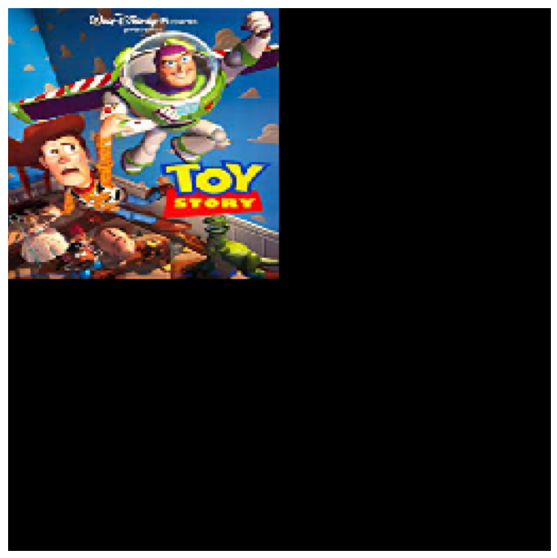

8.3

In [273]:
plt.figure(figsize = (10, 10))
plt.imshow(poster_images[0, :, :, :])
plt.xticks([])
plt.yticks([])
plt.show()
poster_genre_df["IMDB Score"][0]

It looks like everything set accordingly and there isn't any missing or skipped data. I will continue the process and build my CNN and MLP models.

In [326]:
#Splitting the data into two dataset, X for every column except the target column and y as target column
X = poster_genre_df.drop(["Poster", "IMDB Score","title","id"], axis=1)
y = poster_genre_df["IMDB Score"]
print(X.shape, y.shape)

(14047, 24) (14047,)


In [327]:
X.head(5)

,Action,Adult,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,...,Musical,Mystery,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western
0,0,0,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0


In [276]:
y.head(5)

0    8.3
1    6.9
2    6.6
3    5.7
4    5.9
Name: IMDB Score, dtype: float64

In [277]:
from tensorflow import keras
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential, Model
import tensorflow.keras.layers as Layers
from sklearn import preprocessing
from sklearn.preprocessing import LabelBinarizer,MinMaxScaler
from tensorflow.keras import Sequential, Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import BatchNormalization,Conv2D,MaxPooling2D,Activation,Dropout,Dense,Flatten,Input
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

**For MLP:**

In [278]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 1234, shuffle = True)

print('Training data has ' + str(X_train.shape[0]) + ' observation with ' + str(X_train.shape[1]) + ' features')
print('Test data has ' + str(X_test.shape[0]) + ' observation with ' + str(X_test.shape[1]) + ' features')

Training data has 11237 observation with 24 features
Test data has 2810 observation with 24 features


In [279]:
#Feature Scaling
scaler = preprocessing.MinMaxScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test) 

In [280]:
X_learn, X_val, y_learn, y_val = train_test_split(X_train, y_train, test_size = 0.2,
                                                  random_state = 1234, shuffle = True)

print('Learn data has ' + str(X_learn.shape[0]) + ' observation with ' + str(X_learn.shape[1]) + ' features')
print('Validaton data has ' + str(X_val.shape[0]) + ' observation with ' + str(X_val.shape[1]) + ' features')

Learn data has 8989 observation with 24 features
Validaton data has 2248 observation with 24 features


**For CNN:**

In [281]:
Xtrain_cnn, Xtest_cnn, ytrain_cnn, ytest_cnn = train_test_split(poster_images,y, test_size=0.2, random_state=1234)

print('Training data length: ' + str(len(Xtrain_cnn)))
print('Test data length: ' + str(len(Xtest_cnn)))

Training data length: 11237
Test data length: 2810


In [282]:
Xlearn_cnn, Xval_cnn, ylearn_cnn, yval_cnn = train_test_split(Xtrain_cnn, ytrain_cnn, test_size=0.2, random_state=1234)

print('Training data length: ' + str(len(Xlearn_cnn)))
print('Test data length: ' + str(len(Xval_cnn)))

Training data length: 8989
Test data length: 2248


**For MLP + CNN:**

In [283]:
prepared_cnn_mlp = poster_genre_df.drop(["Poster","title","id","Action"], axis=1)
prepared_cnn_mlp

,IMDB Score,Adult,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,...,Musical,Mystery,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western
0,8.3,0,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,6.9,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,6.6,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,5.7,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
4,5.9,0,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41402,6.2,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
41403,4.7,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
41410,4.5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43604,9.5,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [284]:
poster_images.shape

(14047, 256, 256, 3)

In [285]:
trainAttrX, testAttrX, trainImagesX, testImagesX = train_test_split(prepared_cnn_mlp, poster_images, test_size=0.2, random_state=1234)


In [286]:
trainAttrX

,IMDB Score,Adult,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,...,Musical,Mystery,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western
4626,4.7,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
12738,5.7,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
21126,4.6,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
15601,6.2,0,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
12841,7.6,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30307,6.6,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
12772,3.9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1692,5.7,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
16917,6.1,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [287]:
print(trainAttrX.shape,testAttrX.shape,trainImagesX.shape,testImagesX.shape)

(11237, 24) (2810, 24) (11237, 256, 256, 3) (2810, 256, 256, 3)


In [288]:
maxPrice_mi1 = trainAttrX["IMDB Score"].max()
trainAttrX_mi1 = trainAttrX["IMDB Score"] / maxPrice_mi1
testAttrX_mi1 = testAttrX["IMDB Score"] / maxPrice_mi1

In [289]:
learnX, valX, learny, valy = train_test_split(trainAttrX, trainImagesX, test_size = 0.2,
                                                  random_state = 1234, shuffle = True)
print(learnX.shape,valX.shape,learny.shape,valy.shape)

(8989, 24) (2248, 24) (8989, 256, 256, 3) (2248, 256, 256, 3)


In [290]:
maxPrice_mi = learnX["IMDB Score"].max()
trainY_mi = learnX["IMDB Score"] / maxPrice_mi
testY_mi = valX["IMDB Score"] / maxPrice_mi

In [291]:
cs = MinMaxScaler()
learnX = cs.fit_transform(learnX)
valX = cs.transform(valX)

### Model Selection and Evaluation

**(ANN) Multi-Layer Perceptron Model:** 

In [334]:
es1 = EarlyStopping(monitor='loss', mode='min', verbose=1, patience=20)
es2 = EarlyStopping(monitor='mean_absolute_error', mode='min', verbose=1, patience=20)

In [335]:
model = keras.Sequential([
    keras.layers.Dense(32, name = "First_RELU", activation = "relu",input_dim = X_learn.shape[1]),
    keras.layers.Dropout(0.4, name = "Dropout_1"), # To Avoid Overfitting and Underfitting
    keras.layers.Dense(16, name = "Second_RELU", activation = "relu"),
    keras.layers.Dropout(0.4, name = "Dropout_2"), # To Avoid Overfitting and Underfitting
    keras.layers.Dense(8, name = "Third_RELU", activation = "relu"),
    keras.layers.Dense(1, name = "Output_Sigmoid", activation = "linear")
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 First_RELU (Dense)          (None, 32)                800       
                                                                 
 Dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 Second_RELU (Dense)         (None, 16)                528       
                                                                 
 Dropout_2 (Dropout)         (None, 16)                0         
                                                                 
 Third_RELU (Dense)          (None, 8)                 136       
                                                                 
 Output_Sigmoid (Dense)      (None, 1)                 9         
                                                                 
Total params: 1,473
Trainable params: 1,473
Non-traina

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


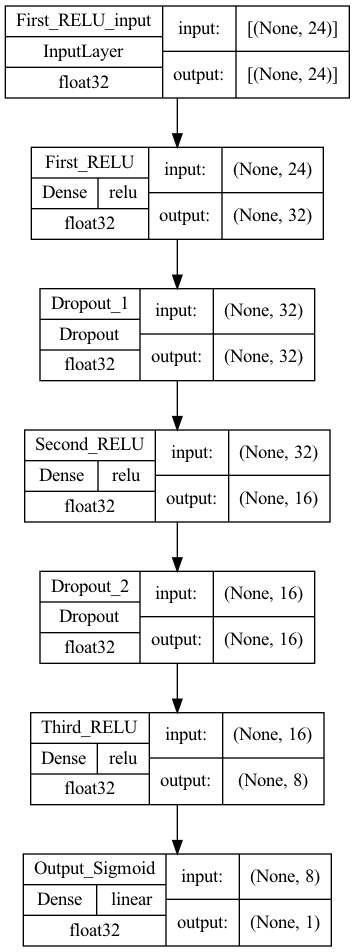

In [336]:
keras.utils.plot_model(model,show_shapes = True,
                       show_dtype = True,show_layer_activations = True)

In [337]:
model.compile(optimizer = "adam",
                  loss = "mean_squared_error",
                  metrics = ["mean_absolute_error","mean_absolute_percentage_error"])

In [338]:
model_history = model.fit(X_learn, y_learn,
                          epochs = 100,
                          verbose = 1, batch_size = 32,
                          callbacks=[es1,es2],
                          validation_data = (X_val, y_val))

Epoch 1/100
  8/281 [..............................] - ETA: 2s - loss: 37.6822 - mean_absolute_error: 6.0301 - mean_absolute_percentage_error: 95.2570  

2022-09-06 06:33:37.375179: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


281/281 [==============================] - ETA: 0s - loss: 10.0988 - mean_absolute_error: 2.5142 - mean_absolute_percentage_error: 40.2790

2022-09-06 06:33:39.454967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


281/281 [==============================] - 2s 8ms/step - loss: 10.0988 - mean_absolute_error: 2.5142 - mean_absolute_percentage_error: 40.2790 - val_loss: 2.1151 - val_mean_absolute_error: 1.2109 - val_mean_absolute_percentage_error: 19.7578
Epoch 2/100
281/281 [==============================] - 2s 7ms/step - loss: 2.3848 - mean_absolute_error: 1.2268 - mean_absolute_percentage_error: 20.8134 - val_loss: 1.5594 - val_mean_absolute_error: 1.0280 - val_mean_absolute_percentage_error: 17.2182
Epoch 3/100
281/281 [==============================] - 2s 7ms/step - loss: 1.5960 - mean_absolute_error: 0.9957 - mean_absolute_percentage_error: 17.2694 - val_loss: 1.5444 - val_mean_absolute_error: 1.0325 - val_mean_absolute_percentage_error: 17.1575
Epoch 4/100
281/281 [==============================] - 2s 8ms/step - loss: 1.3467 - mean_absolute_error: 0.9107 - mean_absolute_percentage_error: 16.0997 - val_loss: 1.5024 - val_mean_absolute_error: 1.0198 - val_mean_absolute_percentage_error: 16.9859

In [339]:
print('Training_set_results: {}'.format(model.evaluate(X_learn, y_learn)))
print('Validation_set_results: {}'.format(model.evaluate(X_val, y_val)))
print('Test_set_results: {}'.format(model.evaluate(X_test, y_test)))

281/281 [==============================] - 1s 5ms/step - loss: 1.2656 - mean_absolute_error: 0.9246 - mean_absolute_percentage_error: 15.2649
Training_set_results: [1.265633463859558, 0.9246323704719543, 15.264915466308594]
71/71 [==============================] - 0s 4ms/step - loss: 1.2753 - mean_absolute_error: 0.9284 - mean_absolute_percentage_error: 15.8138
Validation_set_results: [1.2753127813339233, 0.9283788204193115, 15.813810348510742]
88/88 [==============================] - 0s 5ms/step - loss: 1.2570 - mean_absolute_error: 0.9264 - mean_absolute_percentage_error: 15.1009
Test_set_results: [1.2569745779037476, 0.9264487028121948, 15.100913047790527]


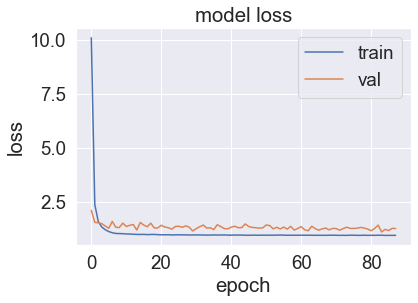

In [341]:
plt.plot(model_history.history["loss"])
plt.plot(model_history.history["val_loss"])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

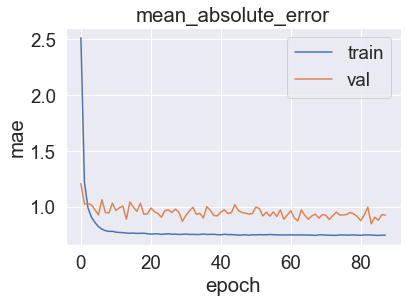

In [394]:
plt.plot(model_history.history["mean_absolute_error"])
plt.plot(model_history.history["val_mean_absolute_error"])
plt.title('mean_absolute_error')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

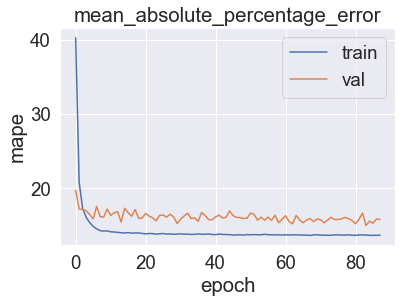

In [395]:
plt.plot(model_history.history["mean_absolute_percentage_error"])
plt.plot(model_history.history["val_mean_absolute_percentage_error"])
plt.title('mean_absolute_percentage_error')
plt.ylabel('mape')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

**Predicting new genre incomes and return the predicted IMDB score for the selected film:**

In [360]:
temp_x_df = X[X.index ==0].copy()
temp_x_df = temp_x_df.replace(1,0)
user_number_selection = int(input("Please enter how many genres you want to predict: "))
for i in range(user_number_selection):
    user_genre_selection = str(input("Please enter the genre: "))
    if user_genre_selection in X.columns:
        temp_x_df[user_genre_selection] = 1
    else:
        print("The genre you entered is not included. Please retry again!")
print(model.predict(temp_x_df)[0][0])

Please enter how many genres you want to predict: 3
Please enter the genre: Action
Please enter the genre: Comedy
Please enter the genre: Romance
1/1 [==============================] - 0s 13ms/step
5.1673617


**CNN Model:** 

In [292]:
CNN_model = keras.models.Sequential([
            keras.layers.Input(shape = (Xlearn_cnn.shape[1] , 
                                        Xlearn_cnn.shape[2] ,
                                        Xlearn_cnn.shape[3] )),
            keras.layers.Conv2D(16,kernel_size = (3, 3)),
            keras.layers.Activation("relu"),
            keras.layers.BatchNormalization(axis=-1),
            keras.layers.MaxPooling2D(pool_size=(2, 2), strides = 2),
    
            keras.layers.Conv2D(32,kernel_size = (3, 3)),
            keras.layers.Activation("relu"),
            keras.layers.BatchNormalization(axis=-1),
            keras.layers.MaxPooling2D(pool_size=(2, 2), strides = 2),
    
            keras.layers.Conv2D(64,kernel_size = (3, 3)),
            keras.layers.Activation("relu"),
            keras.layers.BatchNormalization(axis=-1),
            keras.layers.MaxPooling2D(pool_size=(2, 2), strides = 2),
    
            keras.layers.Flatten(),
            keras.layers.Dense(8, activation = "relu"),
            keras.layers.BatchNormalization(axis=-1),
            keras.layers.Dropout(0.5),
            keras.layers.Dense(4, activation = "relu"),
            keras.layers.Dense(1, activation = "linear")
])

CNN_model.summary()

2022-09-06 04:20:00.767016: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-09-06 04:20:00.767268: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Metal device set to: Apple M1 Max
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 activation (Activation)     (None, 254, 254, 16)      0         
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 activation_1 (Activat

In [293]:
# compiled network
CNN_model.compile(optimizer = "adam",
                  loss = "mean_squared_error",
                  metrics = ["mean_absolute_error","mean_absolute_percentage_error"])

In [294]:
early_stopping1 = keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 30, restore_best_weights=True)
early_stopping2 = keras.callbacks.EarlyStopping(monitor = "mean_absolute_percentage_error",patience = 30, restore_best_weights=True)

# learned network
cnn_history = CNN_model.fit(Xlearn_cnn, ylearn_cnn, epochs=100, batch_size=32,
                            verbose = 1, 
                            callbacks=[early_stopping1,early_stopping2],
                            validation_data = (Xval_cnn, yval_cnn))

Epoch 1/100


2022-09-06 04:20:13.203808: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-09-06 04:20:13.500305: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


281/281 [==============================] - ETA: 0s - loss: 30.3252 - mean_absolute_error: 4.8111 - mean_absolute_percentage_error: 75.2344

2022-09-06 04:20:27.137864: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


281/281 [==============================] - 15s 51ms/step - loss: 30.3252 - mean_absolute_error: 4.8111 - mean_absolute_percentage_error: 75.2344 - val_loss: 20.9443 - val_mean_absolute_error: 3.6723 - val_mean_absolute_percentage_error: 59.3365
Epoch 2/100
281/281 [==============================] - 12s 44ms/step - loss: 12.4833 - mean_absolute_error: 2.7671 - mean_absolute_percentage_error: 43.8093 - val_loss: 38.9513 - val_mean_absolute_error: 5.6702 - val_mean_absolute_percentage_error: 96.0826
Epoch 3/100
281/281 [==============================] - 12s 44ms/step - loss: 6.6680 - mean_absolute_error: 2.0111 - mean_absolute_percentage_error: 32.8595 - val_loss: 35.2655 - val_mean_absolute_error: 5.8172 - val_mean_absolute_percentage_error: 91.8816
Epoch 4/100
281/281 [==============================] - 13s 46ms/step - loss: 4.7672 - mean_absolute_error: 1.7092 - mean_absolute_percentage_error: 28.4872 - val_loss: 27.5464 - val_mean_absolute_error: 5.0583 - val_mean_absolute_percentage_e

In [295]:
print('Training_set_results: {}'.format(CNN_model.evaluate(Xlearn_cnn, ylearn_cnn)))
print('Validation_set_results: {}'.format(CNN_model.evaluate(Xval_cnn, yval_cnn)))
print('Test_set_results: {}'.format(CNN_model.evaluate(Xtest_cnn, ytest_cnn)))

281/281 [==============================] - 4s 13ms/step - loss: 1.3204 - mean_absolute_error: 0.8967 - mean_absolute_percentage_error: 16.5681
Training_set_results: [1.320387601852417, 0.8966584801673889, 16.56814193725586]
71/71 [==============================] - 1s 13ms/step - loss: 1.4190 - mean_absolute_error: 0.9258 - mean_absolute_percentage_error: 17.6848
Validation_set_results: [1.418980598449707, 0.925776481628418, 17.68480110168457]
88/88 [==============================] - 1s 13ms/step - loss: 1.3117 - mean_absolute_error: 0.8985 - mean_absolute_percentage_error: 16.2780
Test_set_results: [1.3117382526397705, 0.8985249400138855, 16.278005599975586]


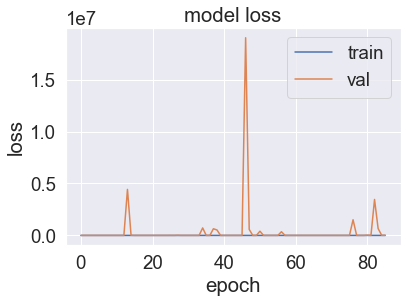

In [296]:
plt.plot(cnn_history.history["loss"])
plt.plot(cnn_history.history["val_loss"])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

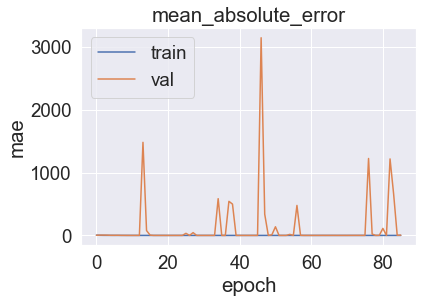

In [396]:
plt.plot(cnn_history.history["mean_absolute_error"])
plt.plot(cnn_history.history["val_mean_absolute_error"])
plt.title('mean_absolute_error')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

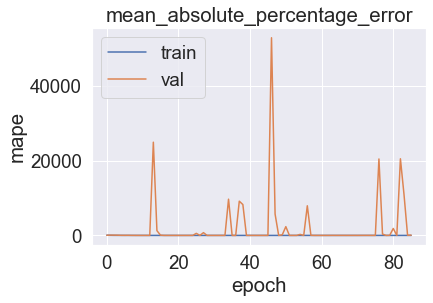

In [398]:
plt.plot(cnn_history.history["mean_absolute_percentage_error"])
plt.plot(cnn_history.history["val_mean_absolute_percentage_error"])
plt.title('mean_absolute_percentage_error')
plt.ylabel('mape')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [321]:
import urllib.request
for j in range(1):
    try:
        image_input = str(input("Please enter the '.jpg' format you want to predict the IMDB score: "))
        save_name = "new_image.jpg"
        urllib.request.urlretrieve(image_input, f"./poster_images/{save_name}")
    except:
        pass

Please enter the '.jpg' format you want to predict the IMDB score: https://upload.wikimedia.org/wikipedia/commons/e/e3/Kaplumba%C4%9Fa_Terbiyecisi.jpg


In [322]:
def load_new_poster_images(data_path, l, image_size):
    poster_images = np.zeros((l, 2 * image_size[0], 2 * image_size[1], 3),
                             dtype = "uint8")
    for i in range(l):
        try:
            loaded = tf.keras.utils.load_img("./{}/new_image.jpg".format(data_path,i),target_size = image_size)
            poster_images[i, 0:image_size[0], 0:image_size[1], :] = loaded
        except:
            pass
    return poster_images

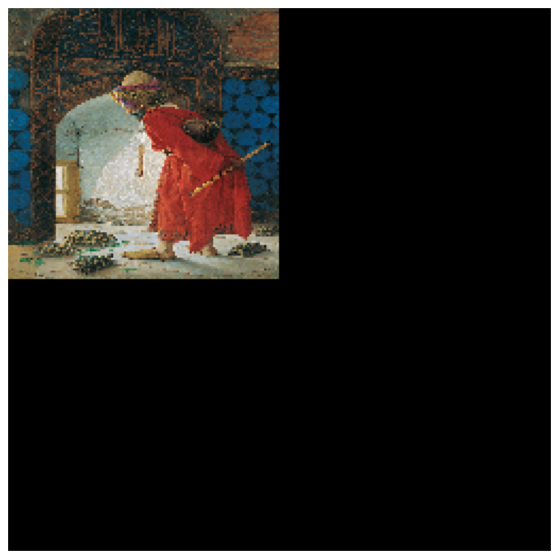

In [323]:
new_poster_image = load_new_poster_images("poster_images", 1, (128, 128))
new_poster_image = new_poster_image/255.0
plt.figure(figsize = (10, 10))
plt.imshow(new_poster_image[0, :, :, :])
plt.xticks([])
plt.yticks([])
plt.show()

In [324]:
new_poster_prediction = CNN_model.predict(new_poster_image, verbose=0)[0][0]
print(new_poster_prediction)

6.299227


**(MLP + CNN) Multiple Inputs:**

In [400]:
mlp_model = Sequential()
mlp_model.add(Dense(16, input_dim=X_learn.shape[1], activation="relu"))
mlp_model.add(Dropout(0.4))
mlp_model.add(Dense(8, activation="relu"))

mlp_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 16)                400       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_4 (Dense)             (None, 8)                 136       
                                                                 
Total params: 536
Trainable params: 536
Non-trainable params: 0
_________________________________________________________________


In [401]:
cnn_model = Sequential()
cnn_model.add(Input(shape = (Xlearn_cnn.shape[1] , 
                                        Xlearn_cnn.shape[2] ,
                                        Xlearn_cnn.shape[3])))
cnn_model.add(Conv2D(16,kernel_size = (3, 3), activation="relu"))
cnn_model.add(BatchNormalization(axis=-1))
cnn_model.add(MaxPooling2D(pool_size=(2, 2), strides = 2))

cnn_model.add(Conv2D(32,kernel_size = (3, 3), activation="relu"))
cnn_model.add(BatchNormalization(axis=-1))
cnn_model.add(MaxPooling2D(pool_size=(2, 2), strides = 2))

cnn_model.add(Conv2D(64,kernel_size = (3, 3), activation="relu"))
cnn_model.add(BatchNormalization(axis=-1))
cnn_model.add(MaxPooling2D(pool_size=(2, 2), strides = 2))

cnn_model.add(Flatten())
cnn_model.add(Dense(16, activation = "relu"))
cnn_model.add(BatchNormalization(axis=-1))
cnn_model.add(Dropout(0.5))
cnn_model.add(Dense(8, activation = "relu"))

cnn_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 batch_normalization_4 (Batc  (None, 254, 254, 16)     64        
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 127, 127, 16)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 batch_normalization_5 (Batc  (None, 125, 125, 32)     128       
 hNormalization)                                                 
                                                      

In [402]:
from tensorflow.keras.layers import concatenate
combinedInput = concatenate([mlp_model.output, cnn_model.output])

In [403]:
x = Dense(4, activation="relu")(combinedInput)
x = Dense(1, activation="linear")(x)

In [404]:
model_mi = Model(inputs=[mlp_model.input, cnn_model.input], outputs=x)
model_mi.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 254, 254, 16  448         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_4 (BatchNo  (None, 254, 254, 16  64         ['conv2d_3[0][0]']               
 rmalization)                   )                                                             

In [405]:
model_mi.compile(optimizer = "adam",
                  loss = "mean_squared_error",
                  metrics = ["mean_absolute_error","mean_absolute_percentage_error"])

In [406]:
early_stopping1 = keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 5, restore_best_weights=True)
early_stopping2 = keras.callbacks.EarlyStopping(monitor = "mean_absolute_percentage_error",patience = 5, restore_best_weights=True)

model_mi_history = model_mi.fit(x=[learnX, learny], y=trainY_mi,
                                epochs=20, batch_size=16,
                                callbacks=[early_stopping1,early_stopping2],
                                validation_data=([valX, valy], testY_mi))

Epoch 1/20


2022-09-09 04:04:07.938924: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


562/562 [==============================] - ETA: 0s - loss: 0.0936 - mean_absolute_error: 0.2030 - mean_absolute_percentage_error: 31.6812

2022-09-09 04:04:32.695113: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


562/562 [==============================] - 28s 49ms/step - loss: 0.0936 - mean_absolute_error: 0.2030 - mean_absolute_percentage_error: 31.6812 - val_loss: 0.0209 - val_mean_absolute_error: 0.1122 - val_mean_absolute_percentage_error: 17.2800
Epoch 2/20
562/562 [==============================] - 25s 45ms/step - loss: 0.0153 - mean_absolute_error: 0.0966 - mean_absolute_percentage_error: 15.8817 - val_loss: 3.0905 - val_mean_absolute_error: 0.1589 - val_mean_absolute_percentage_error: 24.9041
Epoch 3/20
562/562 [==============================] - 25s 45ms/step - loss: 0.0095 - mean_absolute_error: 0.0763 - mean_absolute_percentage_error: 12.7211 - val_loss: 2.2551 - val_mean_absolute_error: 0.1470 - val_mean_absolute_percentage_error: 24.2046
Epoch 4/20
562/562 [==============================] - 25s 45ms/step - loss: 0.0062 - mean_absolute_error: 0.0611 - mean_absolute_percentage_error: 10.2306 - val_loss: 0.0206 - val_mean_absolute_error: 0.0926 - val_mean_absolute_percentage_error: 15.

In [407]:
print('Training_set_results: {}'.format(model_mi.evaluate([learnX, learny],trainY_mi)))
print('Validation_set_results: {}'.format(model_mi.evaluate([valX, valy], testY_mi)))
print('Test_set_results: {}'.format(model_mi.evaluate([trainAttrX, trainImagesX],trainAttrX_mi1)))

281/281 [==============================] - 8s 26ms/step - loss: 0.0200 - mean_absolute_error: 0.1262 - mean_absolute_percentage_error: 18.5959
Training_set_results: [0.01997789926826954, 0.12624050676822662, 18.595853805541992]
71/71 [==============================] - 2s 25ms/step - loss: 0.0139 - mean_absolute_error: 0.0961 - mean_absolute_percentage_error: 15.1858
Validation_set_results: [0.013897706754505634, 0.09614589065313339, 15.185751914978027]
  1/352 [..............................] - ETA: 1:22 - loss: 7.5090 - mean_absolute_error: 2.6988 - mean_absolute_percentage_error: 424.8858

2022-09-09 04:09:22.629348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


352/352 [==============================] - 17s 48ms/step - loss: 6.6657 - mean_absolute_error: 2.5433 - mean_absolute_percentage_error: 381.3970
Test_set_results: [6.665688991546631, 2.543280601501465, 381.39697265625]


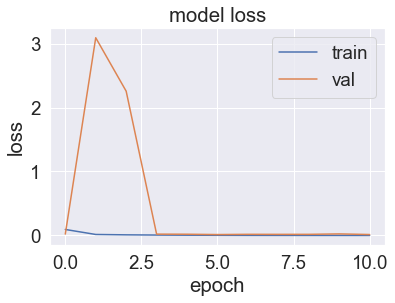

In [408]:
plt.plot(model_mi_history.history["loss"])
plt.plot(model_mi_history.history["val_loss"])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

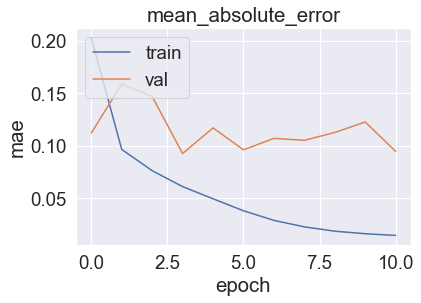

In [409]:
plt.plot(model_mi_history.history["mean_absolute_error"])
plt.plot(model_mi_history.history["val_mean_absolute_error"])
plt.title('mean_absolute_error')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

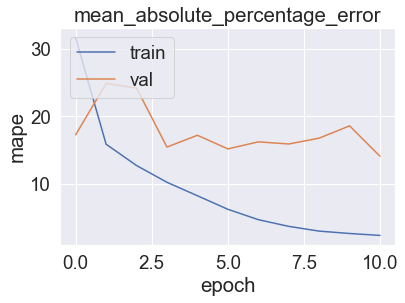

In [410]:
plt.plot(model_mi_history.history["mean_absolute_percentage_error"])
plt.plot(model_mi_history.history["val_mean_absolute_percentage_error"])
plt.title('mean_absolute_percentage_error')
plt.ylabel('mape')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## 4- Foxie Chatbot

In [310]:
file = open('foxie_chatbot.txt','r',errors = 'ignore')
foxie_raw = file.read()
foxie_raw  = foxie_raw.lower()

#### Tokenisation

In [311]:
sent_tokens = nltk.sent_tokenize(foxie_raw) #list of sentences 
word_tokens = nltk.word_tokenize(foxie_raw) #list of words

In [312]:
lemmatizer = nltk.stem.WordNetLemmatizer()

def LemTokens(tokens):
    return [lemmatizer.lemmatize(token) for token in tokens]

remove_punct_dict = dict((ord(punct), None) for punct in string.punctuation)

def LemNormalize(text):
    return LemTokens(nltk.word_tokenize(text.lower().translate(remove_punct_dict)))

In [313]:
GREETING_INPUTS = ("hello", "hi", "greetings", "sup", "what's up","hey")
GREETING_RESPONSES = ["hi", "hey", "hi there", "hello", "I am glad! You are talking to me"]

#for sentiment part
sentimentanalysis = ("sentiment analysis","sentiment")
falsesentiment = ("false sentiment","false sentiment analysis","false positive","false negative","false","fp","fn")
truesentiment = ("true sentiment","true sentiment analysis","true positive","true negative","true","tp","tn")

def greeting(sentence):
    for word in sentence.split():
        if word.lower() in GREETING_INPUTS:
            return random.choice(GREETING_RESPONSES)
        elif word.lower() in sentimentanalysis:
            return(hugging_sentiment)
        elif word.lower() in falsesentiment:
            return(hugging_fp_fn)
        elif word.lower() in truesentiment:
            return(hugging_tp_tn)

In [314]:
def response(user_response):
    foxie_response=''
    sent_tokens.append(user_response)
    TfidfVec = TfidfVectorizer(tokenizer=LemNormalize, stop_words='english')
    tfidf = TfidfVec.fit_transform(sent_tokens)
    vals = cosine_similarity(tfidf[-1], tfidf)
    idx=vals.argsort()[0][-2]
    flat = vals.flatten()
    flat.sort()
    req_tfidf = flat[-2]
    if(req_tfidf==0):
        foxie_response=foxie_response+"I am sorry, I didn't understand you! Please, ask in another way."
        return foxie_response
    else:
        foxie_response = foxie_response+sent_tokens[idx]
        return foxie_response

In [315]:
genre_list = X.columns.to_list()
genre_string = " ".join(genre_list)
#genre_list
#genre_string

In [316]:
Movies_list = Movies["title"].to_list()
#Movies_list

In [317]:
content_movies_soup_list = content_movies_soup["title"].to_list()
#content_movies_soup_list

In [367]:
def foxie_chatbot():
    flag=True
    print("Foxie: Hello, my name is Foxie. I will answer your queries.")
    username = str(input("Please enter your name: "))
    print("Foxie: Welcome {}, nice to meet you. I will give you recommendations based on your preferences.".format(username))
    while(flag==True):
        print("Foxie: You are now in -> General Section <-")
        print("Foxie: If you want to use recommender please write 'recommender', to explore deep learning preditions please write 'deep learning analysis', to see sentiment analysis please write 'sentiment', to explore EDA process please write 'eda', else write anything you want to get information about chatbots, to exit type 'Bye'.".format(username))
        user_response = str(input(username+": "))
        user_response = user_response.lower()
        if(user_response != 'bye'):
            #EDA PART
            if (user_response == 'eda'):
                print("Foxie: You are now in -> EDA Section <-")
                print("Foxie: What do you want to see on EDA? Options: 'title wordcloud', 'overview wordcloud', 'Top 10 Revenue Movies Based on Sum','Top 10 Collection Revenue Movies Based on Sum','Top 10 Collection Revenue Movies Based on Mean','Top 10 Collection Companies Based On Total Revenue','Top 10 Platform Based On Total Revenue','Top 10 Ratings','Less 10 Ratings','Top 10 Collection Revenue Movies Based on Count','Top 10 Less Profitted Movies','Except English Count','Directors and Genres Comparison','Top Genres Total'")
                user_response2 = str(input(username+": "))
                if(user_response2 == 'title wordcloud'):
                    title_wordcloud = WordCloud(width=1000, height=600, max_words=100,
                                                random_state=1,background_color = 'white',
                                                stopwords = STOPWORDS,
                                                contour_width = 1,
                                                collocations=False,
                                                contour_color = 'black', 
                                                colormap='gist_heat').generate(' '.join(Movies['title']))
                    plt.figure(figsize=(10,8))
                    plt.imshow(title_wordcloud,interpolation="bilinear")
                    plt.axis('off')
                    plt.show()
                    print("Foxie: If you want to use recommender please write 'recommender',to see sentiment analysis please write 'sentiment',to explore EDA process please write 'eda',else write anything you want to get information about chatterbots,to exit type 'Bye'")
                elif(user_response2 == 'overview wordcloud'):
                    overview_wordcloud = WordCloud(width=1000, height=600, max_words=100,
                                                   random_state=1,background_color = 'white',
                                                   stopwords = STOPWORDS,
                                                   contour_width = 1,
                                                   collocations=False,
                                                   contour_color = 'black', 
                                                   colormap='gist_heat').generate(' '.join(Movies['overview']))
                    plt.figure(figsize=(10,8))
                    plt.imshow(overview_wordcloud,interpolation="bilinear")
                    plt.axis('off')
                    plt.show()
                    print("Foxie: If you want to use recommender please write 'recommender',to see sentiment analysis please write 'sentiment',to explore EDA process please write 'eda',else write anything you want to get information about chatterbots,to exit type 'Bye'")
                elif(user_response2 == "Top 10 Revenue Movies Based on Sum"):
                    fig, ax = plt.subplots(figsize=(15,5))
                    sns.set_style('dark')
                    sns.barplot(data=movie_revenue_title_pivot.sort_values("sum", ascending=False).head(10),
                                x="sum", y=movie_revenue_title_pivot.sort_values("sum", ascending=False).head(10).title);
                    plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
                    plt.ylabel("") 
                    plt.xlabel("")
                    plt.title("Top 10 Revenue Movies Based on Sum", fontsize=16)
                    plt.show()
                elif(user_response2 == "Top 10 Collection Revenue Movies Based on Sum"):
                    fig, ax = plt.subplots(figsize=(15,5))
                    sns.set_style('dark')
                    sns.barplot(data=movie_revenue_collection_pivot.sort_values("sum", ascending=False).head(10),
                                x="sum", y=movie_revenue_collection_pivot.sort_values("sum", ascending=False).head(10).belongs_to_collection);
                    plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
                    plt.ylabel("") 
                    plt.xlabel("")
                    plt.title("Top 10 Collection Revenue Movies Based on Sum", fontsize=16)
                    plt.show()
                elif(user_response2 == "Top 10 Collection Revenue Movies Based on Mean"):
                    fig, ax = plt.subplots(figsize=(15,5))
                    sns.set_style('dark')
                    sns.barplot(data=movie_revenue_collection_pivot.sort_values("mean", ascending=False).head(10),
                                x="mean", y=movie_revenue_collection_pivot.sort_values("mean", ascending=False).head(10).belongs_to_collection);
                    plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
                    plt.ylabel("") 
                    plt.xlabel("")
                    plt.title("Top 10 Collection Revenue Movies Based on Mean", fontsize=16)
                    plt.show()
                elif(user_response2 == "Top 10 Collection Companies Based On Total Revenue"):
                    fig, ax = plt.subplots(figsize=(15,5))
                    sns.set_style('dark')
                    sns.barplot(data=com_pivot.sort_values('Total', ascending=False).head(10),
                                x="Total", y=com_pivot.sort_values('Total', ascending=False).head(10).index);
                    plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
                    plt.ylabel("") 
                    plt.xlabel("")
                    plt.title("Top 10 Collection Companies Based On Total Revenue", fontsize=16)
                    plt.show()
                elif(user_response2 == "Top 10 Platform Based On Total Revenue"):
                    fig, ax = plt.subplots(figsize=(15,5))
                    sns.set_style('dark')
                    sns.barplot(data=plat_pivot.sort_values('Total', ascending=False).head(10),
                                x="Total", y=plat_pivot.sort_values('Total', ascending=False).head(10).index);
                    plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
                    plt.ylabel("") 
                    plt.xlabel("")
                    plt.title("Top 10 Platform Based On Total Revenue", fontsize=16)
                    plt.show()
                elif(user_response2 == "Top 10 Ratings"):
                    ratings_top10 = Movies.loc[(Movies.vote_count)>5000, ['title', 'vote_average','vote_count']].sort_values('vote_average', ascending=False).head(10)
                    plt.figure(figsize=(13,6))
                    sns.scatterplot(data=ratings_top10, x = "title", y = "vote_average", hue = "vote_count", 
                                    size = "vote_count", sizes=(20, 200), legend="full",
                                    alpha=.7, palette='muted')
                    sns.set(font_scale = 1.3)
                    plt.xticks(rotation = 90)
                    plt.ylabel('', fontsize=20, fontfamily='fantasy');
                    plt.title('Top 10 Ratings', fontsize=20 , pad=20, fontfamily='fantasy')
                    plt.xlabel('')
                    plt.show()
                elif(user_response2 == "Less 10 Ratings"):
                    ratings_top10 = Movies.loc[(Movies["vote_count"] != np.nan) & (Movies["vote_count"] != 0) & (Movies["vote_average"] != 0), ['title', 'vote_average','vote_count']].sort_values('vote_average', ascending=False).tail(10)
                    plt.figure(figsize=(13,6))
                    sns.scatterplot(data=ratings_top10, x = "title", y = "vote_average", hue = "vote_count", 
                                    size = "vote_count", sizes=(20, 200), legend="full",
                                    alpha=.7, palette='muted')

                    sns.set(font_scale = 1.3)
                    plt.xticks(rotation = 90)
                    plt.ylabel('', fontsize=20, fontfamily='fantasy');
                    plt.title('Less 10 Ratings', fontsize=20 , pad=20, fontfamily='fantasy')
                    plt.xlabel('')
                    plt.show()
                elif(user_response2 == "Top 10 Collection Revenue Movies Based on Count"):
                    fig, ax = plt.subplots(figsize=(15,5))
                    sns.set_style('dark')
                    sns.barplot(data=movie_revenue_collection_pivot.sort_values("count", ascending=False).head(10),
                                x="count", y=movie_revenue_collection_pivot.sort_values("count", ascending=False).head(10).belongs_to_collection);
                    plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
                    plt.ylabel("") 
                    plt.xlabel("")
                    plt.title("Top 10 Collection Revenue Movies Based on Count", fontsize=16)
                    plt.show()
                elif(user_response2 == "Top 10 Less Profitted Movies"):
                    fig, ax = plt.subplots(figsize=(15,5))
                    sns.set_style('dark')
                    sns.barplot(data=m_profit.sort_values("profit", ascending=False).tail(10),
                                x="profit", y=m_profit.sort_values("profit", ascending=False).tail(10).title);
                    plt.xticks(ha="left", fontsize=15); plt.yticks(fontsize=16)
                    plt.ylabel("") 
                    plt.xlabel("")
                    plt.title("Top 10 Less Profitted Movies", fontsize=16)
                    plt.show()
                elif(user_response2 == "Except English Count"):
                    fig, ax = plt.subplots()
                    ax.bar(language_dataframe.index, language_dataframe["number"], color="C0")
                    ax2 = ax.twinx()
                    ax2.plot(language_dataframe.index, language_dataframe["cumpercentage"], color="C1", marker="D", ms=7)
                    ax2.yaxis.set_major_formatter(PercentFormatter())
                    ax.tick_params(axis="y", colors="C1")
                    ax2.tick_params(axis="y", colors="C0")
                    plt.show()
                elif(user_response2 == "Directors and Genres Comparison"):
                    plt.figure(figsize=(30,10))
                    sns.set(font_scale=1.7)
                    sns.heatmap(director_genre_totals_sorted.T, annot=True)
                    plt.title('Directors and Genres Comparison Based on Total Films')
                    plt.xlabel('Directors')
                    plt.ylabel('Genres')
                    plt.xticks(rotation=-30, ha='left')
                    plt.show()
                elif(user_response2 == "Top Genres Total"):
                    plt.bar(range(len(sorted_d)), list(sorted_d.values()), align='center')
                    plt.xticks(range(len(sorted_d)), list(sorted_d.keys()),rotation = 90)
                    plt.ylabel('', fontsize=20, fontfamily='fantasy');
                    plt.title('Top Genres Total', fontsize=20 , pad=20, fontfamily='fantasy')
                    plt.xlabel('')
                    plt.show()
                else:
                    print("I am sorry, I didn't understand you! Please, ask in another way.")
                    
            #RECOMMENDER PART
            elif(user_response == 'recommender'):
                print("Foxie: You are now in -> Recommender Section <-")
                print("Foxie: What do you want to see on Recommender? Options: 'imdb simple recommender','simple recommender','couple simple recommender','content based recommender','collaborative filtering recommender','hybrid recommender'")
                user_response3 = str(input(username+": "))
                if(user_response3 == 'imdb simple recommender'):
                    print(imdb_top_250_simple_recommender[["title","score"]])
                elif(user_response3 == 'simple recommender'):
                    print(top_250_simple_recommenders[["title","score"]])
                elif(user_response3 == 'genre based simple recommender'):
                    user_response4 = str(input(username+": "))
                    genre_based_recommender = top_250_simple_recommender((genre_based_dataset(user_response4)),0.95)
                    print(genre_based_recommender[["title","score"]])
                elif(user_response3 == 'couple simple recommender'):
                    print("Foxie: Please enter the first genre")
                    user_response4 = str(input(username+": "))
                    print("Foxie: Please enter the second genre")
                    user_response5 = str(input(username+": "))
                    if ((user_response4 in genre_list) & (user_response5 in genre_list)):
                        couple_movies = couple_genre_simple_recommender(user_response4,user_response5)
                        couple_recommend = top_250_simple_recommender(couple_movies,0.95).head(10)
                        print(couple_recommend[["title","score"]])
                    else:
                        print("Sorry, I think you entered an ambigious genre. Please try another genre! If you need help about genre selection you can try these: "+genre_string)
                elif(user_response3 == 'content based recommender'):
                    print("Foxie: Please enter the film name")
                    user_response4 = str(input(username+": "))
                    if user_response4 in content_movies_soup_list:
                        content_based_recommendation = get_recommendations(user_response4)
                        print(content_based_recommendation)
                    else:
                        print("Sorry, I don't have the movie you wrote. Please try another movie.")
                elif(user_response3 == 'collaborative filtering recommender'):
                    print("Foxie: Please enter the film name")
                    user_response4 = str(input(username+": "))
                    if user_response4 in Movies_list:
                        collaborative_recommendation = collaborative_movie_recommendation(user_response4)
                        print(collaborative_recommendation)
                    else:
                        print("Sorry, I don't have the movie you wrote. Please try another movie.")
                elif(user_response3 == 'hybrid recommender'):
                    print("Foxie: Please enter your username(integer):")
                    user_response4 = int(input(username+": "))
                    print("Foxie: Please enter the movie name")
                    user_response5 = str(input(username+": "))
                    if ((user_response4 in Movie_id_list) & (user_response5 in Movies_movie_list)):
                        hybrid_function = hybrid_func(user_response4, user_response5)
                        print(hybrid_function)
                    else:
                        print("Sorry, I think you entered an ambigious movie. Please try another movie!")
                else:
                    print("I am sorry, I didn't understand you! Please, ask in another way.")
                    
            #SENTIMENT PART    
            elif(user_response == 'sentiment'):
                print("Foxie: You are now in -> Sentiment Section <-")
                print("Foxie: What do you want to see on Recommender? Options: 'new sentiment','sentiment observations','sentiment visuals','sentiment false positives and false negatives','sentiment true positives and true negatives'")
                user_response3 = str(input(username+": "))
                if(user_response3 == 'new sentiment'):
                    sentiment_dataset(select_imdb_id())
                    sentiment_data = pd.read_csv("data.csv",sep="\t")
                    sentiment_data['id'] = range(1, len(sentiment_data) + 1)
                    convert_dict = {'text': str,
                                'title': str,
                                'rating': int,
                                'sentiment': int,
                                'id': int
                                }
 
                    sentiment_data = sentiment_data.astype(convert_dict)
                    print(sentiment_data)
                elif(user_response3 == 'sentiment observations'):
                    print(hugging_sentiment)
                elif(user_response3 == 'sentiment visuals'):
                    hugging_df = hugging_face_df()
                    fig, axs = plt.subplots(1, 2, figsize=(12, 3))
                    sns.barplot(data=hugging_df, x='rating', y='Score_🤗', ax=axs[0])
                    sns.barplot(data=hugging_df, x='sentiment', y='Sentiment_🤗', ax=axs[1])
                    axs[0].set_title('Rating Comparison')
                    axs[0].set_xlabel("Rating")
                    axs[0].set_ylabel("Hugging Rating")
                    axs[1].set_title('Sentiment Comparison')
                    axs[1].set_xlabel("Sentiment")
                    axs[1].set_ylabel("Hugging Sentiment")
                    plt.tight_layout()
                    plt.show()
                elif(user_response3 == 'sentiment false positives and false negatives'):
                    hugging_df = hugging_face_df()
                    diff_hf = hugging_df[hugging_df["sentiment"] != hugging_df["Sentiment_🤗"]]
                    one_to_four = diff_hf[diff_hf["rating"] < 5].sort_values(by='Score_🤗', ascending=False)
                    eight_to_ten = diff_hf[diff_hf["rating"] > 5].sort_values(by='Score_🤗', ascending=False)
                    for index,row in one_to_four.iterrows():
                        a = "When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Positive! "+"The False Positive Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
                    for index,row in eight_to_ten.iterrows():
                        b = ". When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Negative! "+". The False Negative Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
                    c = str(a)+str(b)
                    c_rep = c.replace("\n", "")
                    print(c_rep)
                    
                elif(user_response3 == 'sentiment true positives and true negatives'):
                    hugging_df = hugging_face_df()
                    diff_hf = hugging_df[hugging_df["sentiment"] == hugging_df["Sentiment_🤗"]]
                    one_to_four = diff_hf[diff_hf["rating"] < 5].sort_values(by='Score_🤗', ascending=False)
                    eight_to_ten = diff_hf[diff_hf["rating"] > 5].sort_values(by='Score_🤗', ascending=False)
    
                    for index,row in one_to_four.iterrows():
                        a = "When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Negative! "+"The True Negative Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
                    for index,row in eight_to_ten.iterrows():
                        b = ". When rating is equal to {}".format(row["rating"])+" the Hugging Face sentimented it as Positive! "+". The True Positive Text: "+str(row["text"])+ " The Guess Score is " + str(row["Score_🤗"]) + " with value "+ str(row["Sentiment_🤗"])
                    c = a+b
                    c_rep = c.replace("\n", "")
                    print(c_rep)
                else:
                    print("I am sorry, I didn't understand you! Please, ask in another way.")
                    
            #DEEP LEARNING SECTION   
            elif(user_response == 'deep learning analysis'):
                print("Foxie: You are now in -> Deep Learning Section <-")
                print("Foxie: What do you want to see on this section? Options: 'MLP analysis','CNN analysis'")
                user_response3 = str(input(username+": "))
                
                if(user_response3 == 'CNN analysis'):
                    for j in range(1):
                        try:
                            image_input = str(input("Please enter the '.jpg' format you want to predict the IMDB score: "))
                            save_name = "new_image.jpg"
                            urllib.request.urlretrieve(image_input, f"./poster_images/{save_name}")
                        except:
                            pass
                    new_poster_image = load_new_poster_images("poster_images", 1, (128, 128))
                    new_poster_image = new_poster_image/255.0
                    new_poster_prediction = CNN_model.predict(new_poster_image, verbose=0)[0][0]
                    print(new_poster_prediction)
                    
                elif(user_response3 == 'MLP analysis'):
                    temp_x_df = X[X.index ==0].copy()
                    temp_x_df = temp_x_df.replace(1,0)
                    user_number_selection = int(input("Please enter how many genres you want to predict: "))
                    for i in range(user_number_selection):
                        user_genre_selection = str(input("Please enter the genre: "))
                        if user_genre_selection in X.columns:
                            temp_x_df[user_genre_selection] = 1
                        else:
                            print("The genre you entered is not included. Please retry again!")
                    print(model.predict(temp_x_df)[0][0])
                
            else:
                if(greeting(user_response)!=None):
                    print("Foxie: "+greeting(user_response))
                else:
                    print("Foxie: ",end="")
                    print(response(user_response))
                    sent_tokens.remove(user_response)
        else:
            flag=False
            print("Foxie: Bye! Hope you enjoyed my assisatance, take care...")

In [368]:
foxie_chatbot()

Foxie: Hello, my name is Foxie. I will answer your queries.
Please enter your name: Can
Foxie: Welcome Can, nice to meet you. I will give you recommendations based on your preferences.
Foxie: You are now in -> General Section <-
Foxie: If you want to use recommender please write 'recommender', to explore deep learning preditions please write 'deep learning analysis', to see sentiment analysis please write 'sentiment', to explore EDA process please write 'eda', else write anything you want to get information about chatbots, to exit type 'Bye'.
Can: bye
Foxie: Bye! Hope you enjoyed my assisatance, take care...


**Conclusion:**     
Chatbot can gather information of my passed EDA visualizations, create sentiment analysis based on scraped data by using new sentiment and after that sentimenting the reviews as positive or negative by displaying false positives,false negatives, true positives and true negatives with their visualizations, recommend movies based on three approaches as: simple, content-based and collaborative filtering. I didn't include the multi input deep learning recommendation and the bar chart race visualization on the EDA part, since they wouldn't make any good fit in this chatbot and it wouldn't be effective to create it.